In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import time
import logging
import os
import warnings
import itertools
from datetime import datetime, timedelta
from functools import partial
from pathlib import Path
from optimization_engines import genetic_algorithm, scipy_minimize, riskfolio_minimize

seed = 12
np.random.seed(seed)
msg_level = logging.INFO
# Suppress all RuntimeWarnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

## Portfolio Optimization using multiple engines

In [2]:
# Create a logger
logger = logging.getLogger("inspect_results_logger")
logger.setLevel(msg_level)  # Set the level for this logger

# Create a handler (where to send the logs)
handler = logging.StreamHandler()  # Send to the console
handler.setLevel(msg_level)

# Create a formatter (how to format the logs)
formatter = logging.Formatter("%(asctime)s - %(name)s - %(levelname)s - %(message)s")
handler.setFormatter(formatter)

# Add the handler to the logger
logger.addHandler(handler)

### Path definition

In [3]:
benchmark_path = '../data/benchmark_gspc.pkl'
source_path = '../data/stocks_adjclose.pkl'

### Data loading

Ticker,ds,^GSPC
0,2011-01-03,1271.869995
1,2011-01-04,1270.199951
2,2011-01-05,1276.560059
3,2011-01-06,1273.849976
4,2011-01-07,1271.500000


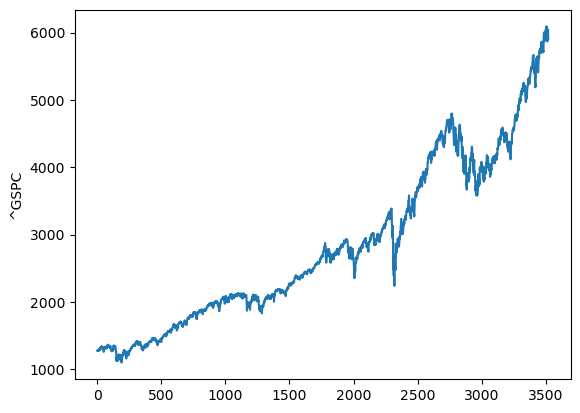

In [4]:
benchmark = pd.read_pickle(benchmark_path)
sns.lineplot(benchmark['^GSPC'])
benchmark.head()

In [5]:
source = pd.read_pickle(source_path)
source.head()

Ticker,A,AAPL,ABT,ACGL,ACN,ADBE,ADI,ADM,ADP,ADSK,...,WRB,WST,WTW,WY,WYNN,XEL,XOM,YUM,ZBH,ZBRA
ds,,,,,,,,,,,,,,,,,,,,,
2011-01-03,26.781836,9.917951,16.942663,9.349445,37.585785,31.290001,27.436106,20.712511,29.848969,39.270000,...,6.112024,18.971697,71.104691,11.828708,76.192101,14.700940,43.098133,26.977388,47.841393,38.200001
2011-01-04,26.532440,9.969709,17.102097,9.291334,37.338249,31.510000,27.125227,20.698887,29.741137,38.529999,...,6.072278,18.631702,69.911537,11.702991,78.568939,14.763333,43.300457,26.565216,47.206047,37.840000
2011-01-05,26.474880,10.051261,17.102097,9.305071,37.346004,32.220001,27.183071,20.794275,30.216925,41.240002,...,6.045782,18.713308,70.882263,12.068158,79.582596,14.675976,43.184826,26.691620,47.240875,37.799999
2011-01-06,26.526041,10.043136,17.066668,9.179339,37.485237,32.270000,27.334898,21.591436,30.451658,41.259998,...,5.977333,18.577297,71.084503,11.984348,80.162842,14.663502,43.462337,26.878460,45.778728,37.480000
2011-01-07,26.615564,10.115060,17.137522,9.109608,37.547104,32.040001,27.175838,21.768579,30.521458,40.759998,...,5.939793,18.486635,70.963158,12.313586,83.001091,14.794533,43.699345,27.213682,45.770027,37.599998


### Correlation Analysis

* Determine a set of stocks with minimal correlation

In [6]:
df_corr = source.corr()
df_corr.head()

Ticker,A,AAPL,ABT,ACGL,ACN,ADBE,ADI,ADM,ADP,ADSK,...,WRB,WST,WTW,WY,WYNN,XEL,XOM,YUM,ZBH,ZBRA
Ticker,,,,,,,,,,,,,,,,,,,,,
A,1.000000,0.938434,0.972057,0.803930,0.973666,0.944446,0.958391,0.877209,0.950709,0.946486,...,0.915526,0.962450,0.952409,0.840455,-0.192150,0.925082,0.581125,0.957106,0.742547,0.926361
AAPL,0.938434,1.000000,0.925958,0.904199,0.965640,0.912658,0.974905,0.858673,0.957237,0.883810,...,0.954041,0.944027,0.944347,0.799052,-0.274004,0.864298,0.709763,0.932155,0.609996,0.834967
ABT,0.972057,0.925958,1.000000,0.780764,0.974008,0.966874,0.947089,0.840192,0.947416,0.967112,...,0.905557,0.957242,0.959083,0.826124,-0.199613,0.959269,0.502779,0.961910,0.787986,0.938066
ACGL,0.803930,0.904199,0.780764,1.000000,0.859009,0.772929,0.921957,0.746998,0.908116,0.731481,...,0.943648,0.783657,0.889515,0.726342,-0.175307,0.746701,0.854873,0.878777,0.539229,0.617688
ACN,0.973666,0.965640,0.974008,0.859009,1.000000,0.962718,0.975225,0.861665,0.975261,0.940212,...,0.947315,0.970085,0.967641,0.856489,-0.227554,0.926912,0.623003,0.971591,0.727454,0.899654


#### Rank correlation ascending

In [7]:
# rank by correlation
corr_sum = df_corr.map(lambda x: abs(x)).sum()
corr_rank = corr_sum.sort_values().rank(method='min').astype(int)
corr_rank

Ticker
TPR       1
BKR       2
GE        3
WYNN      4
DVN       5
       ... 
TXN     435
TEL     436
ITW     437
ICE     438
HD      439
Length: 439, dtype: int64

#### Rank returns descending

In [8]:
# rank by returns
return_rank = source.diff().sum(axis=0).sort_values().rank(method='min', ascending=False).astype(int)
return_rank

Ticker
APA     439
MOS     438
SLB     437
DVN     436
PCG     435
       ... 
TDG       5
FICO      4
AZO       3
BKNG      2
NVR       1
Length: 439, dtype: int64

#### Select sets of 10 and 100 stocks with maximal returns and minimal correlation

In [9]:
select_10 = (return_rank + corr_rank).sort_values().reset_index()['Ticker'].values[:11]
select_10

array(['FICO', 'LLY', 'MCK', 'CHTR', 'GWW', 'AXON', 'REGN', 'RCL', 'RL',
       'TSLA', 'TPL'], dtype=object)

In [10]:
select_100 = (return_rank + corr_rank).sort_values().reset_index()['Ticker'].values[:101]
select_100

array(['FICO', 'LLY', 'MCK', 'CHTR', 'GWW', 'AXON', 'REGN', 'RCL', 'RL',
       'TSLA', 'TPL', 'MKTX', 'PWR', 'URI', 'TRGP', 'ZBRA', 'KLAC',
       'NFLX', 'ALGN', 'HUBB', 'AVGO', 'IBM', 'GE', 'BA', 'SPG', 'PH',
       'GNRC', 'ETN', 'BKNG', 'LULU', 'ERIE', 'DECK', 'AZO', 'WAB',
       'EXPE', 'CPAY', 'TDG', 'NVDA', 'BIIB', 'ULTA', 'TFX', 'SNPS',
       'MPWR', 'PODD', 'FDX', 'COST', 'LII', 'VRTX', 'TT', 'BLDR', 'MMM',
       'HUM', 'IT', 'CAT', 'ORLY', 'CAH', 'UAL', 'AMP', 'SBAC', 'UHS',
       'ESS', 'MHK', 'MTB', 'CDNS', 'GILD', 'EOG', 'WST', 'CRL', 'ADBE',
       'COR', 'GPN', 'GS', 'MSI', 'DIS', 'FFIV', 'JBL', 'IDXX', 'DE',
       'CLX', 'PGR', 'AJG', 'KKR', 'FRT', 'ADSK', 'DVA', 'VRSN', 'ANSS',
       'HES', 'XOM', 'CVX', 'MSCI', 'IRM', 'POOL', 'ISRG', 'INCY', 'TTWO',
       'NVR', 'COP', 'LIN', 'BDX', 'FIS'], dtype=object)

Defining Fitness Function for the calculation of Sharpe Ratio. I am using the Portfolio Variance as 

Portfolio variance = w12σ12 + w22σ22 + 2w1w2Cov1,2

### Porfolio Stats

In [11]:
def portfolio_stats(weights, data):

    weights = np.array(weights)
    returns =np.log(data) - np.log(data.shift(1)) # log return to minimize fp error
    #returns = data.pct_change().dropna()
    port_return = np.sum(returns.mean() * weights) 
    port_vol = np.sqrt(np.dot(weights.T, np.dot(returns.cov() , weights)))
    try:
        sharpe_ratio = port_return/port_vol
    except Exception as e:
        sharpe_ratio = 0
    return sharpe_ratio, port_return, port_vol

### Fitness function

In [12]:
def fitness_function(weights, data):
    sharpe_ratio, _, _ = portfolio_stats(weights, data)
    return sharpe_ratio

# def fitness_function(weights, data):
#     data_returns = np.log(data) - np.log(data.shift(1)) # current day - previous day
#     data_returns = data_returns.dropna()
#     portfolio_returns = np.dot(data_returns, weights)
#     portfolio_mean = np.mean(portfolio_returns)
#     portfolio_std = np.sum(np.sum(weights * np.std(portfolio_returns) * data.corr().values * np.std(portfolio_returns).T * weights.T, axis=1), axis=0)
#     sharpe_ratio = (portfolio_mean / portfolio_std) 
#     return sharpe_ratio

In [13]:
def curried_fitness(weights, data):
    port_return = partial(fitness_function, data)
    return port_return

def minimize_sharpe(weights):
    return -1 * curried_fitness(weights)

### Data generator

Data generator to instantiate blocks on demand

In [14]:
def generate_data(df, benchmark, days_to_avg=30, days_to_opt=30):
    df2 = df.reset_index()
    benchmark2 = benchmark.reset_index()
    elements = df2.sample(n=100).index # definint a maximum of 100 different sampled initial dates
    for idx in elements:
        df_sample = df2.iloc[idx-days_to_avg:idx+days_to_opt, :]
        df_sample = df_sample.set_index('ds')
        df_sample_b = benchmark2.iloc[idx-days_to_avg:idx+days_to_opt, :]
        df_sample_b = df_sample_b.set_index('ds').drop(['index'], axis=1)
        yield df_sample, df_sample_b

Main Backtest function. A similar function is defined in the bottom of this notebook for detailed testing.

In case we want to implement annualized returns: 

Annualized Return = (1 + Period Return)^(365/Number of Days in Period) - 1

### Backtest

In [15]:
def backtest(optimization_function, data, benchmark, initial_capital, avg_period, opt_period):
    portfolio_value = initial_capital
    portfolio_returns = []
    benchmark_returns = []
    portfolio_total_return = []
    portfolio_sharpe_ratios = []
    weights_history = pd.DataFrame(index=data.index, columns=data.columns)
    portfolio_value_history = pd.Series(index=data.index, name='Portfolio Value', dtype='float')
    portfolio_value_history.iloc[0] = portfolio_value


    j = 0
    for i in range(avg_period+1, avg_period + opt_period+1):
        df = data.iloc[j:i, :]
        df_pct = df.iloc[j:i, :].pct_change().dropna(axis=0)
        #logger.debug(f'df_pct: {df_pct}')
        weights = optimization_function(df)
        weights[weights < 0] = 0
        weights /= weights.sum()
        weights_history.loc[df.index[-1]] = weights
        #sharpe_ratio, portfolio_return, portfolio_volatility = portfolio_stats(weights, df)
        # portfolio_change = df.iloc[-2:, :].pct_change() * weights
        portfolio_change = df_pct.iloc[-1] * weights
        #portfolio_return = portfolio_change.sum(axis=1).iloc[-1]
        portfolio_return = portfolio_change.sum()
        portfolio_returns.append(portfolio_return)
        # print(f'portfolio returns: {portfolio_returns}')
        benchmark_return = benchmark.iloc[j:i, :].pct_change().iloc[-1].values.tolist()[0]
        benchmark_returns.append(benchmark_return)
        # print(f'benchmark_returns: {benchmark_returns}')
        portfolio_cumulative_returns = np.cumprod([k + 1 for k in portfolio_returns])
        # print(f'portfolio cumulative returns: {portfolio_cumulative_returns}')
        benchmark_cumulative_returns = np.cumprod([k + 1 for k in  benchmark_returns])
        # print(f'benchmark cumulative returns: {benchmark_cumulative_returns}')
        portfolio_mean_return = np.mean(portfolio_returns)
        benchmark_mean_return = np.mean(benchmark_returns)
        portfolio_volatility = np.std(portfolio_returns) 
        benchmark_volatility = np.std(benchmark_returns)
        try:
            sharpe_ratio = (portfolio_mean_return) / portfolio_volatility
        except Exception as e:
            sharpe_ratio = 0
        portfolio_sharpe_ratios.append(sharpe_ratio)

         # Portfolio & Benchmark value
        benchmark_value = initial_capital * benchmark_cumulative_returns[-1]
        portfolio_value = initial_capital * portfolio_cumulative_returns[-1]
        j += 1

    portfolio_cumulative_returns = portfolio_cumulative_returns - portfolio_cumulative_returns[0]
    benchmark_cumulative_returns = benchmark_cumulative_returns - benchmark_cumulative_returns[0]

    # Plot the results
    plt.figure(figsize=(12, 6))
    plt.plot(portfolio_cumulative_returns, label='Portfolio')
    plt.plot(benchmark_cumulative_returns, label='Benchmark')
    #plt.plot(portfolio_returns, label='Portfolio')
    #plt.plot(benchmark_returns, label='Benchmark')
    plt.legend(loc='upper left')
    plt.title('Backtesting Results')
    plt.xlabel('Date')
    plt.ylabel('Cumulative Returns')
    plt.show()

    return weights_history, portfolio_value_history, portfolio_cumulative_returns, benchmark_cumulative_returns

In [16]:
import pickle

def write_pickle_dict(data, file_path):
    """Pickles a dictionary and saves it to a file."""
    try:
        with open(file_path, 'wb') as f:  # Open the file in binary write mode ('wb')
            pickle.dump(data, f)
        print(f"Dictionary pickled and saved to {file_path}")
    except Exception as e:
        print(f"An error occurred while pickling: {e}")

def read_pickle_dict(file_path):
    try:
        with open(file_path, 'rb') as f:
            loaded_dict = pickle.load(f)
    except FileNotFoundError:
        print(f"Error: File '{file_path}' not found.")
    except Exception as e:
        print(f"An error occurred: {e}")
    return loaded_dict



### Run Experiment Function

In [17]:
def run_experiment(results_path_template, data, benchmark, opt_fun, parameters):

    n_periods = parameters['n_periods']
    days_to_avg = parameters['days_to_avg']
    days_to_opt = parameters['days_to_opt']
    population_size = parameters['population_size']
    num_generations = parameters['num_generations']
    initial_capital = parameters['initial_capital']

        
    for i in range(n_periods):
        results_path = results_path_template.format(i)
        if not os.path.exists(results_path):
            datagen = generate_data(data, benchmark)
            df, df_b = next(datagen)
            print(f'initial date: {df.iloc[days_to_avg+1:, :].index[0]}')
            plt.figure(figsize=(12, 6))
            plt.plot(df.iloc[days_to_avg+1:days_to_avg+days_to_opt+1, :].sum(axis=1), label='Source')
            plt.plot(df_b, label='Benchmark')
            plt.legend(loc='upper left')
            plt.title('Source Data')
            plt.xlabel('Date')
            plt.ylabel('Stock Values')
            plt.show()
            start_time = datetime.now()
            weights_history, portfolio_value_history, portfolio_cumulative_returns, benchmark_cumulative_returns = backtest(opt_fun, df, df_b, initial_capital=initial_capital, avg_period=days_to_avg,opt_period=days_to_opt)
            logger.debug(f'portfolio cumulative returns: {portfolio_cumulative_returns}')
            end_time = datetime.now()
            dt = abs(end_time - start_time)

            result = {
                "round": i, 
                "start_date": df.index[0],
                "end_date": df.index[-1],
                "population_size": population_size,
                "num_generations": num_generations,
                "days_to_avg": days_to_avg,
                "days_to_opt": days_to_opt,
                "weights_history": weights_history,
                "portfolio_value_history": portfolio_value_history,
                "portfolio_cumulative_returns": portfolio_cumulative_returns,
                "benchmark_cumulative_returns": benchmark_cumulative_returns,
                "total_run_time": dt.total_seconds()
                }
            write_pickle_dict(result, results_path)
        else:
            results = read_pickle_dict(results_path)
            portfolio_cumulative_returns = results['portfolio_cumulative_returns']
            benchmark_cumulative_returns = results['benchmark_cumulative_returns']

            # Plot the results
            plt.figure(figsize=(12, 6))
            plt.plot(portfolio_cumulative_returns, label='Portfolio')
            plt.plot(benchmark_cumulative_returns, label='Benchmark')
            plt.legend(loc='upper left')
            plt.title('Backtesting Results')
            plt.xlabel('Date')
            plt.ylabel('Cumulative Returns')
            plt.show()
            
    return None

### Pair comparison function

In [18]:
def pair_comparison(results_path_1_template, results_path_2_template, parameters):
    n_periods = parameters['n_periods']

    for i in range(n_periods):
        results_path_1 = results_path_1_template.format(i)
        results_path_2 = results_path_2_template.format(i)
        results_1 = read_pickle_dict(results_path_1)
        results_2 = read_pickle_dict(results_path_2) 
        portfolio_cumulative_returns_ga = results_1['portfolio_cumulative_returns']
        benchmark_cumulative_returns_ga = results_1['benchmark_cumulative_returns']
        portfolio_cumulative_returns_bf = results_2['portfolio_cumulative_returns']
        benchmark_cumulative_returns_bf = results_2['benchmark_cumulative_returns']

        # Plot the results
        plt.figure(figsize=(12, 6))
        plt.plot(portfolio_cumulative_returns_ga, label=f'{results_path_1}')
        plt.plot(portfolio_cumulative_returns_bf, label=f'{results_path_2}')
        plt.plot(benchmark_cumulative_returns_ga, label='Benchmark')
        plt.legend(loc='upper left')
        plt.title('Backtesting Results')
        plt.xlabel('Date')
        plt.ylabel('Cumulative Returns')
        plt.show()

def trio_comparison(results_path_1_template, 
                    results_path_2_template, 
                    results_path_3_template, 
                    n_periods):
    

    for i in range(n_periods):
        results_path_1 = results_path_1_template.format(i)
        results_path_2 = results_path_2_template.format(i)
        results_path_3 = results_path_3_template.format(i)
        results_1 = read_pickle_dict(results_path_1)
        results_2 = read_pickle_dict(results_path_2) 
        results_3 = read_pickle_dict(results_path_3) 
        portfolio_cumulative_returns_1 = results_1['portfolio_cumulative_returns']
        benchmark_cumulative_returns_1 = results_1['benchmark_cumulative_returns']
        portfolio_cumulative_returns_2 = results_2['portfolio_cumulative_returns']
        benchmark_cumulative_returns_2 = results_2['benchmark_cumulative_returns']
        portfolio_cumulative_returns_3 = results_3['portfolio_cumulative_returns']
        benchmark_cumulative_returns_3 = results_3['benchmark_cumulative_returns']

        # Plot the results
        plt.figure(figsize=(12, 6))
        plt.plot(portfolio_cumulative_returns_1, label=f'{results_path_1}')
        plt.plot(portfolio_cumulative_returns_2, label=f'{results_path_2}')
        plt.plot(portfolio_cumulative_returns_3, label=f'{results_path_3}')
        plt.plot(benchmark_cumulative_returns_1, label='Benchmark')
        plt.legend(loc='upper left')
        plt.title('Backtesting Results')
        plt.xlabel('Date')
        plt.ylabel('Cumulative Returns')
        plt.show()

### GA and Global Parameters

#### From Hyperparameter Optimization

* pop size: 100
* n gen: 100
* mut: 0.1
* elit: 0.5

In [19]:
parameters = {
    "population_size": 100,
    "num_generations": 100,
    "mutation_rate": 0.1,
    "elitism": 0.1,
    "n_periods": 10,
    "days_to_avg": 30,
    "days_to_opt": 30,
    "initial_capital": 1000,
}

### Easy Test: Optimization with 10 stocks

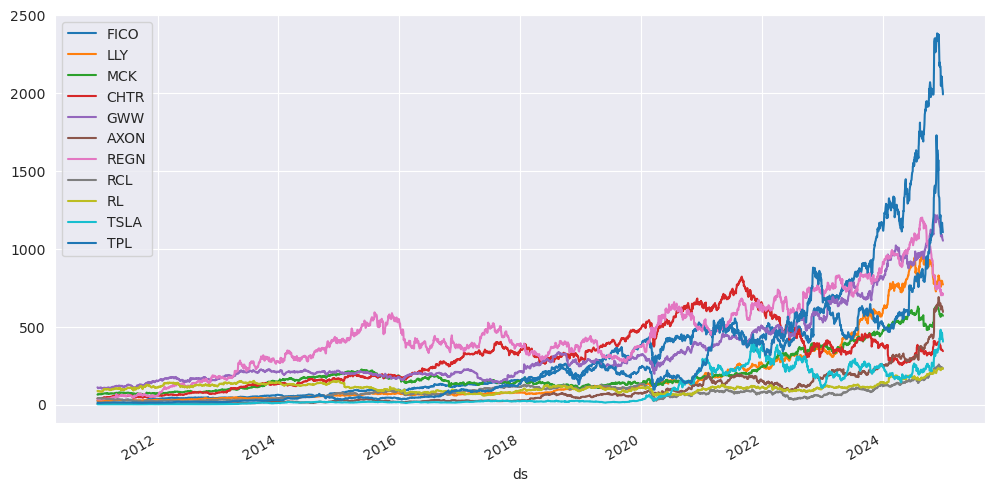

In [20]:
data_10 = source[select_10]
sns.set_style('darkgrid')
data_10.plot(figsize=(12,6))
plt.legend(loc='upper left')
plt.show()

In [21]:
df = data_10.copy()
days_to_avg = parameters['days_to_avg']
display(df.head())
print(f'initial date: {df.iloc[days_to_avg+1, :].index}')

Ticker,FICO,LLY,MCK,CHTR,GWW,AXON,REGN,RCL,RL,TSLA,TPL
ds,,,,,,,,,,,
2011-01-03,23.337875,24.383286,63.808739,38.459999,110.267799,5.00,33.776596,39.921806,87.635155,1.774667,10.710283
2011-01-04,22.812870,24.404190,64.355370,39.599998,110.022827,4.77,33.217312,40.473835,85.022339,1.778000,10.739388
2011-01-05,22.822775,24.230032,64.812325,39.570000,109.588188,4.88,33.247276,40.908760,84.975266,1.788667,10.704462
2011-01-06,22.902021,24.341486,67.079399,39.220001,105.621284,4.77,34.265968,40.030552,84.692795,1.858667,10.751030
2011-01-07,22.307678,24.313623,66.308769,39.180000,104.783623,4.79,34.056232,40.139271,83.766922,1.882667,10.748118


initial date: Index(['FICO', 'LLY', 'MCK', 'CHTR', 'GWW', 'AXON', 'REGN', 'RCL', 'RL',
       'TSLA', 'TPL'],
      dtype='object', name='Ticker')


In [22]:
df.iloc[days_to_avg+1:, :].index[0]

Timestamp('2011-02-16 00:00:00')

#### GA 

In [23]:
opt_fun_ga = partial(genetic_algorithm, 
                  fitness_function=fitness_function, 
                  population_size=parameters["population_size"], 
                  num_generations=parameters["num_generations"], 
                  mutation_rate=parameters["mutation_rate"], 
                  elitism=parameters["elitism"])

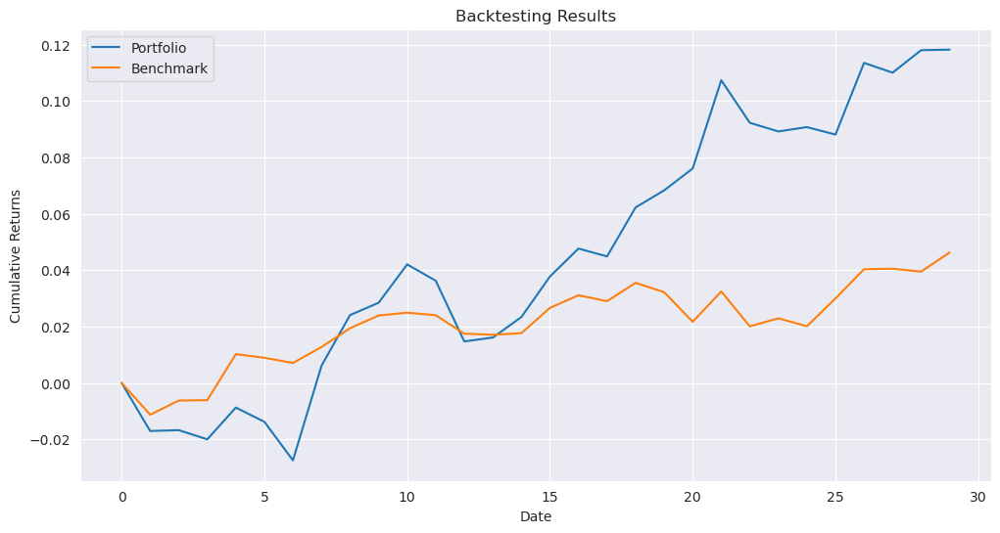

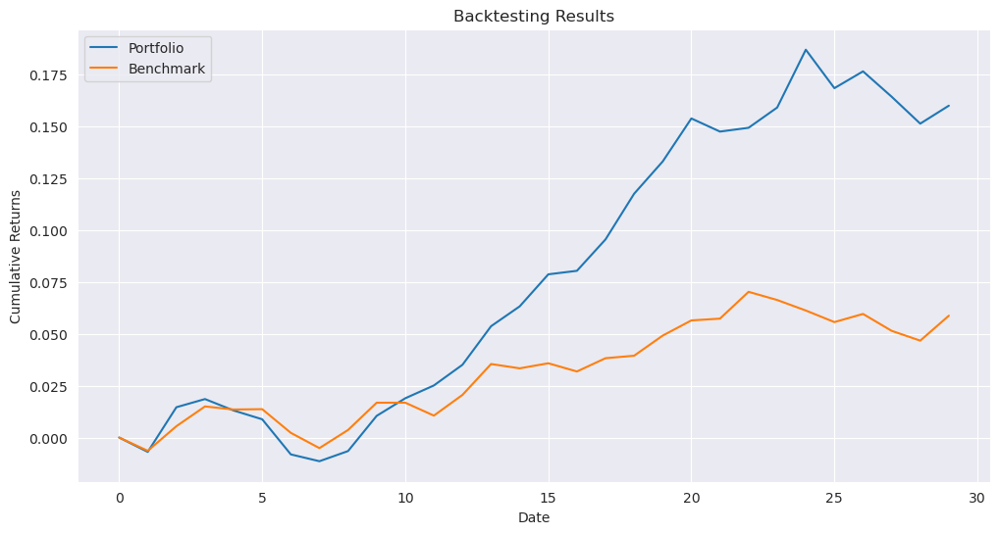

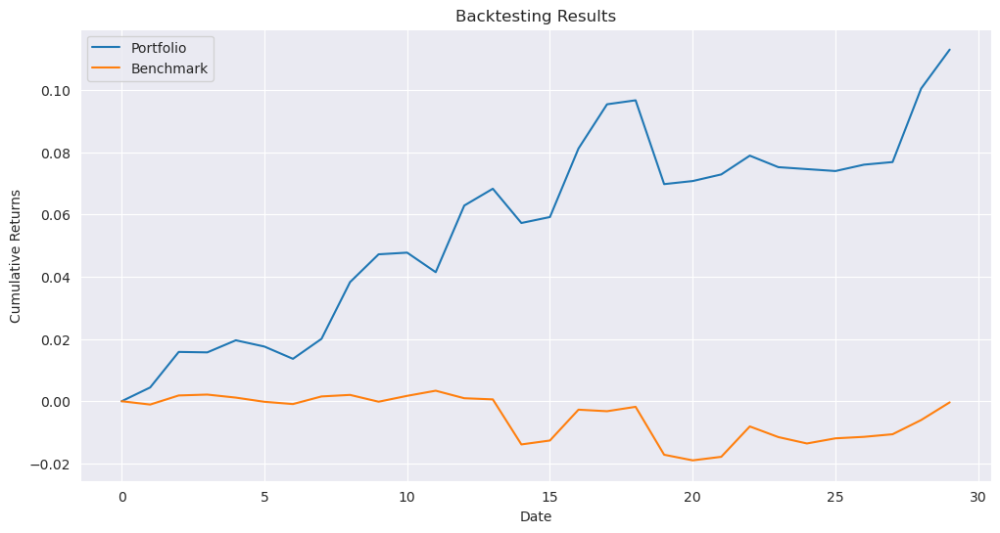

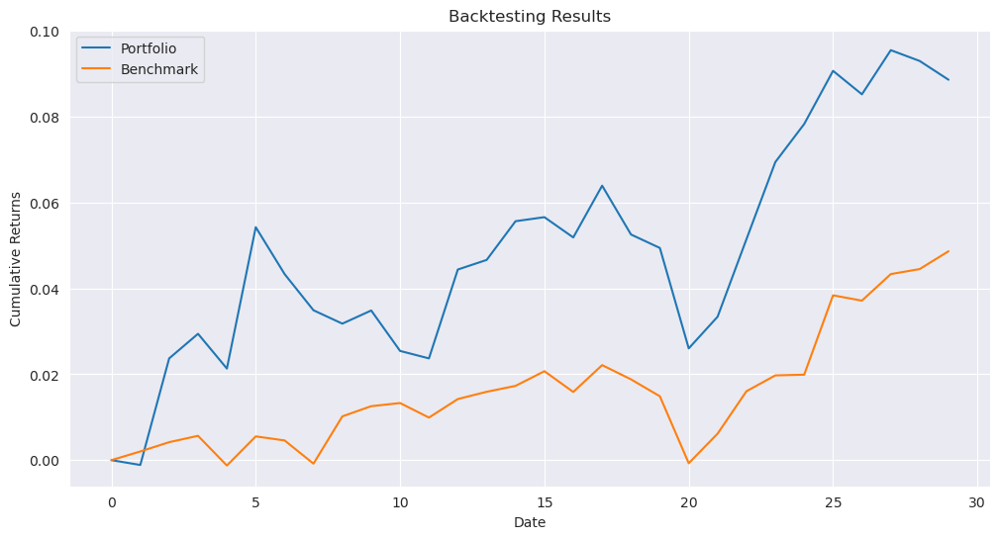

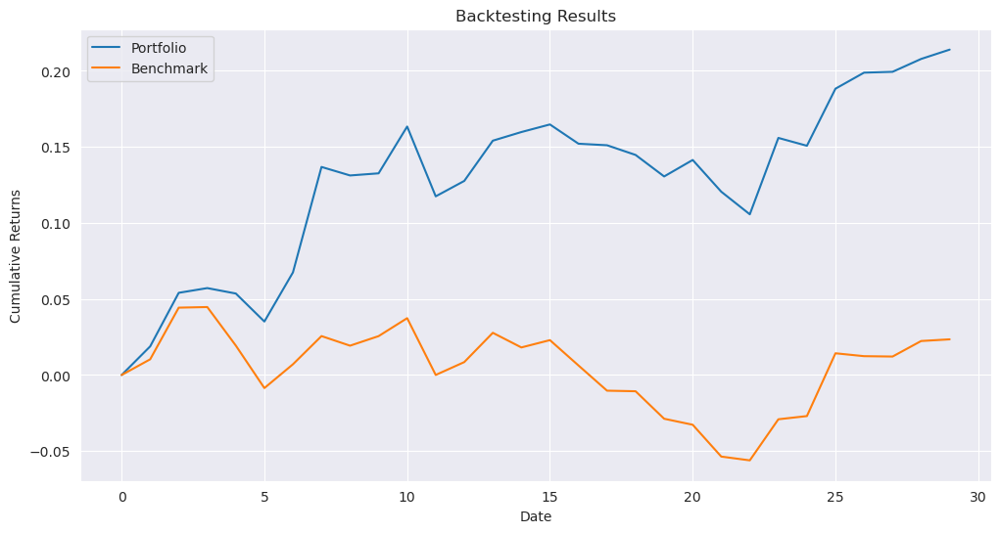

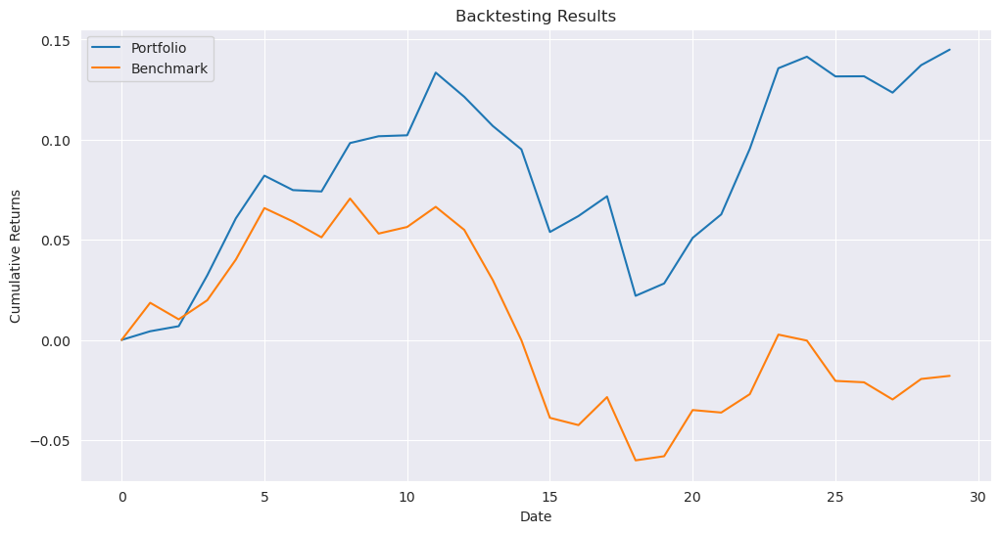

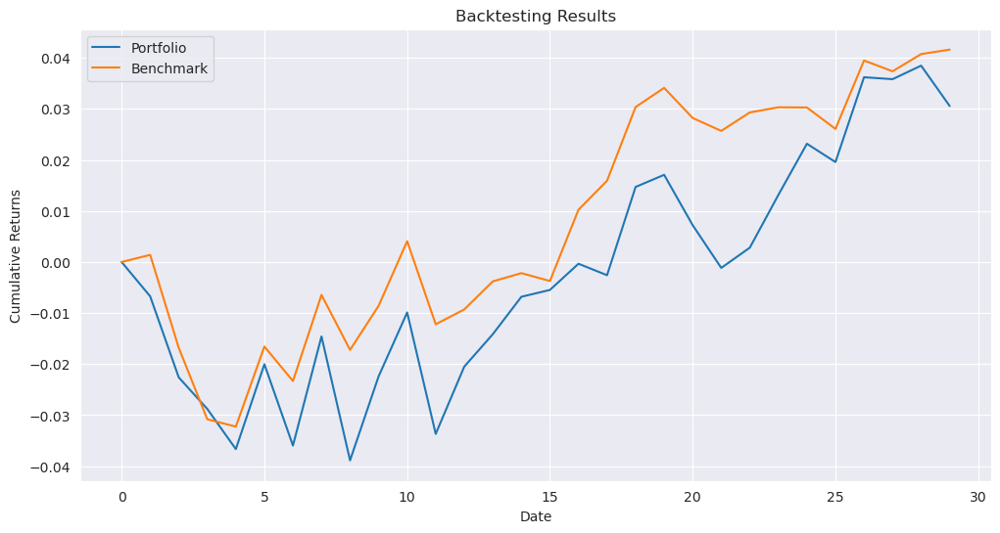

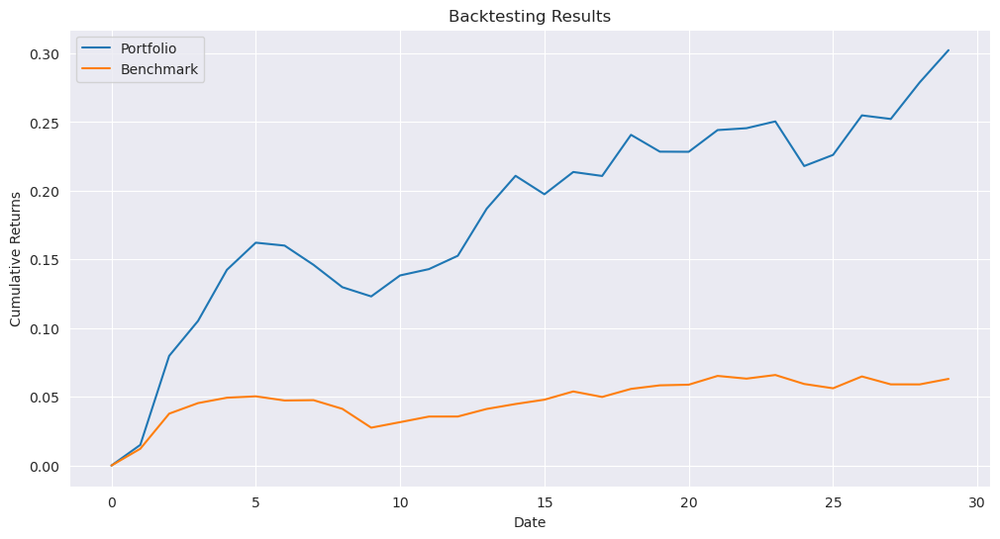

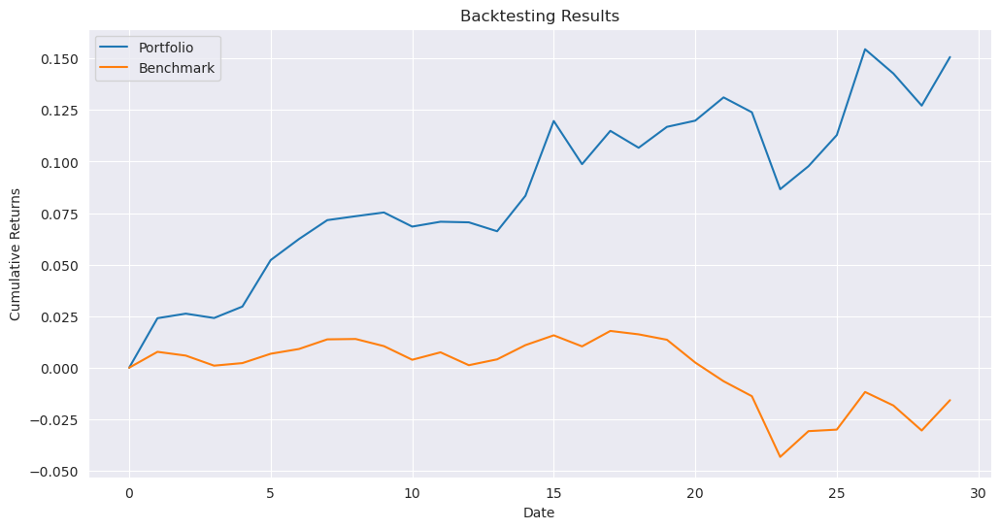

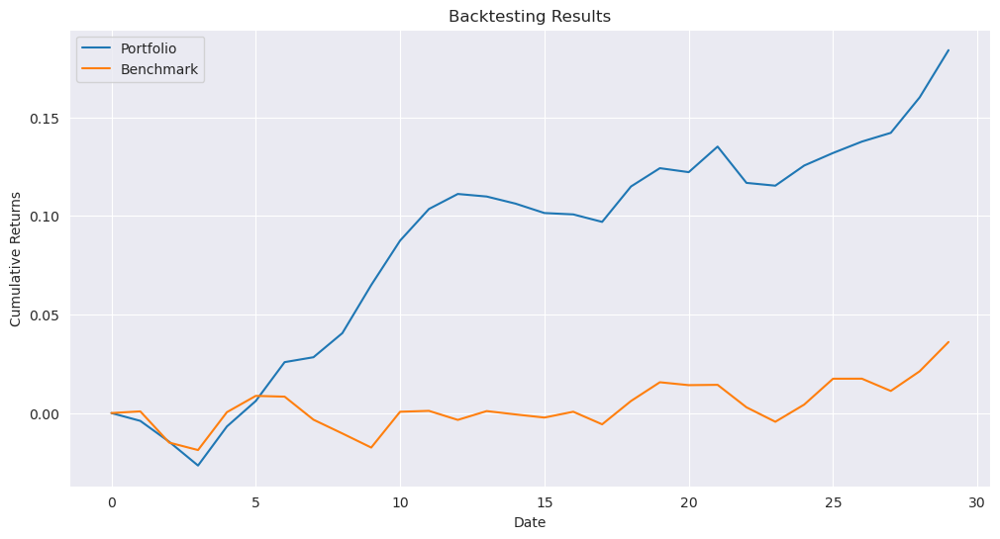

In [24]:
results_path_ga_10 = '../results/results_10_{}_ga.pkl'
_ = run_experiment(results_path_ga_10, data_10, benchmark, opt_fun_ga, parameters)

#### Brute Force

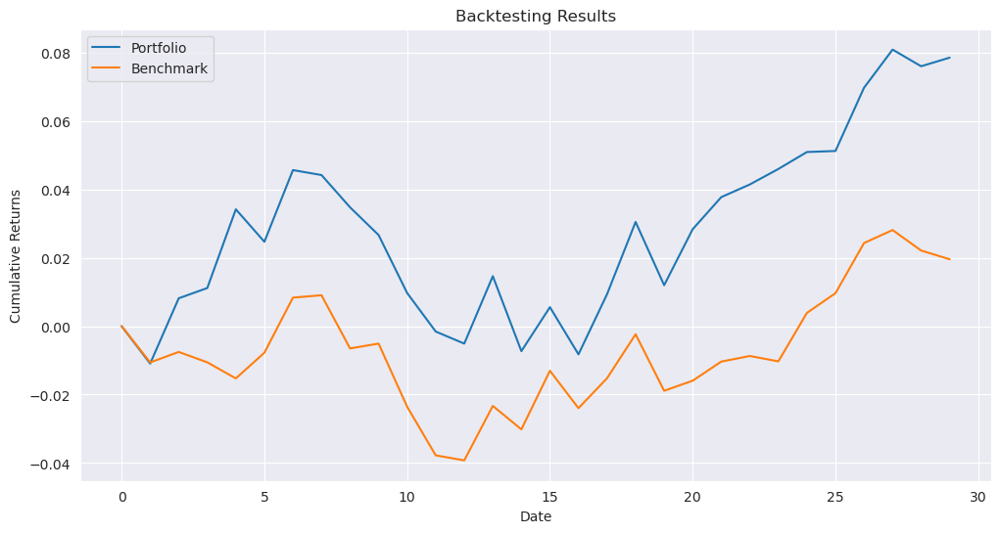

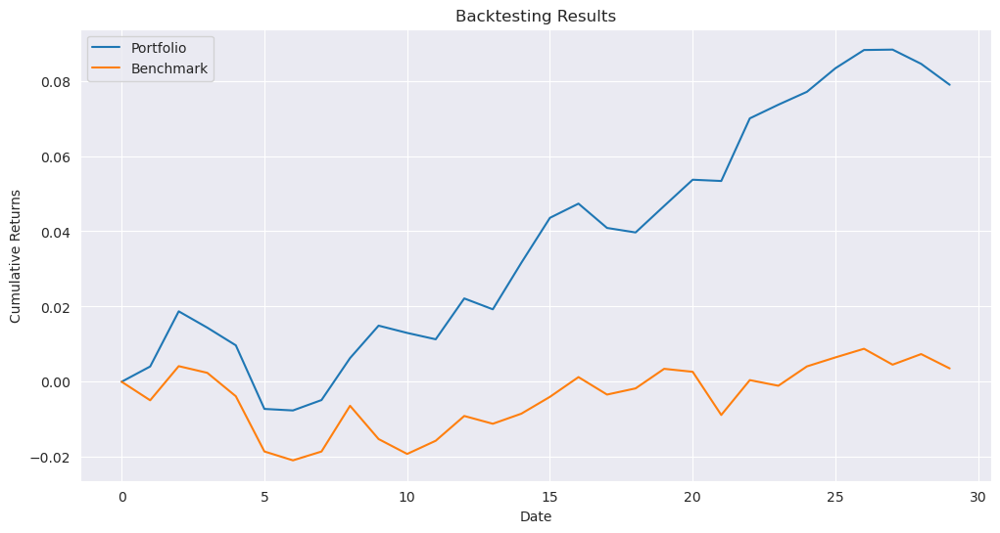

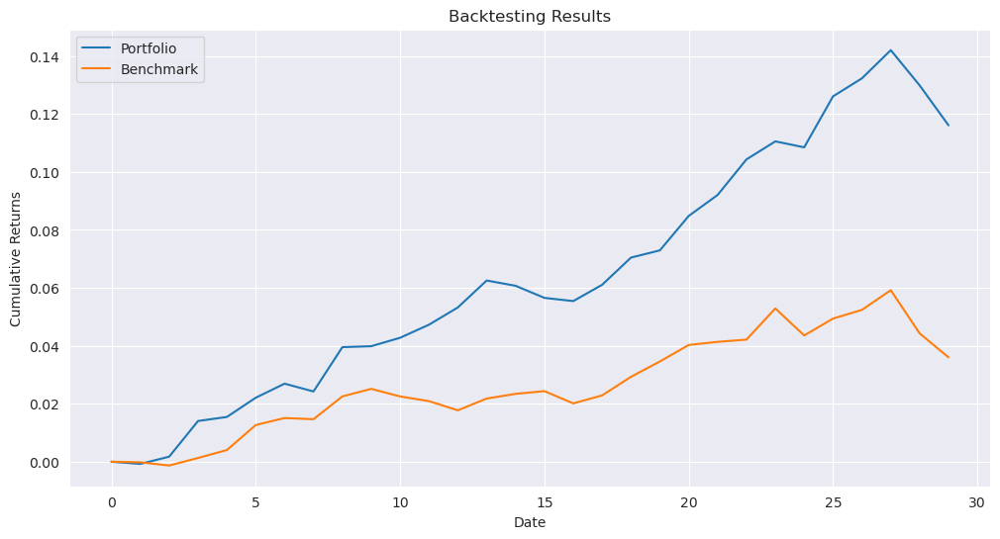

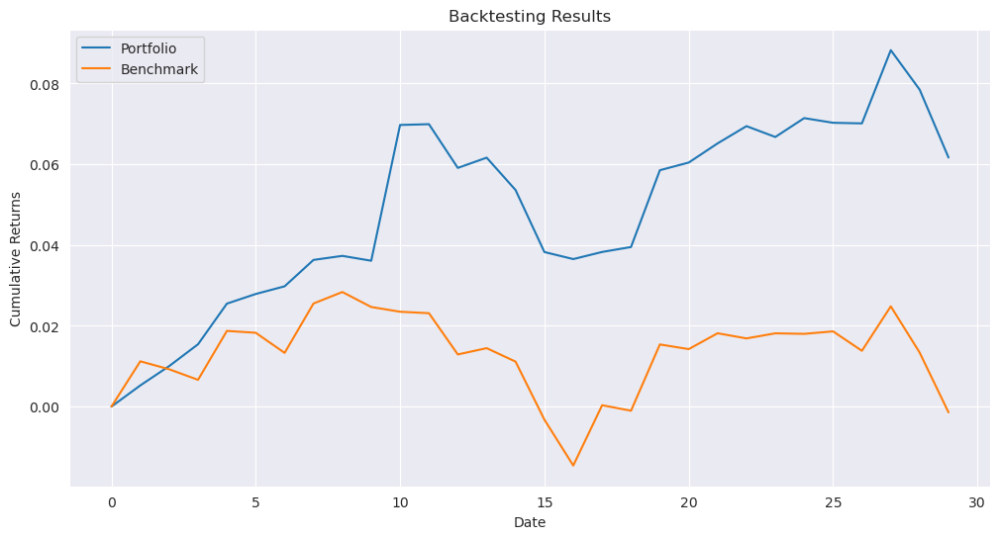

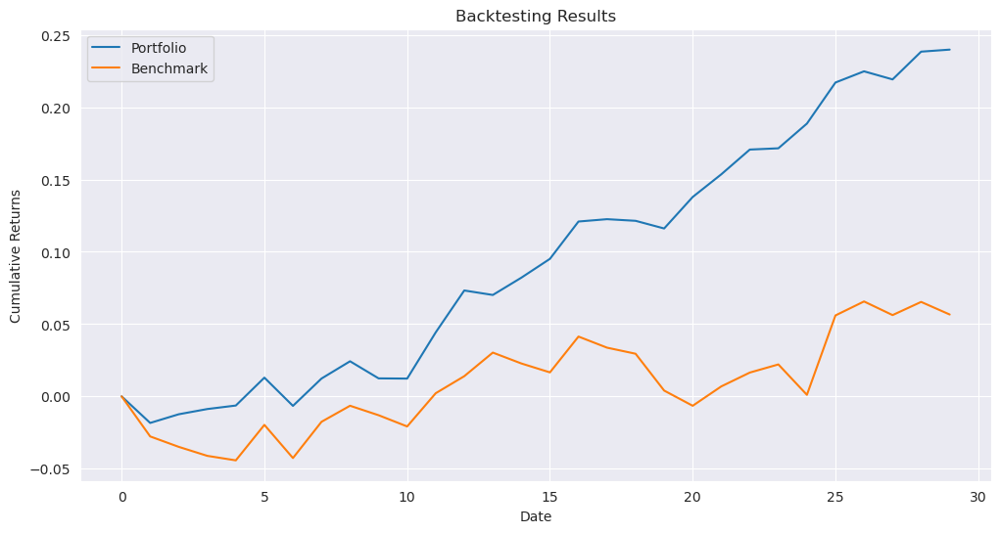

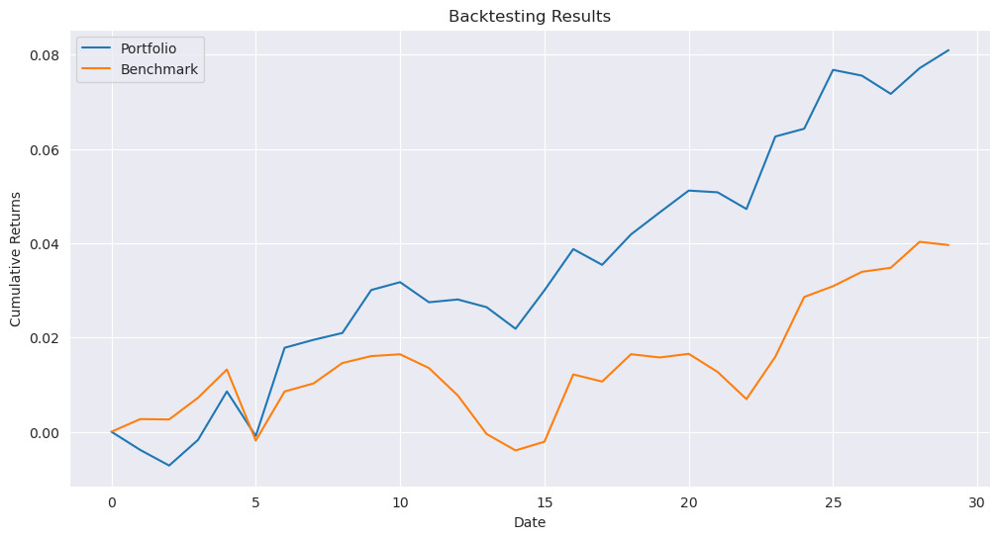

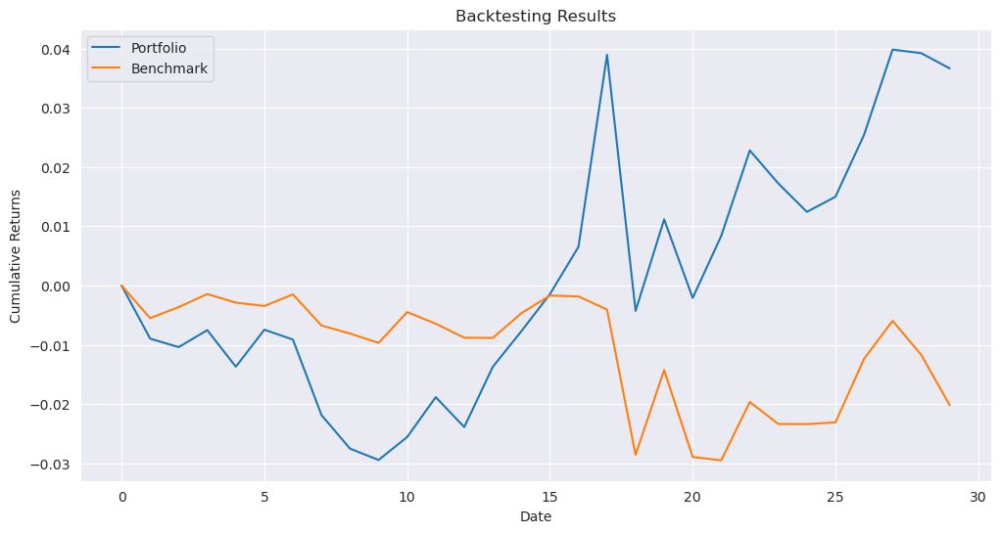

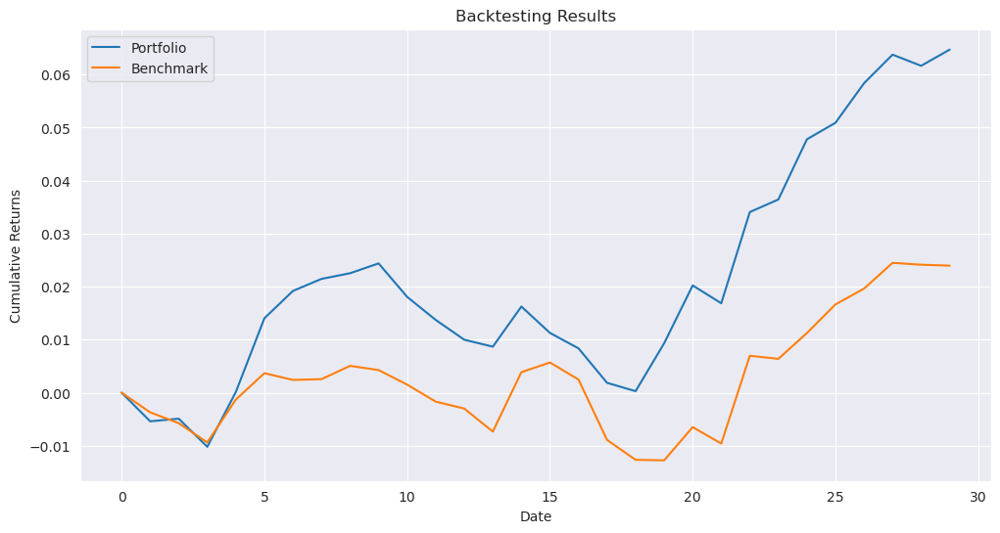

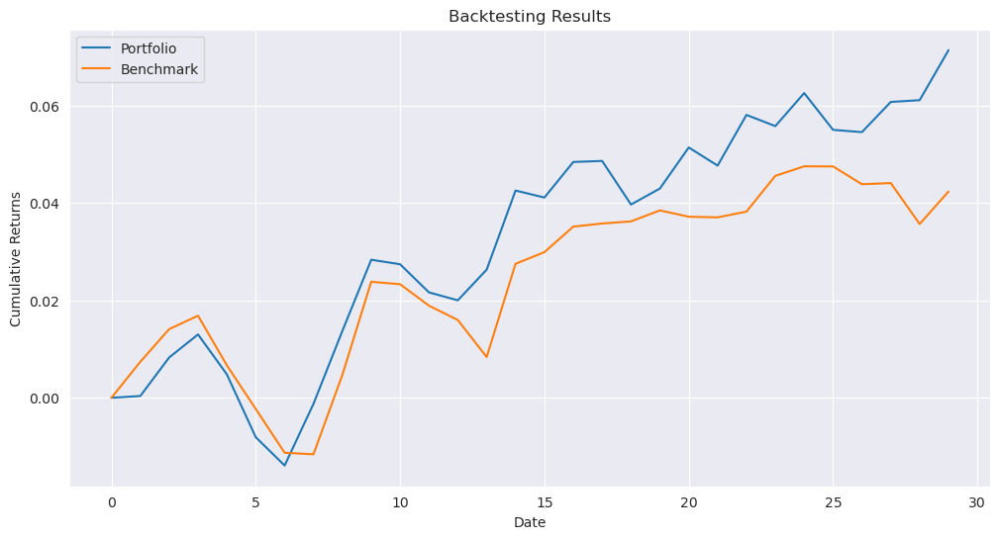

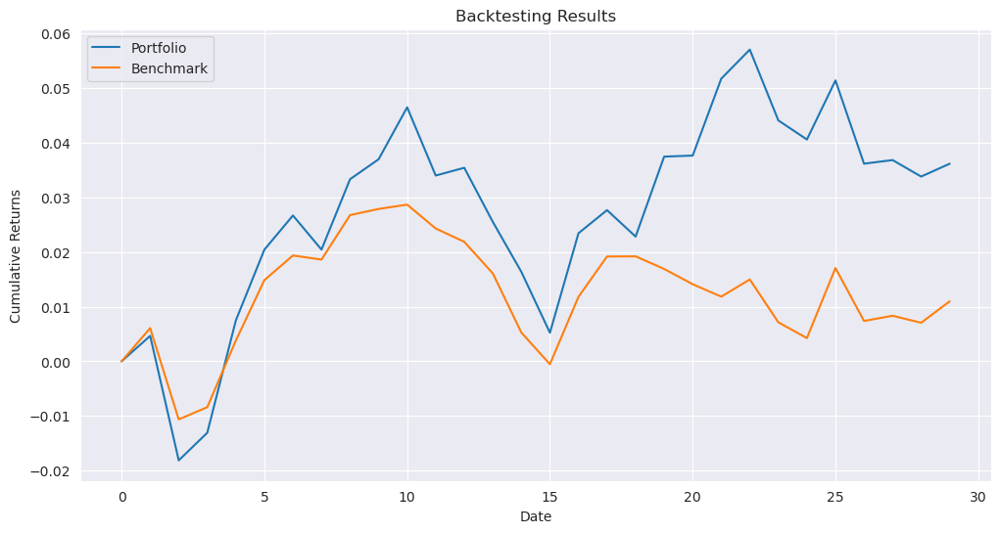

In [25]:
opt_fun_bf = partial(scipy_minimize, fitness_function=fitness_function)
results_path_bf_10 = '../results/results_10_{}_bf.pkl'
_ = run_experiment(results_path_bf_10, data_10, benchmark, opt_fun_bf, parameters)

#### HRP

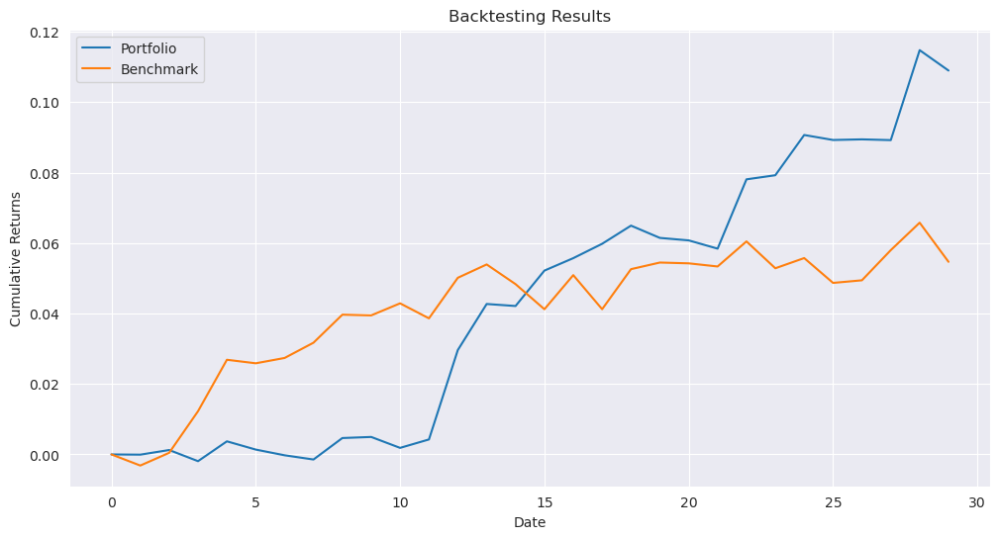

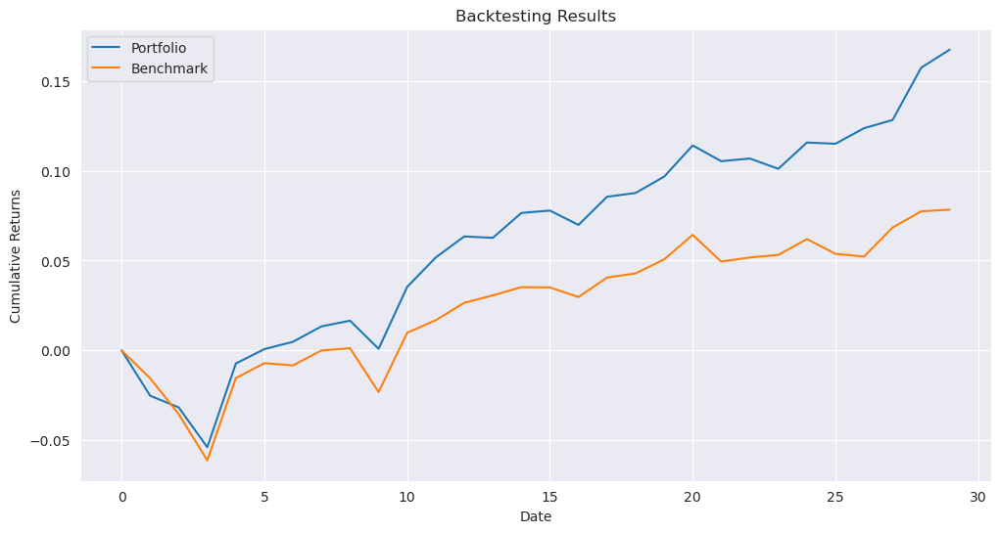

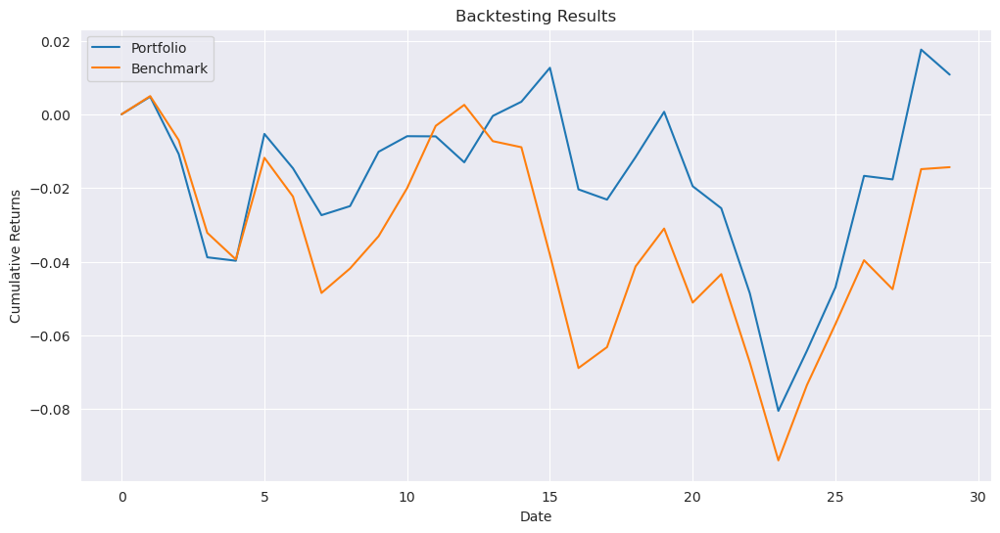

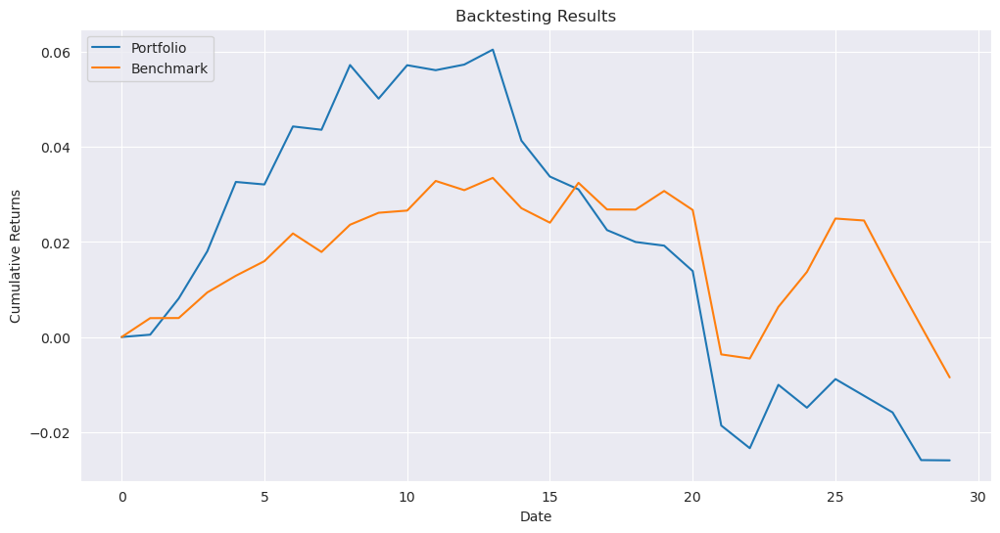

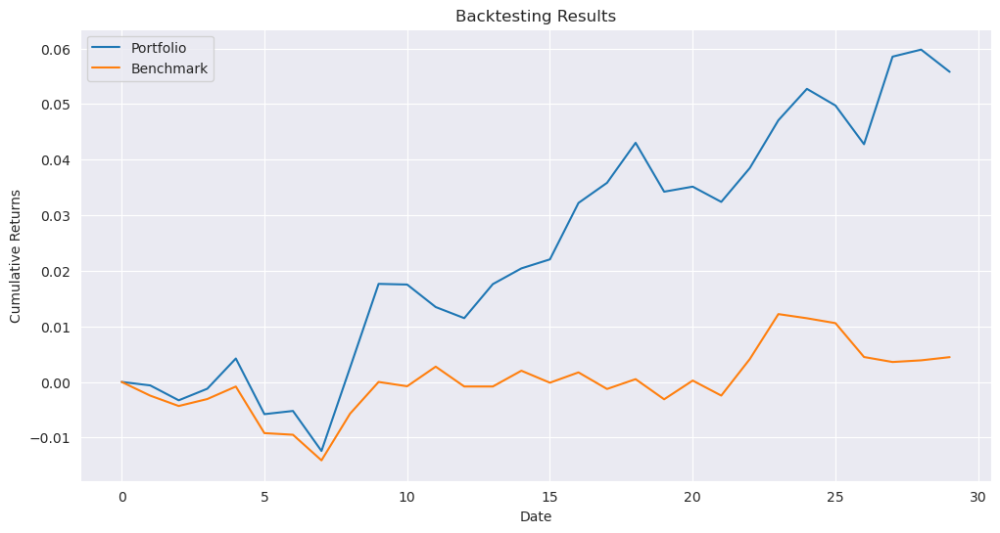

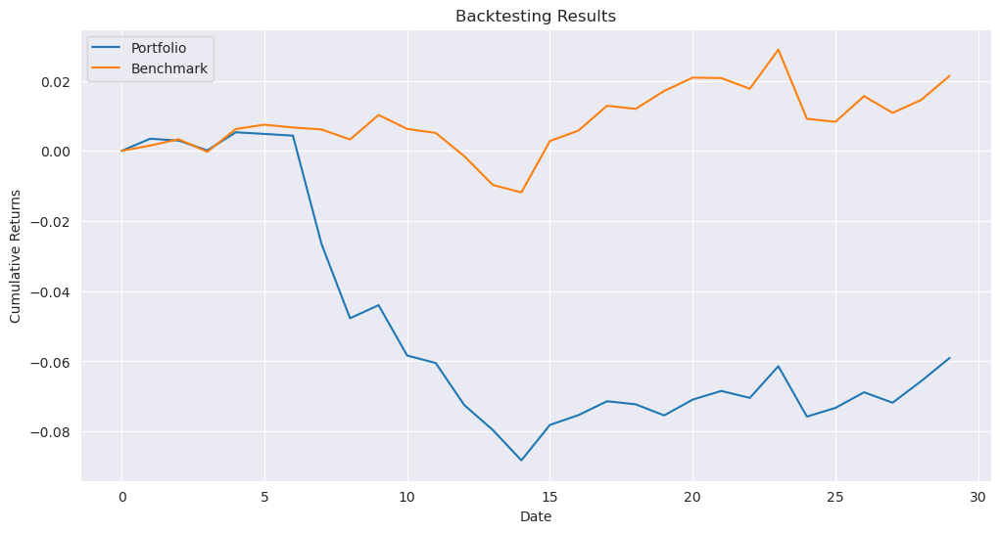

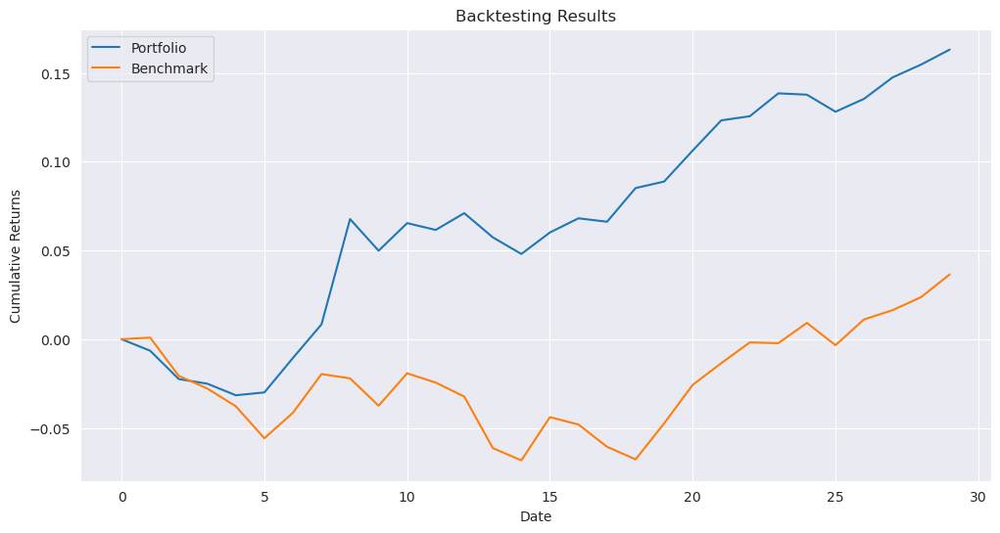

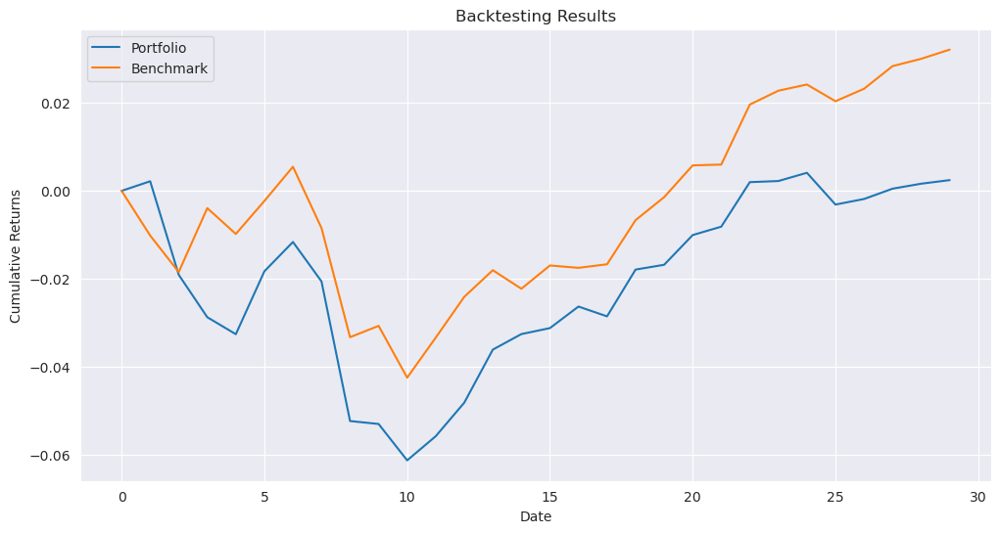

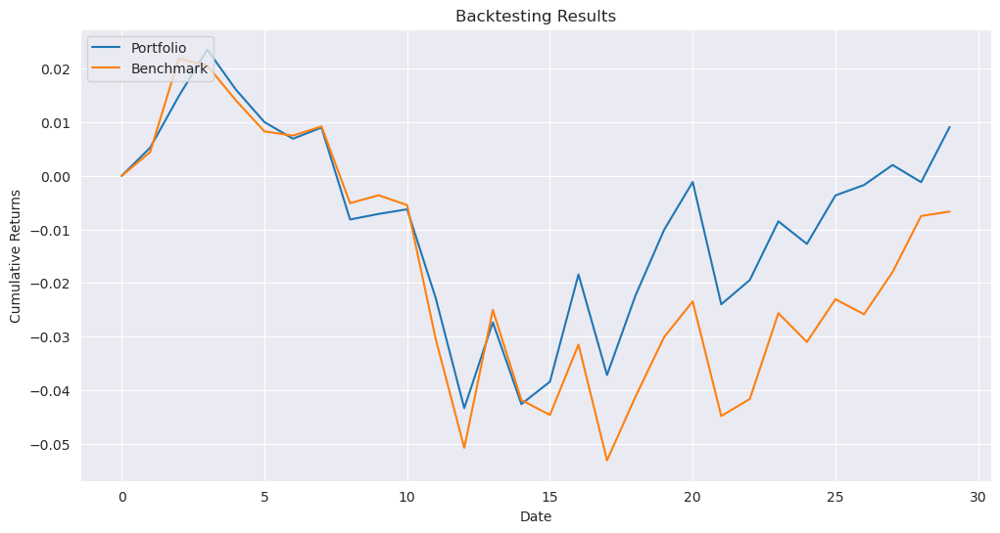

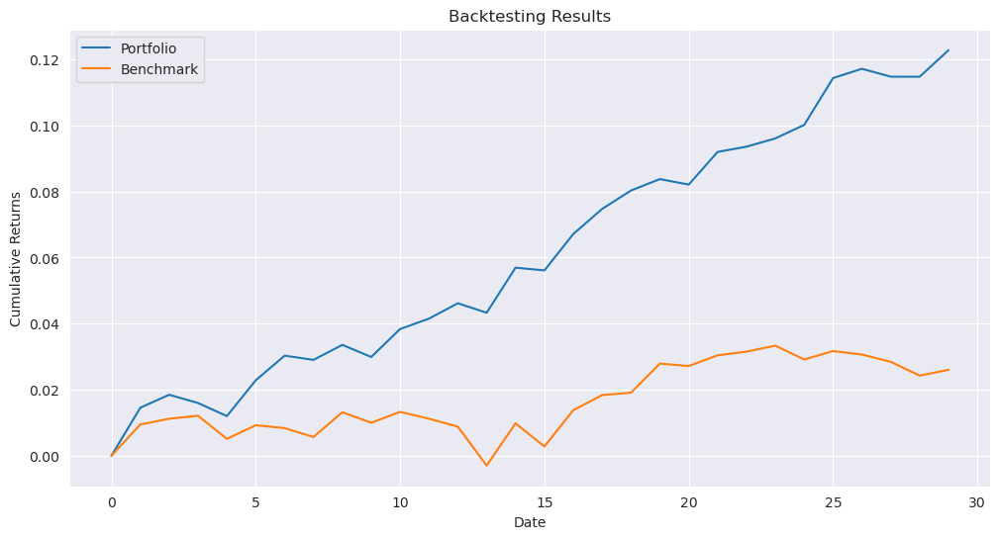

In [26]:
opt_fun_hrp = partial(riskfolio_minimize)
results_path = '../results/results_10_{}_hrp.pkl'
_ = run_experiment(results_path, data_10, benchmark, opt_fun_hrp, parameters)

#### Trio comparison for Easy Test

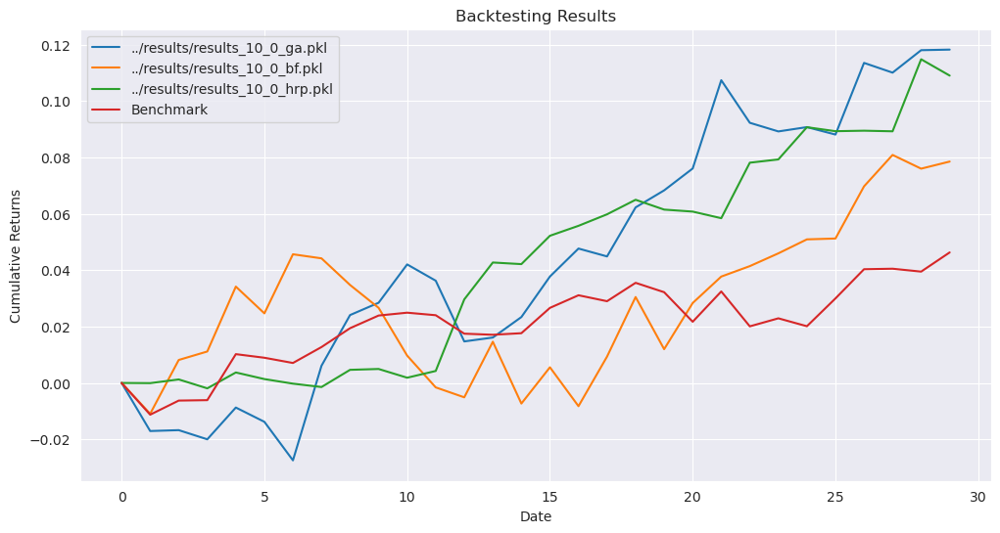

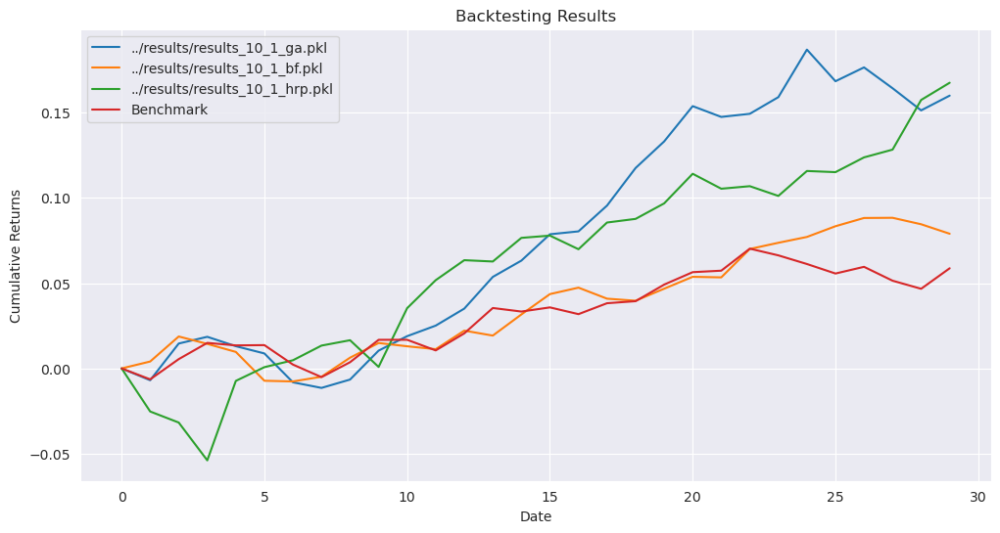

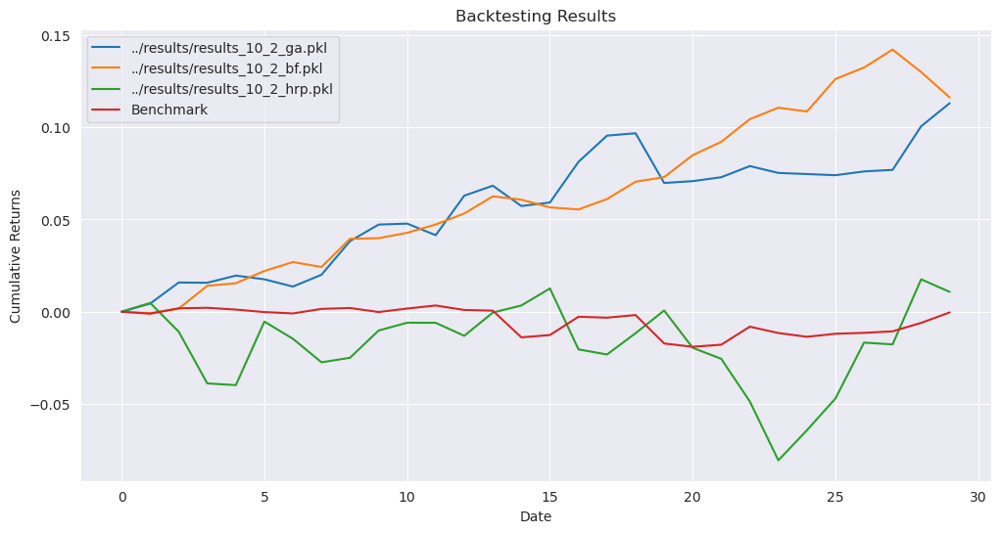

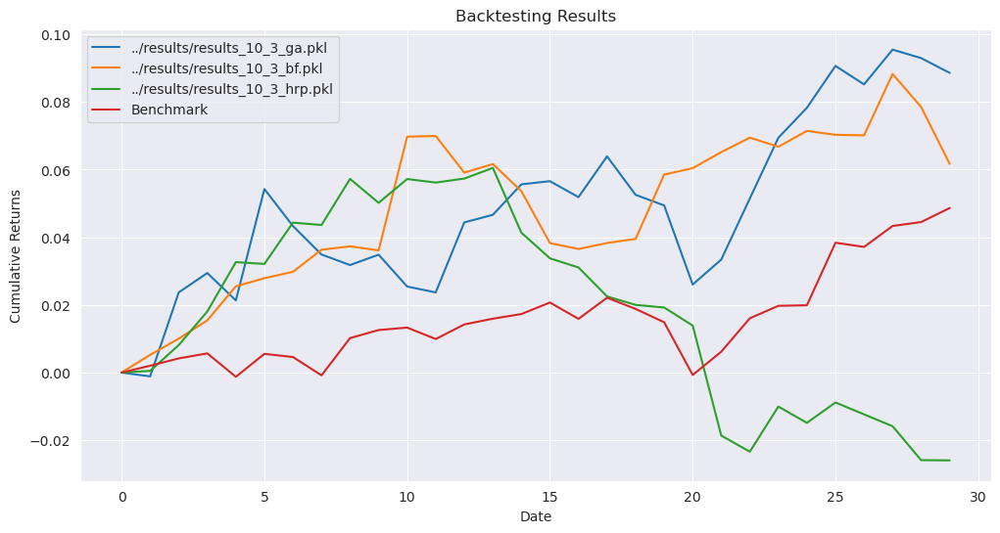

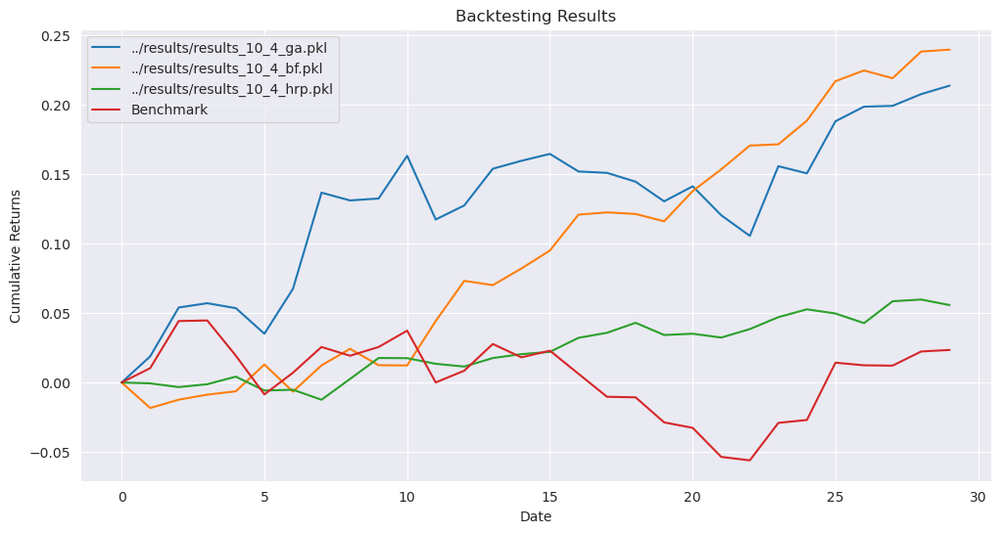

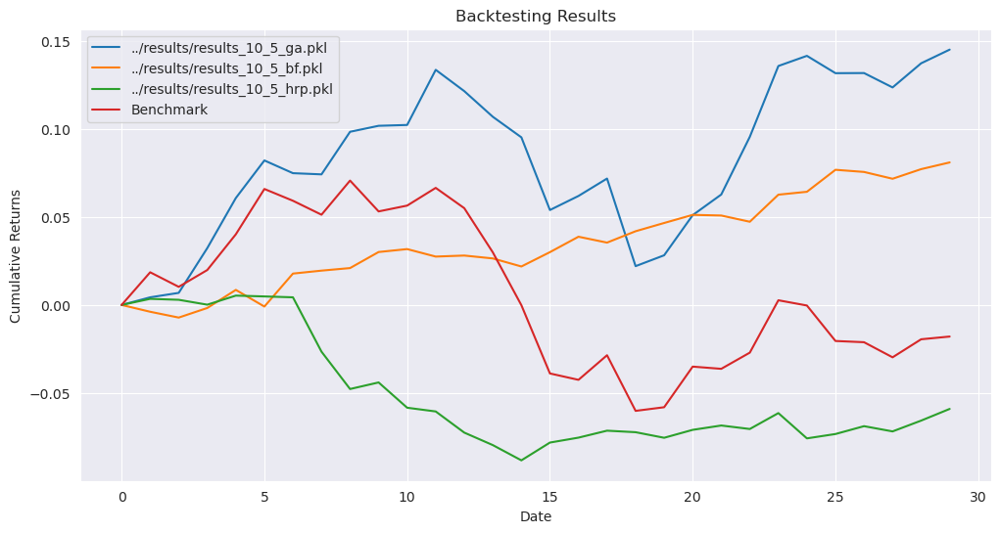

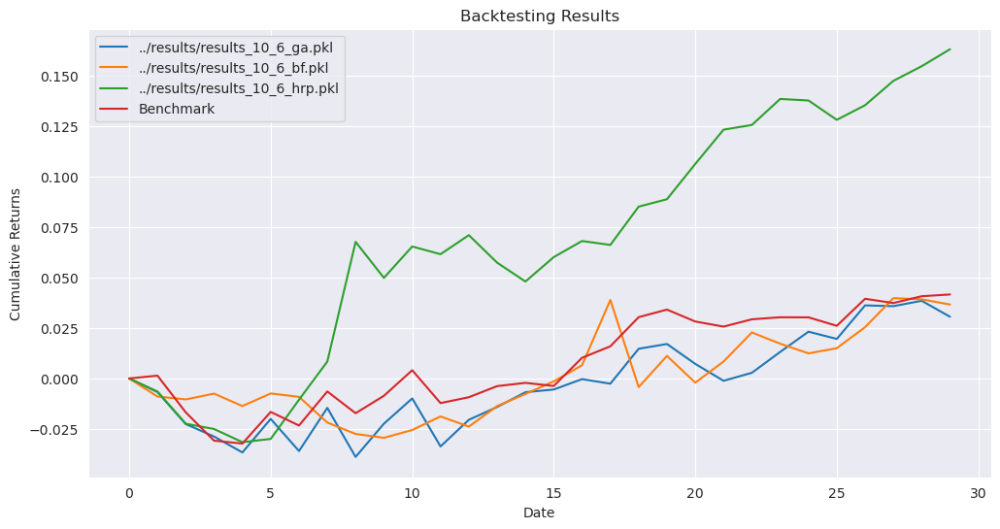

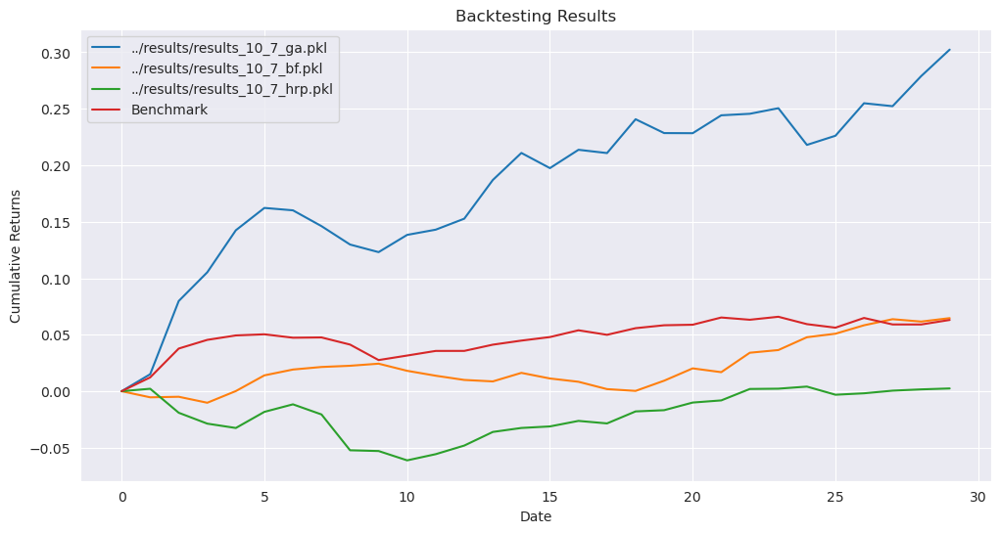

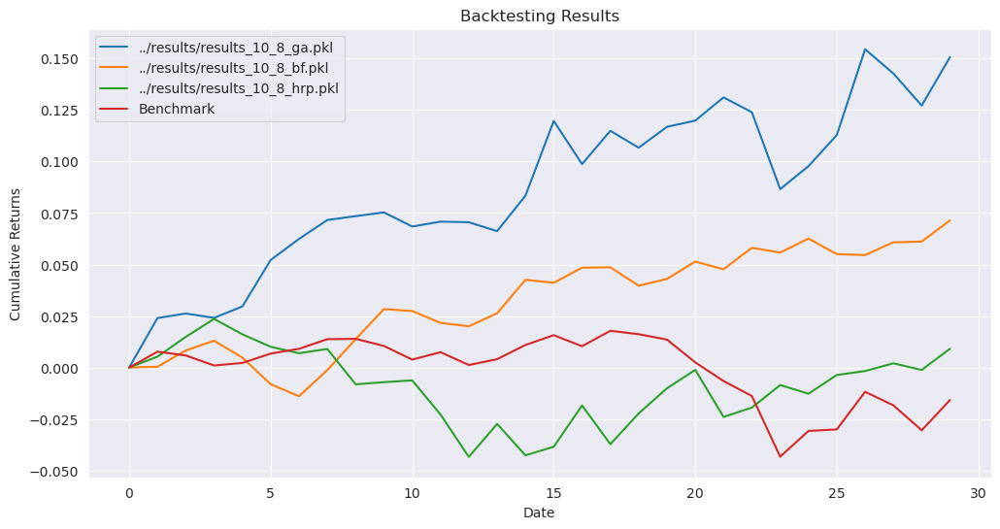

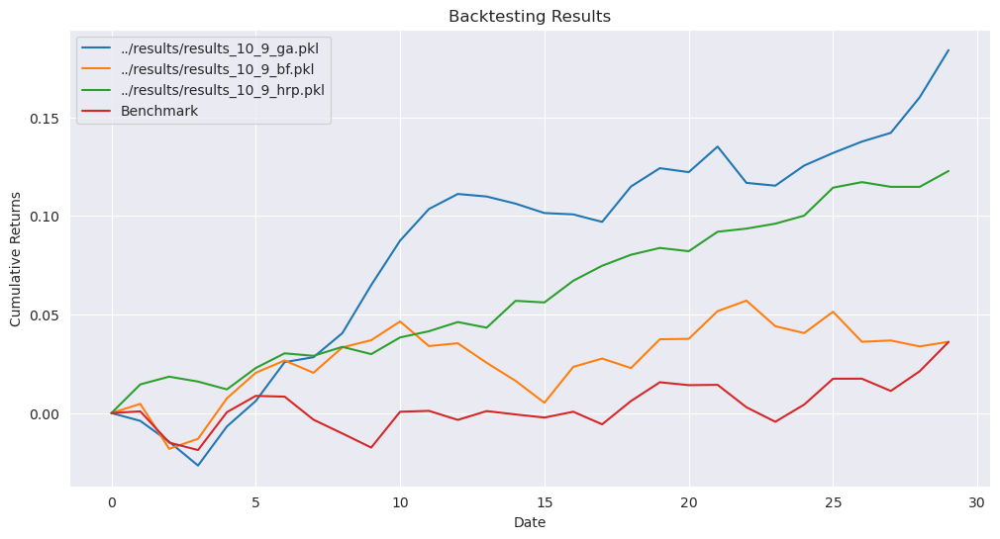

In [27]:
list_paths = ['../results/results_10_{}_ga.pkl', '../results/results_10_{}_bf.pkl', '../results/results_10_{}_hrp.pkl']
n_periods = parameters['n_periods']
trio_comparison(list_paths[0], list_paths[1], list_paths[2], n_periods)

### Medium test: Optimization with 100 stocks

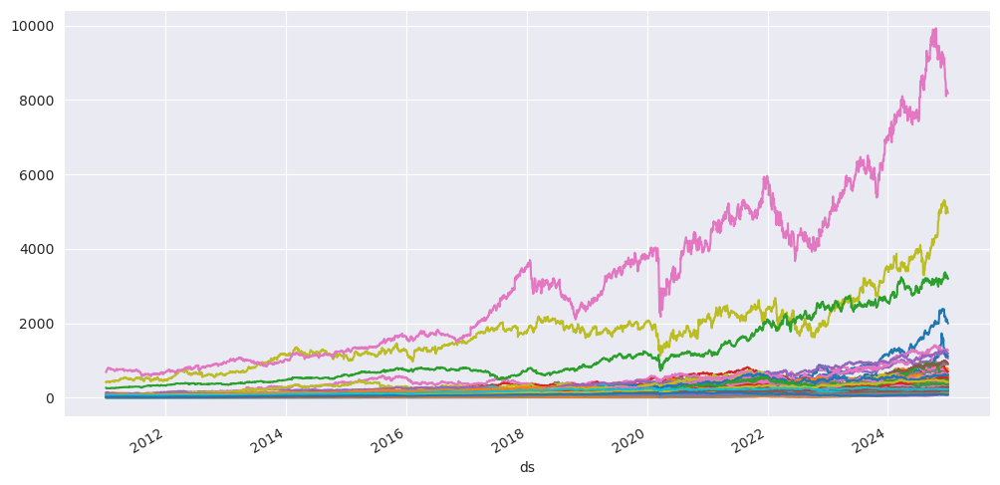

In [28]:
data_100 = source[select_100]
sns.set_style('darkgrid')
data_100.plot(figsize=(12,6))
plt.legend().remove()
plt.show()

#### GA

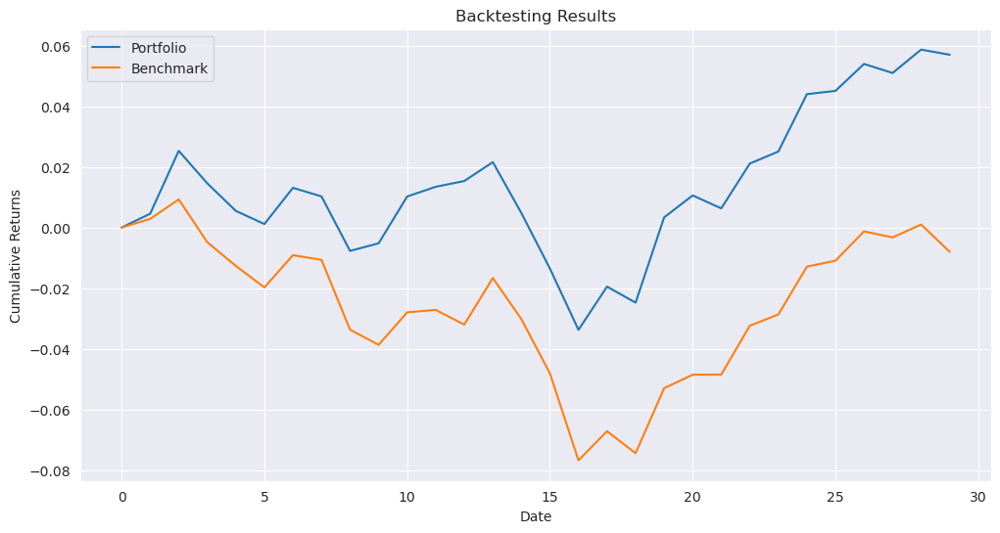

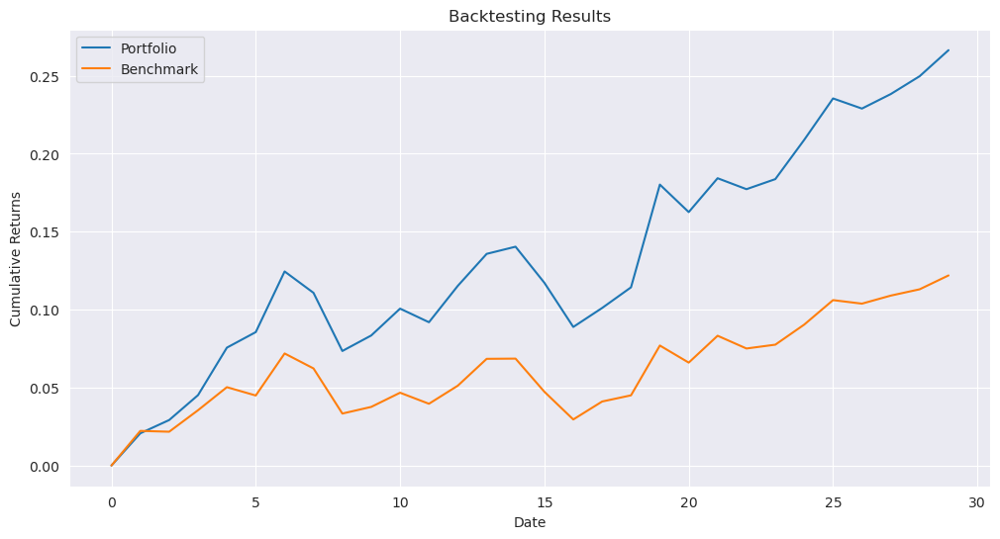

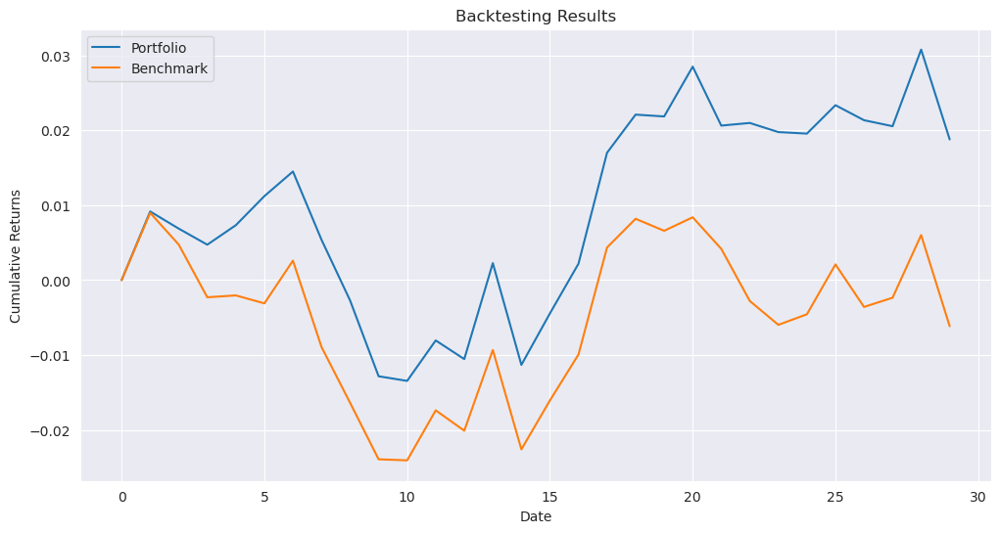

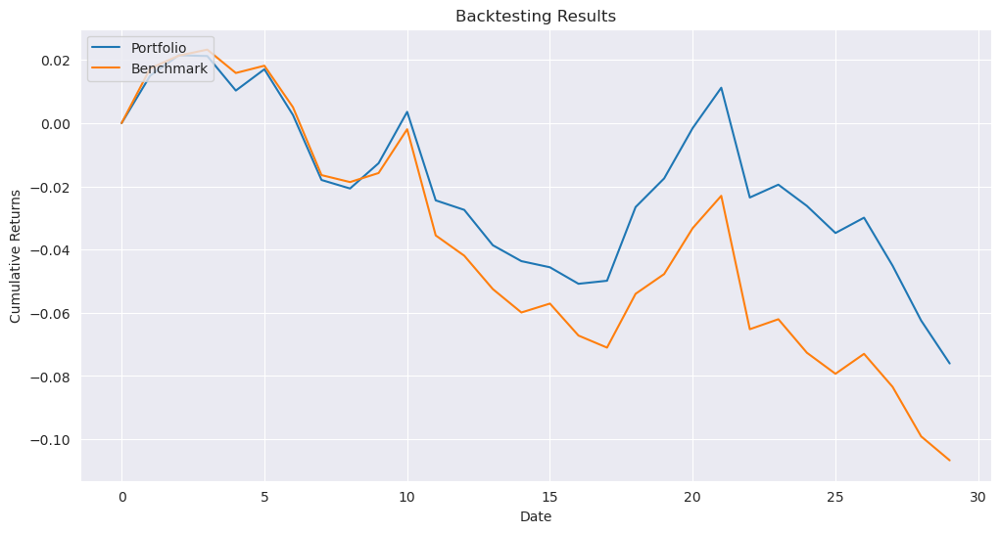

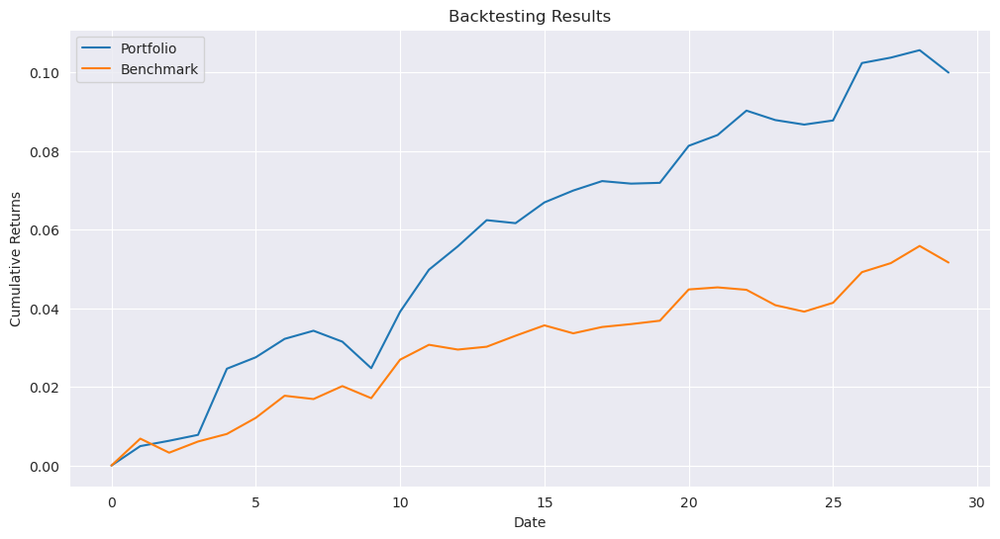

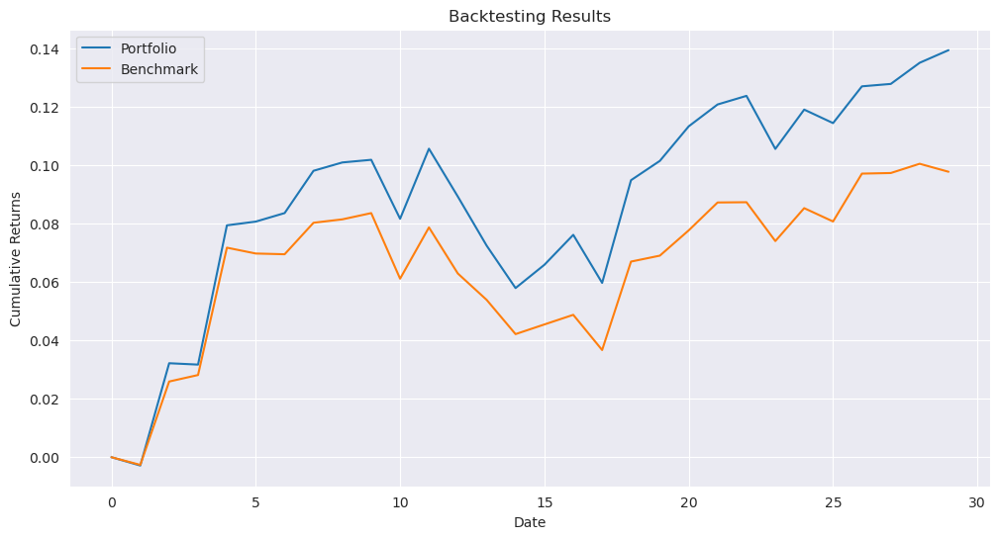

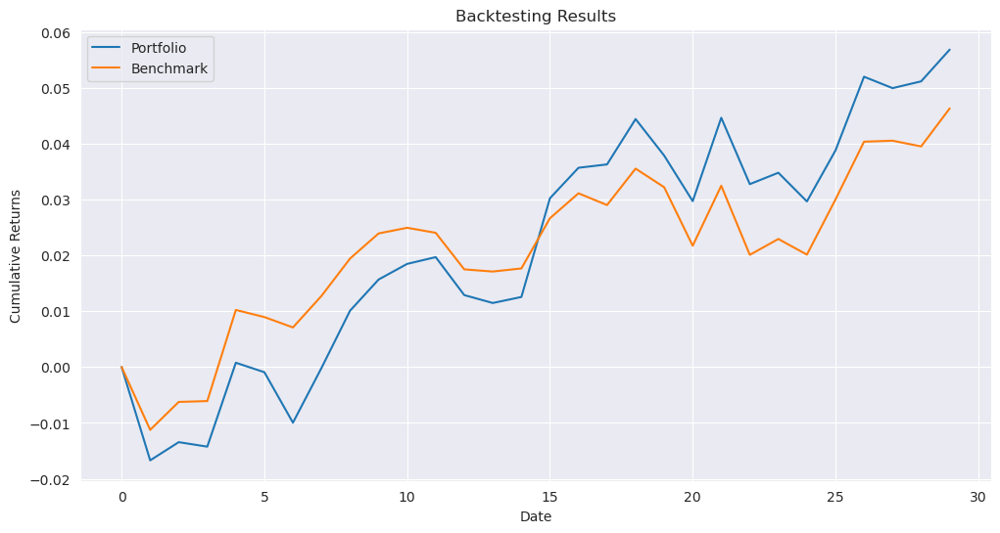

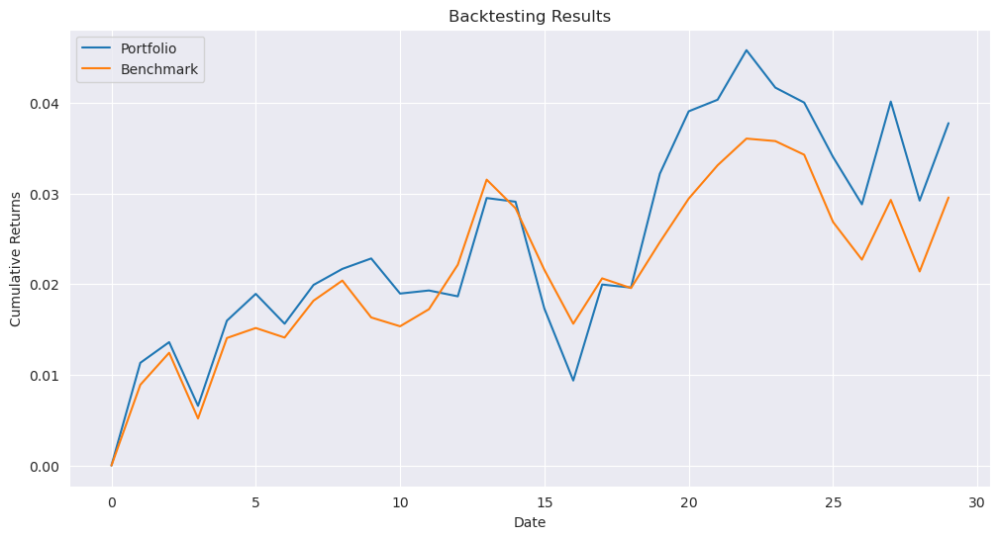

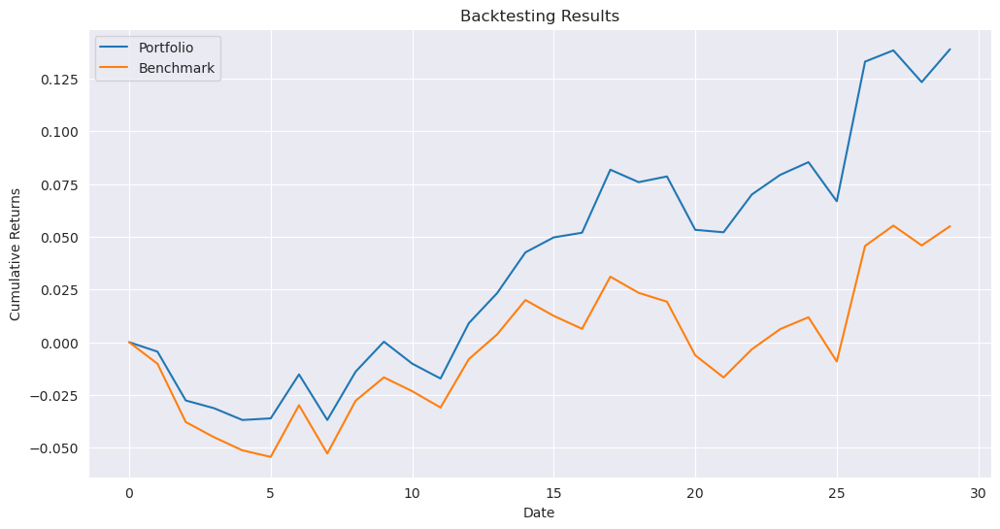

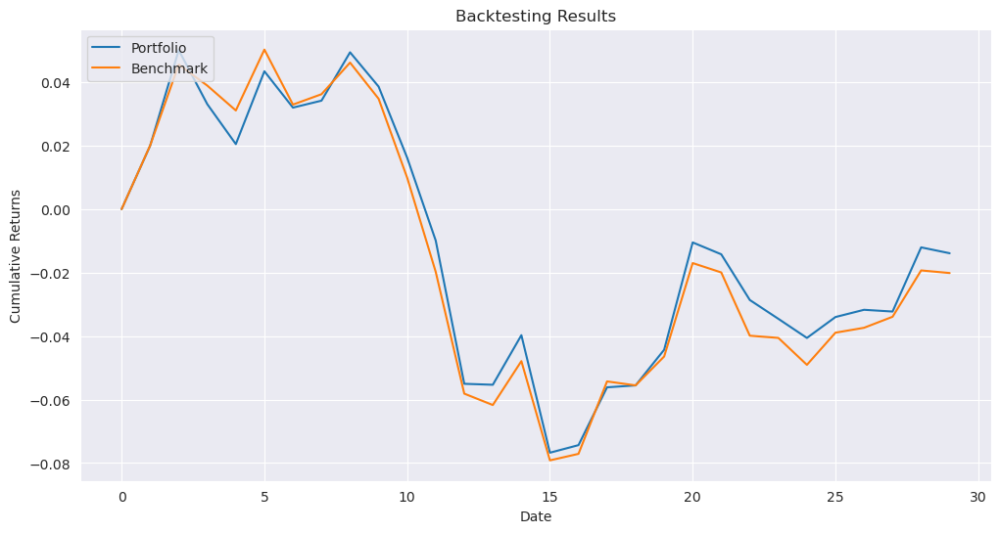

In [29]:
results_path_ga_100 = '../results/results_100_{}_ga.pkl'
_ = run_experiment(results_path_ga_100, data_100, benchmark, opt_fun_ga, parameters)

### BF

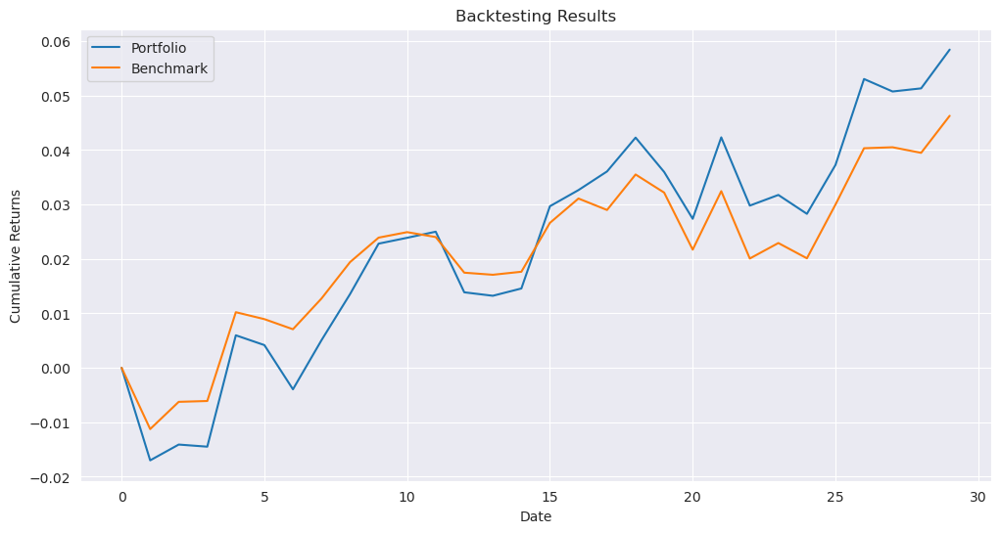

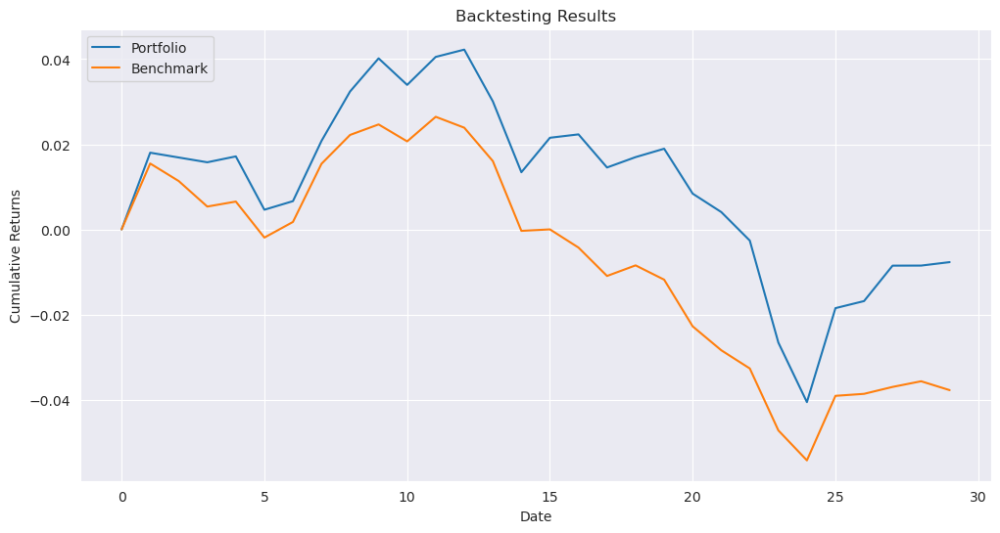

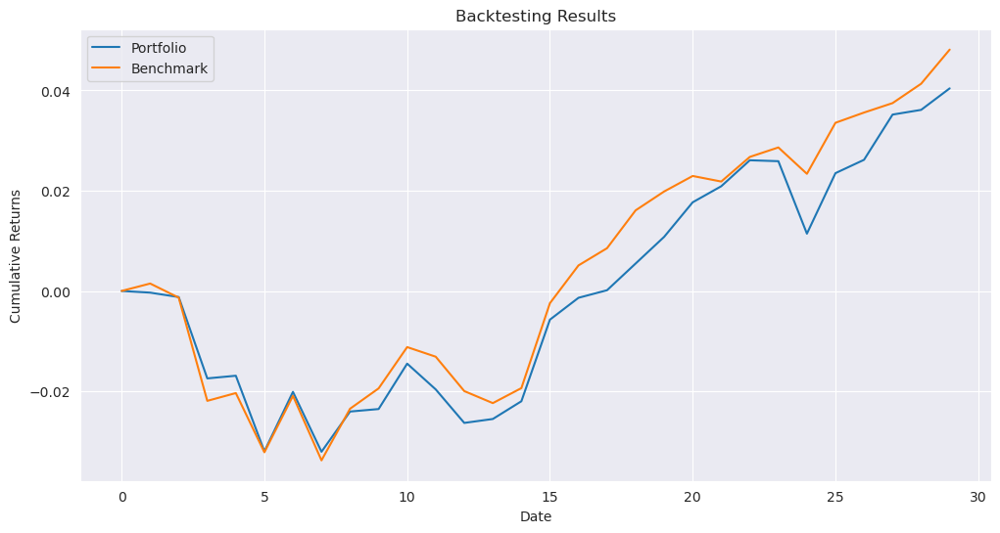

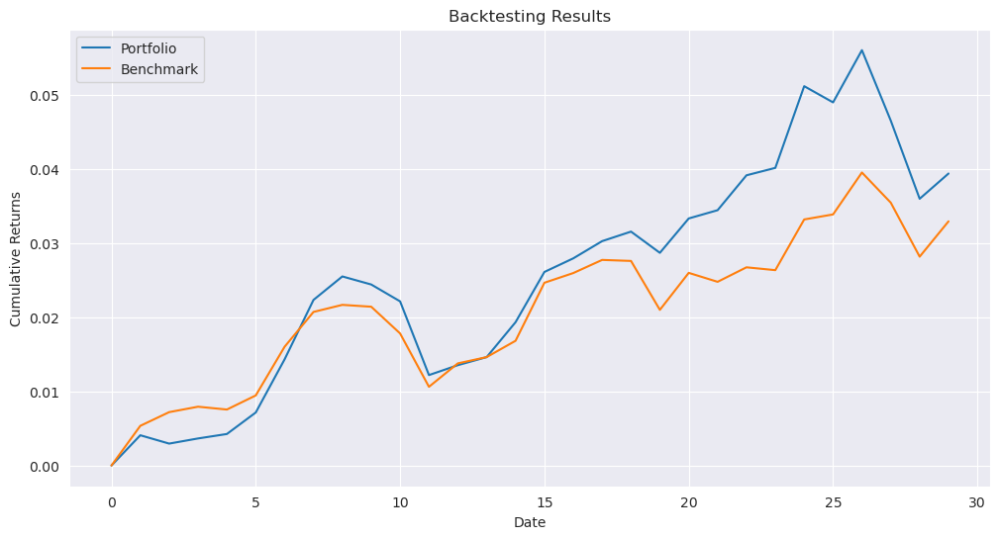

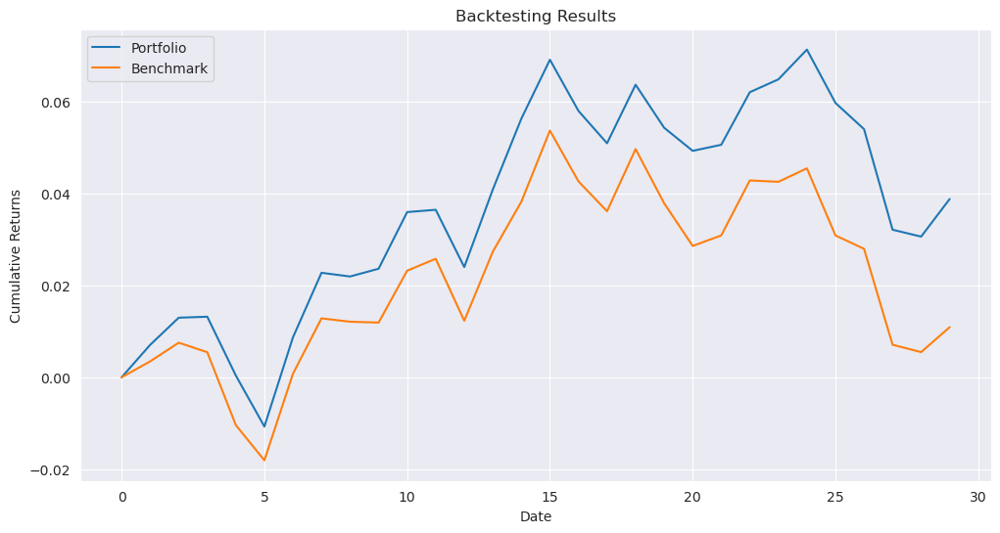

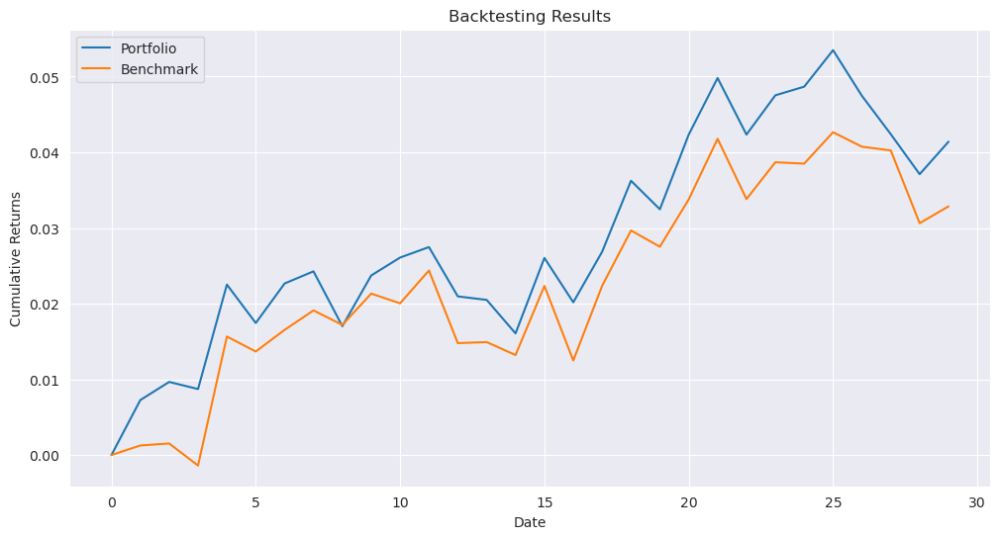

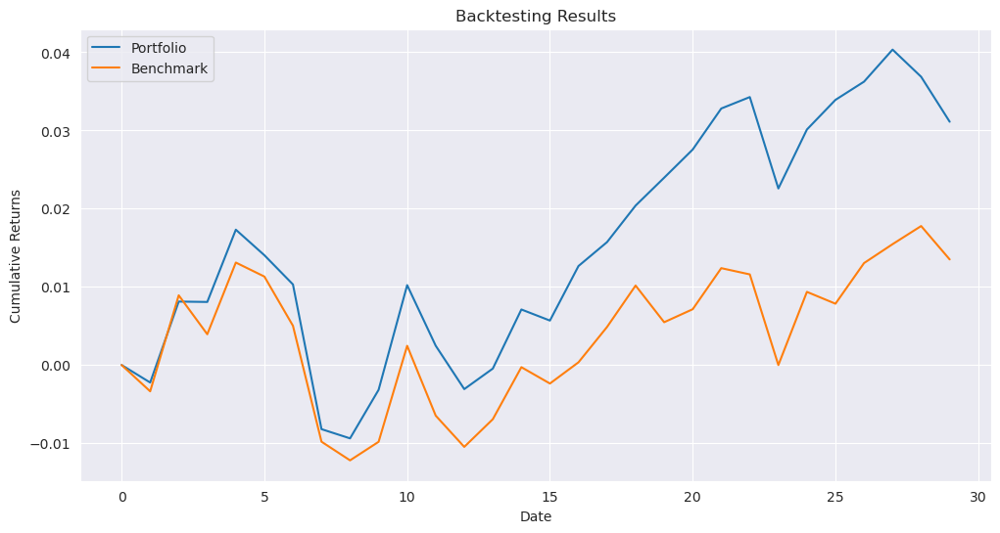

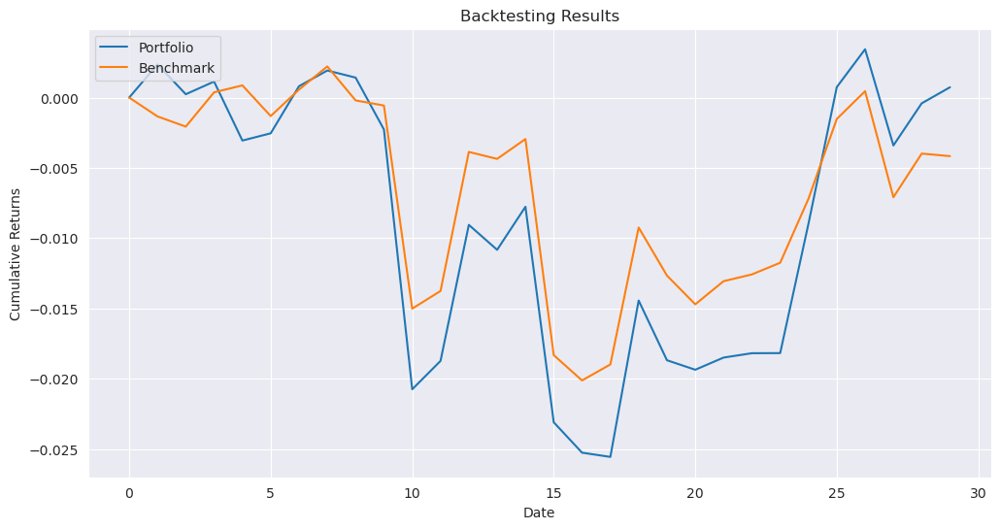

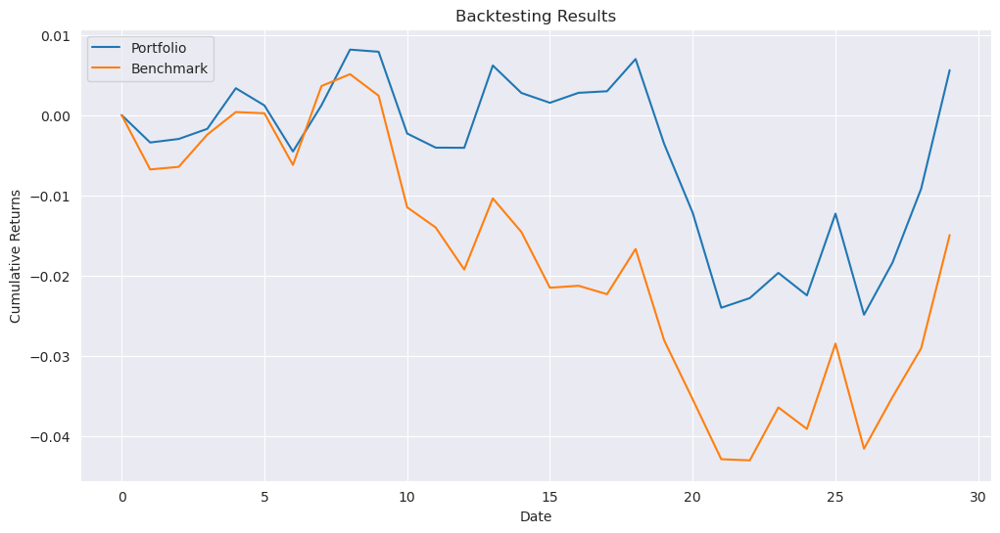

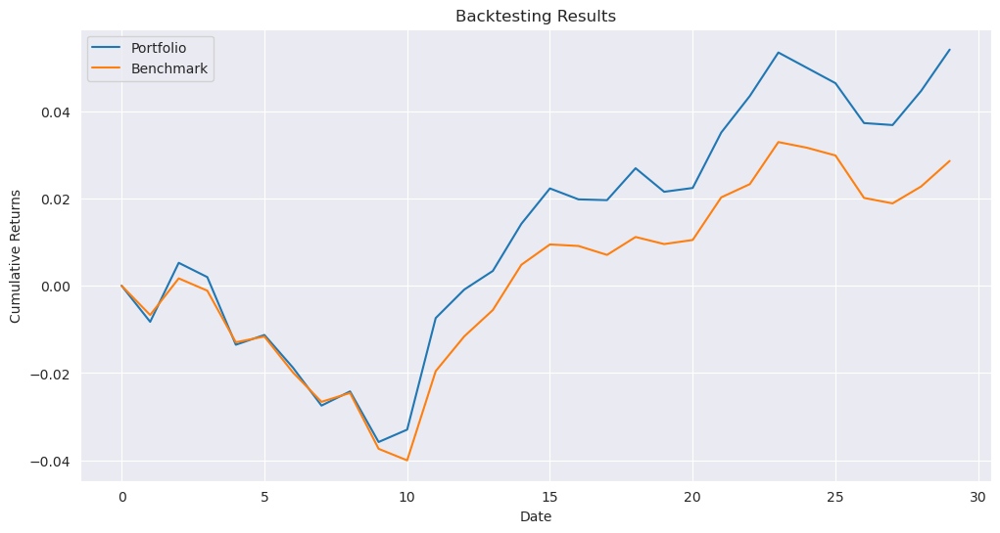

In [30]:
results_path_bf_100 = '../results/results_100_{}_bf.pkl'
_ = run_experiment(results_path_bf_100, data_100, benchmark, opt_fun_bf, parameters)

#### HRP

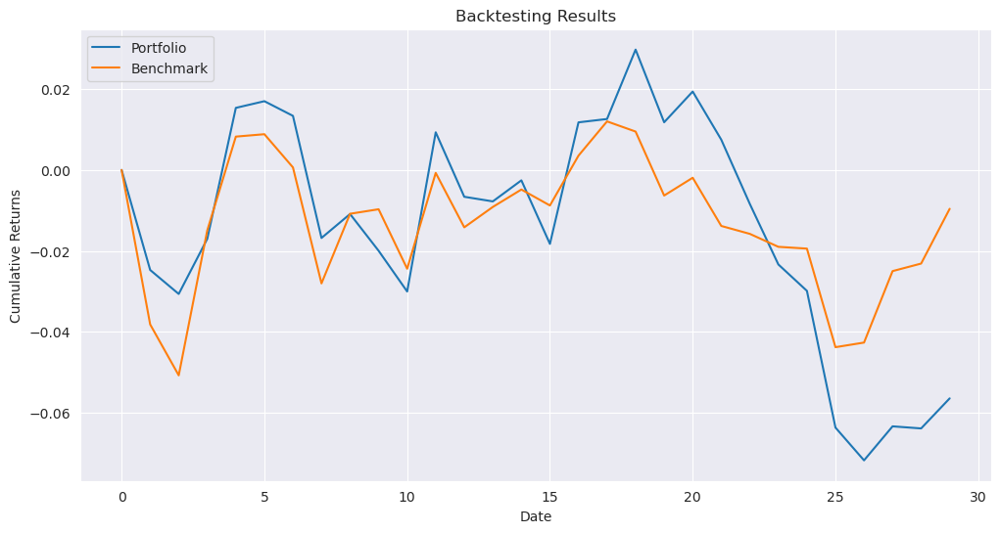

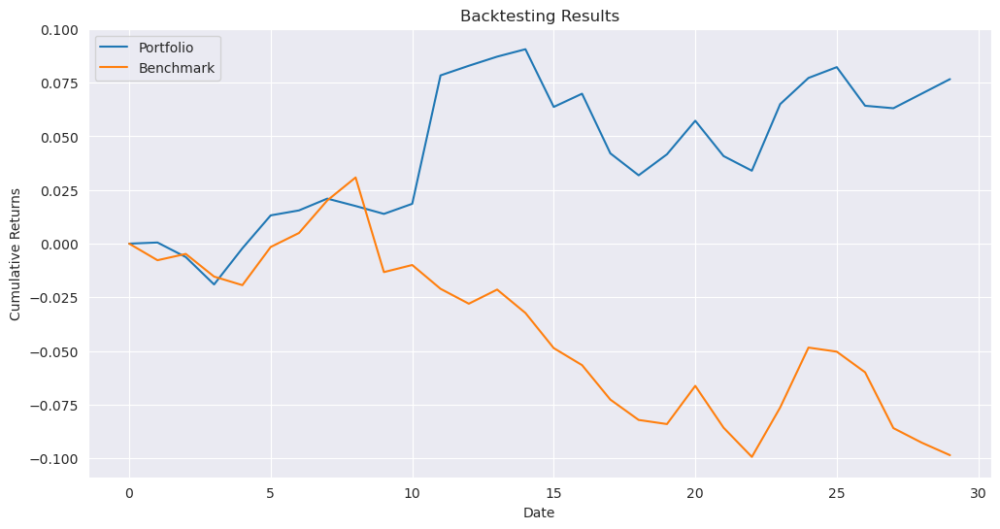

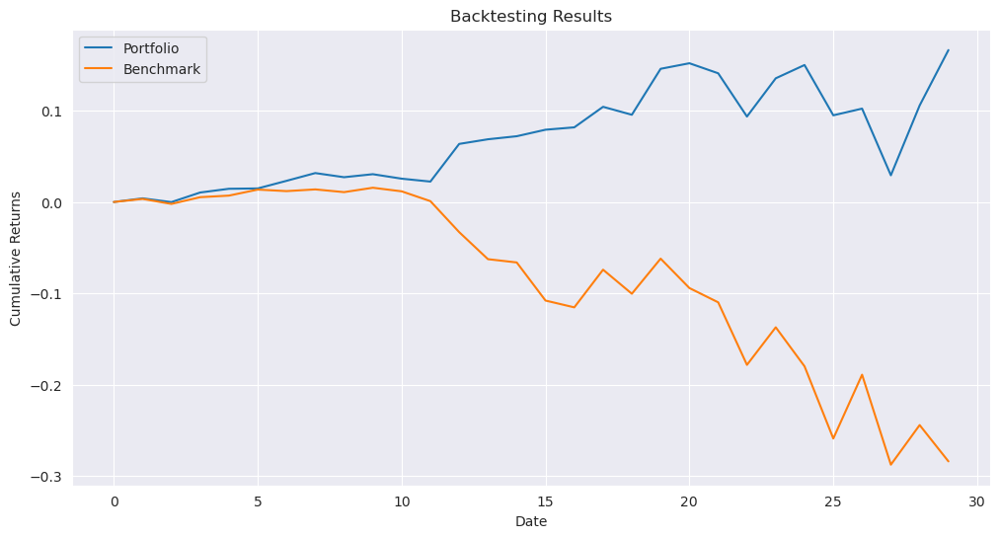

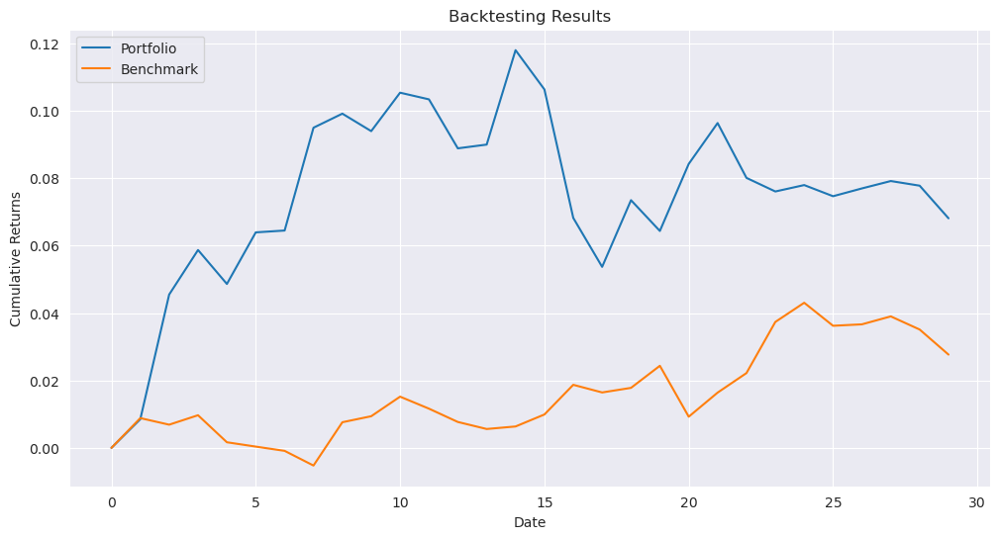

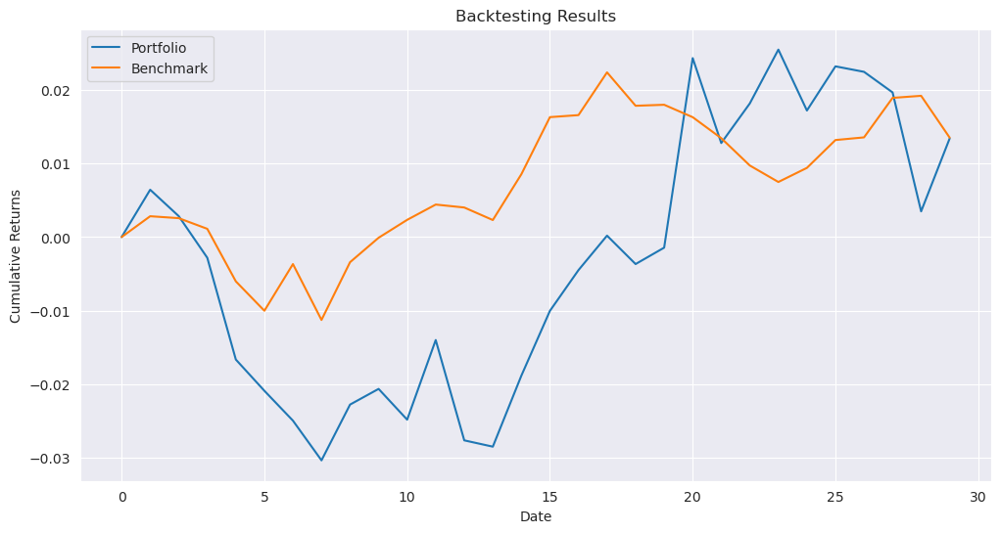

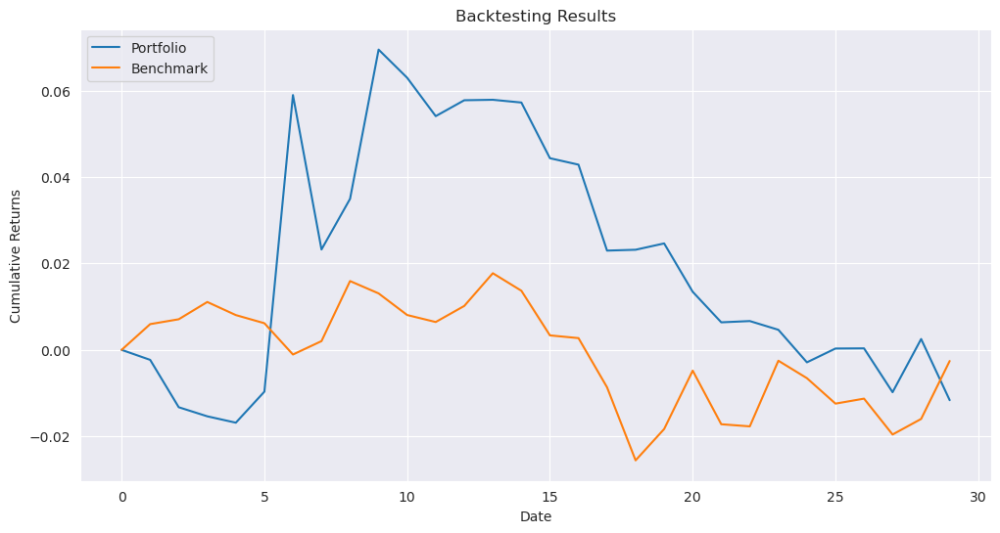

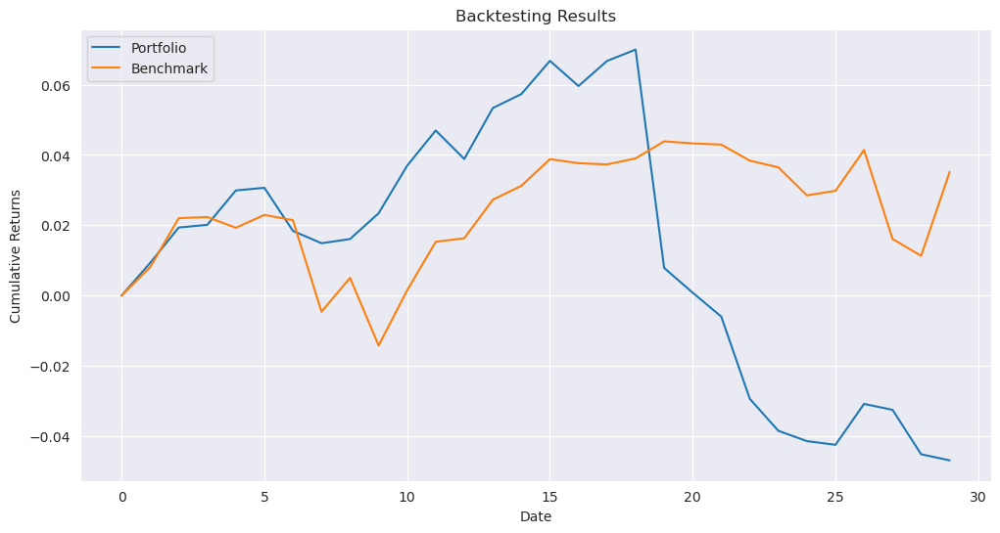

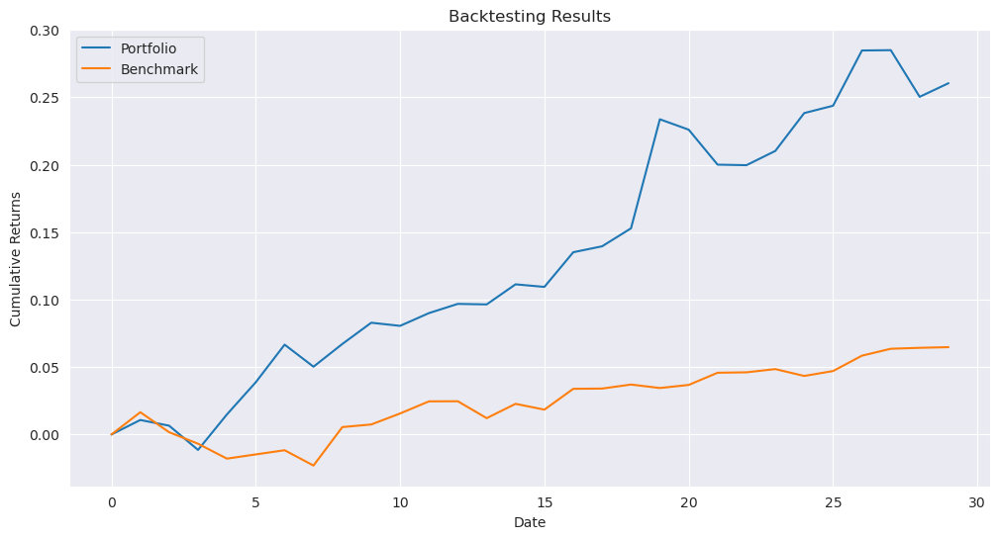

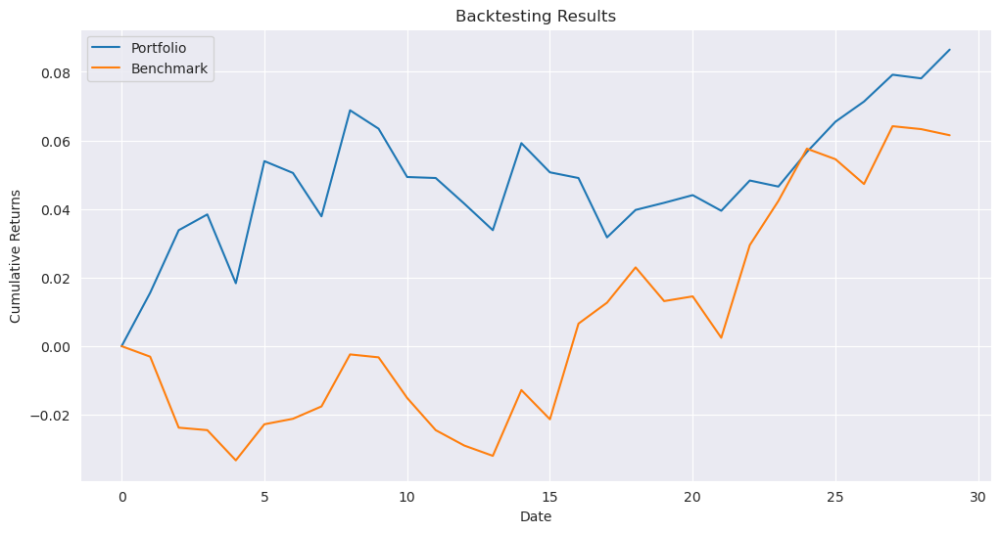

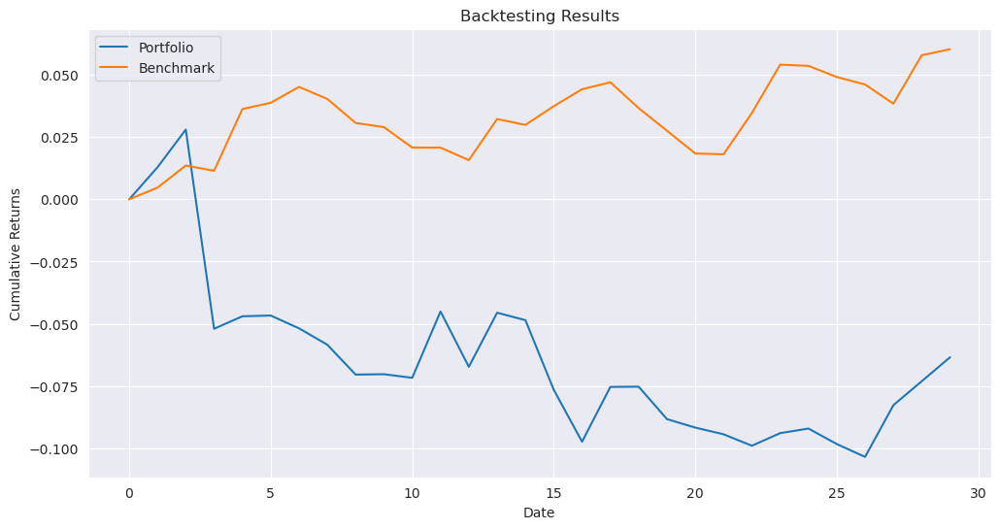

In [31]:
results_path_hrp_100 = '../results/results_100_{}_hrp.pkl'
_ = run_experiment(results_path_hrp_100, data_100, benchmark, opt_fun_hrp, parameters)

#### Pair comparison for Medium test

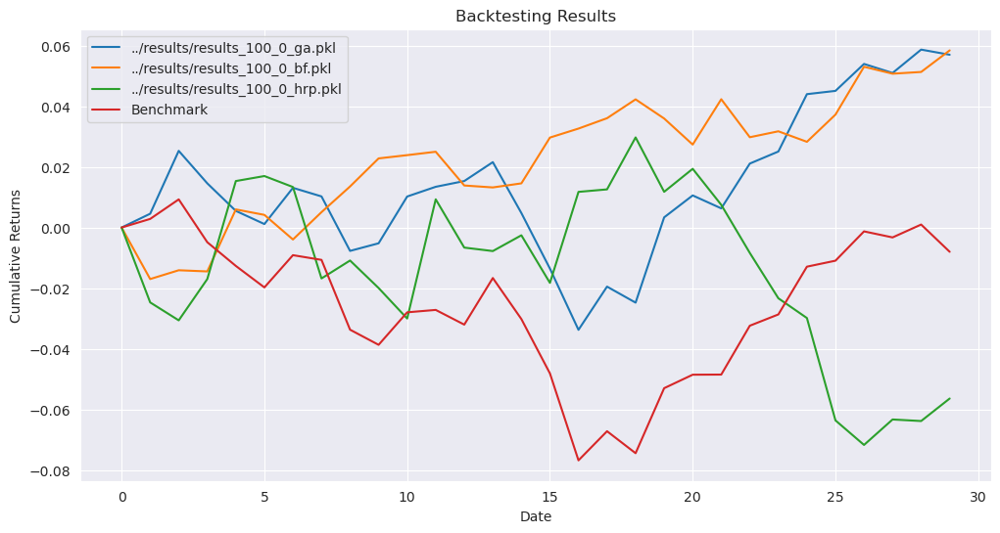

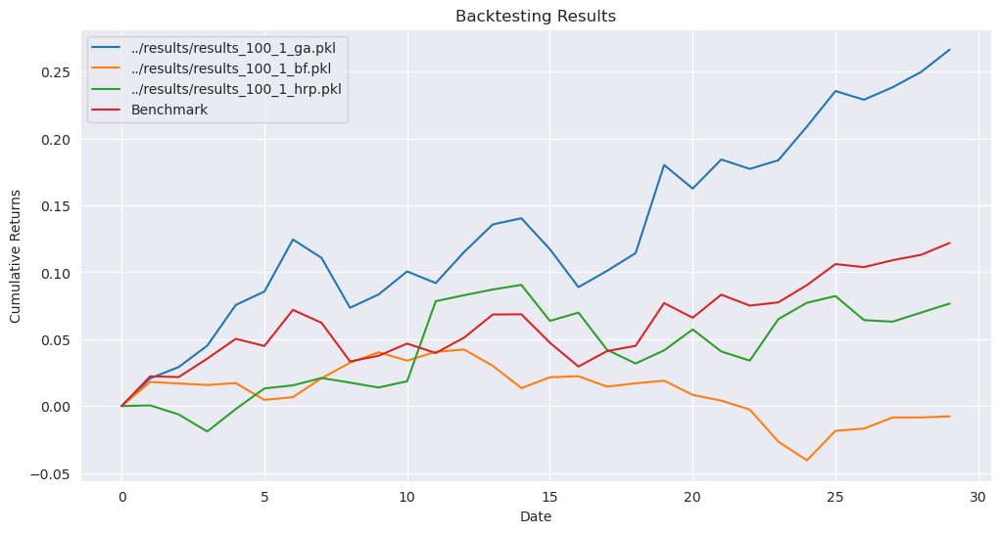

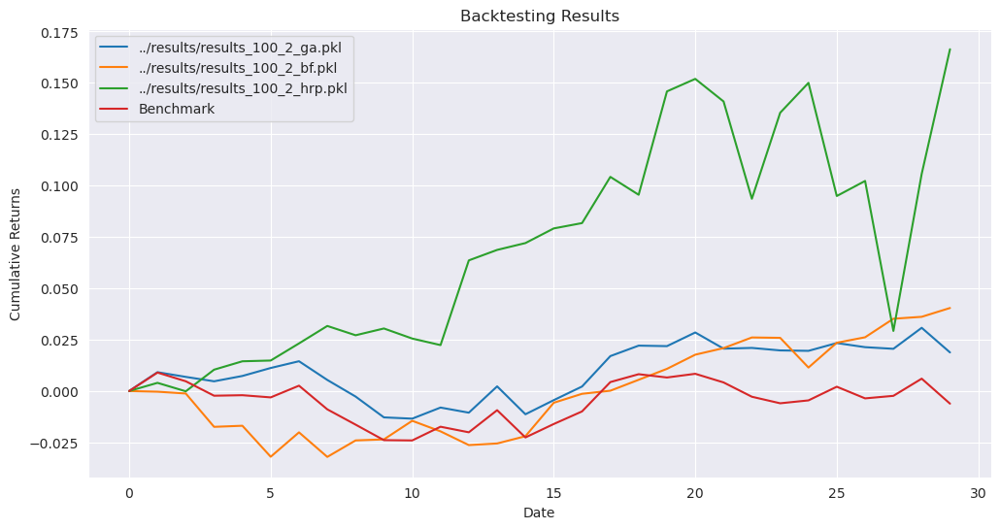

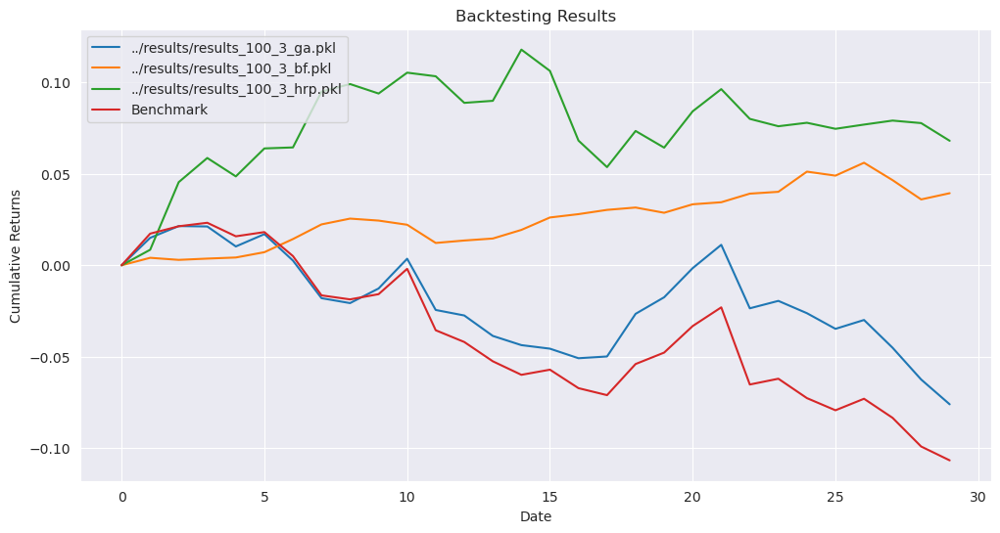

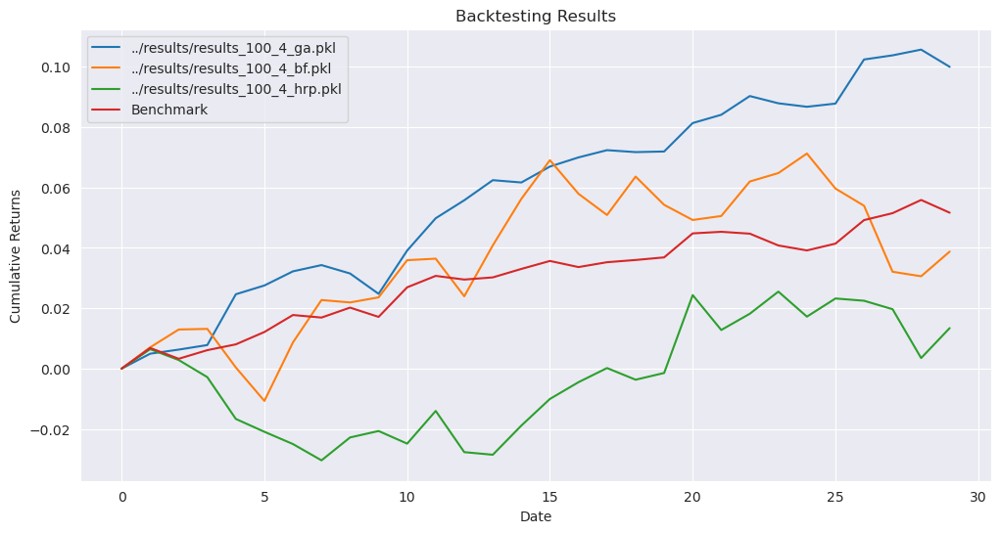

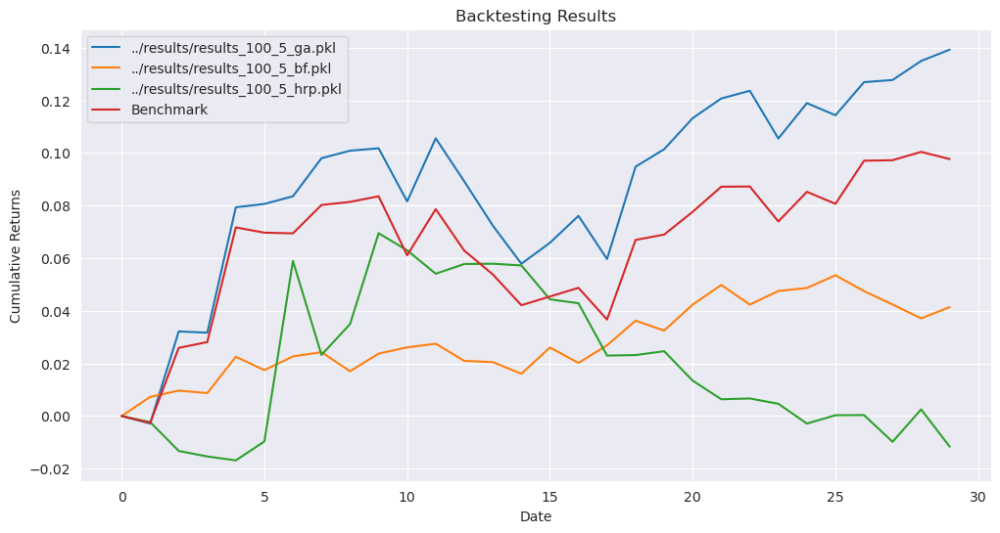

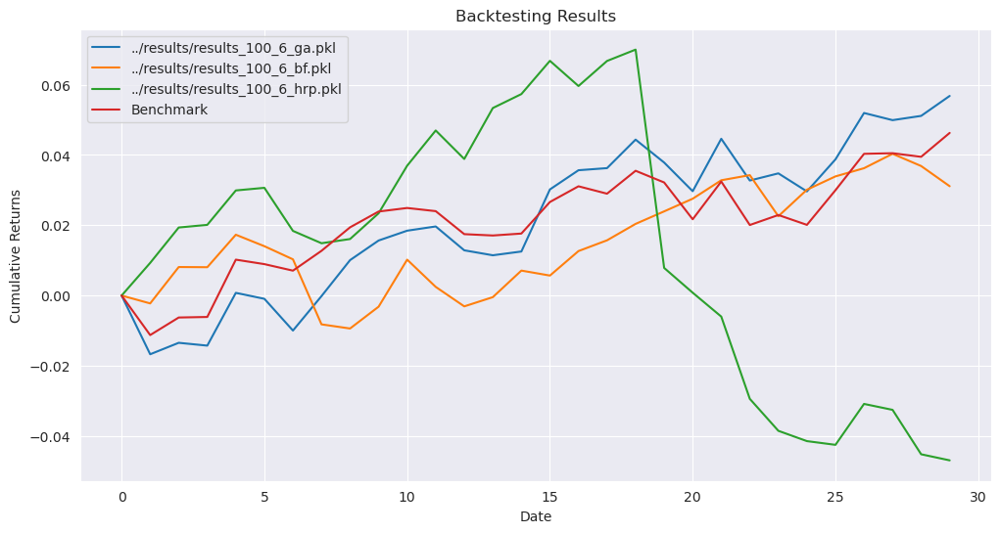

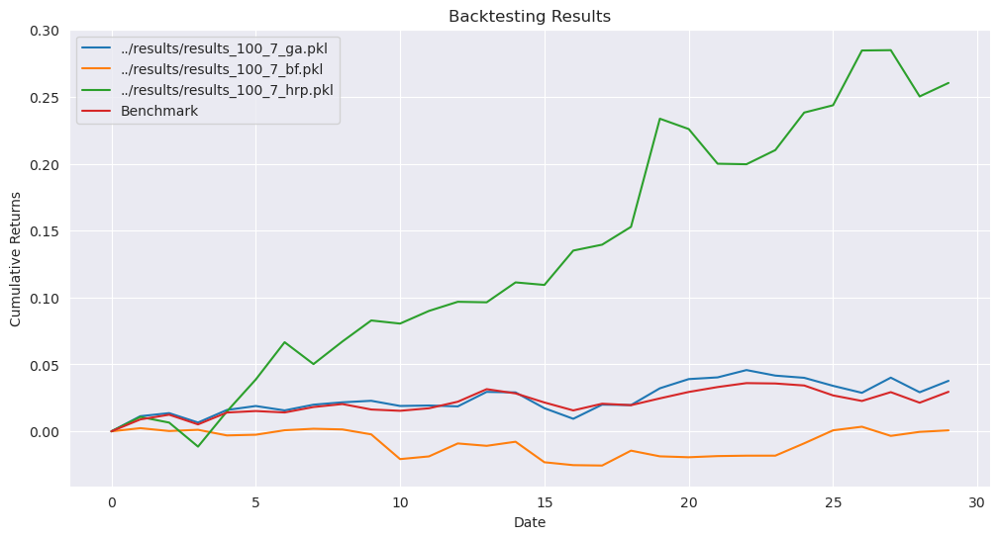

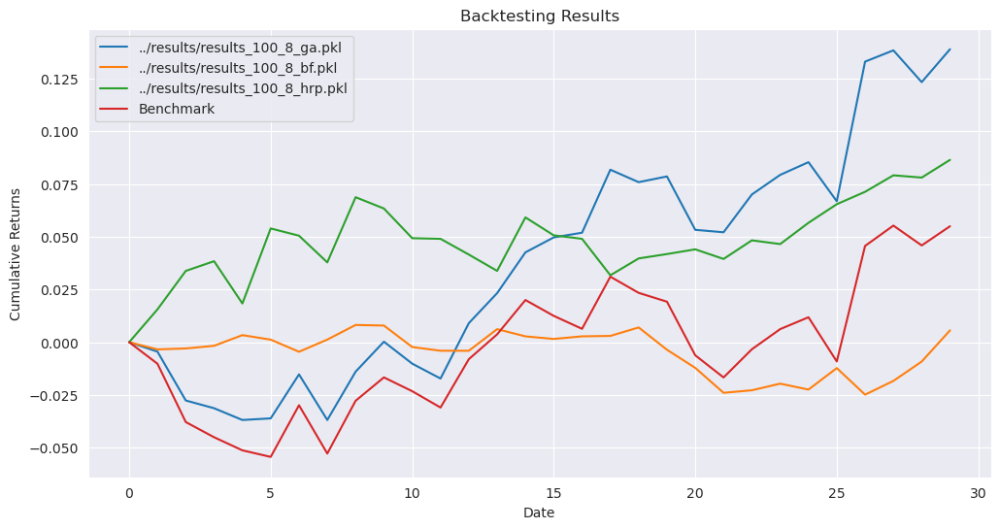

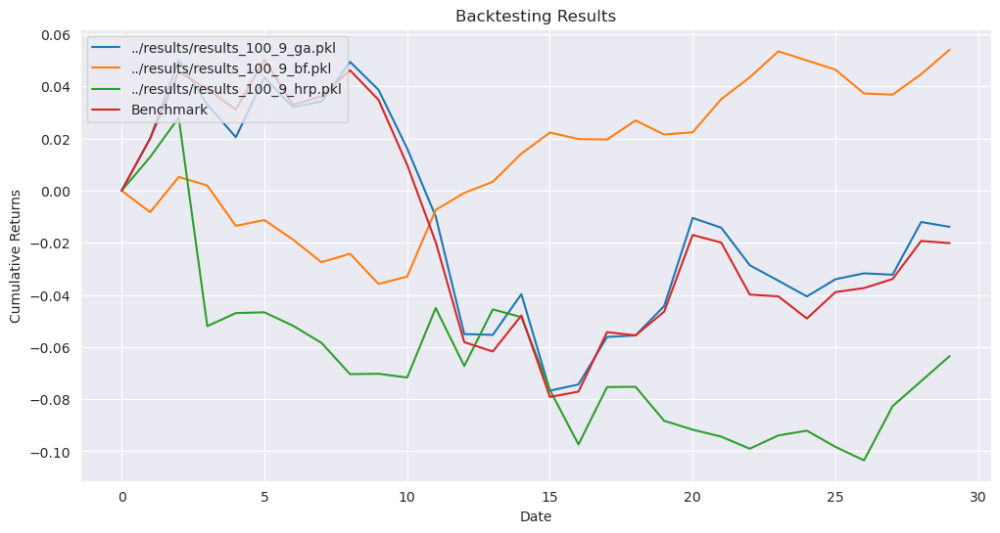

In [32]:
list_paths = ['../results/results_100_{}_ga.pkl', '../results/results_100_{}_bf.pkl', '../results/results_100_{}_hrp.pkl']
n_periods = parameters['n_periods']
trio_comparison(list_paths[0], list_paths[1], list_paths[2], n_periods)

### Full dataset

### GA

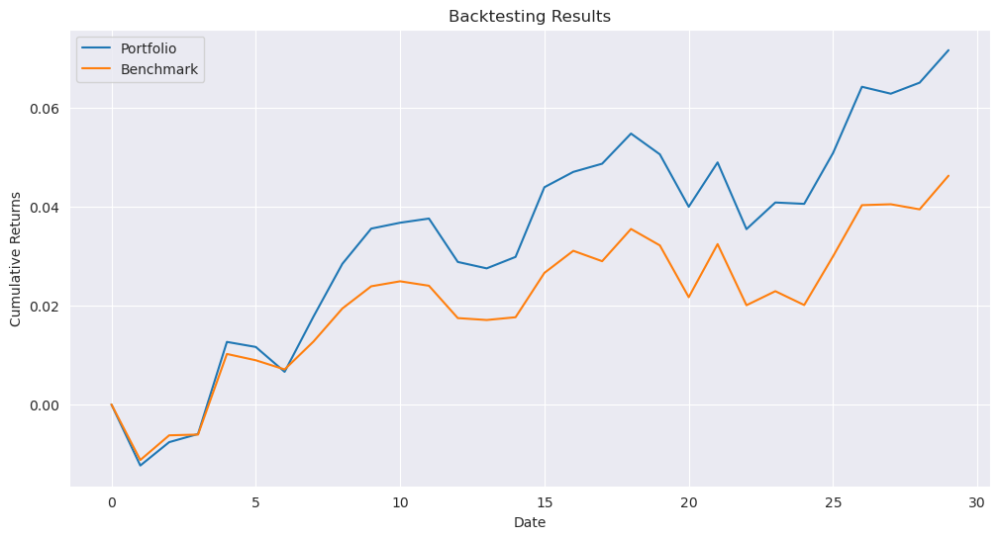

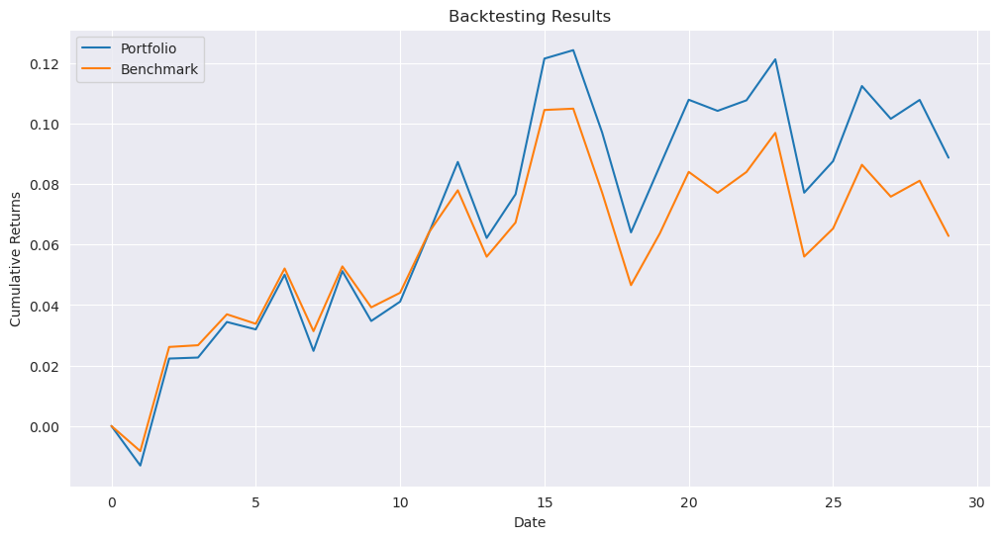

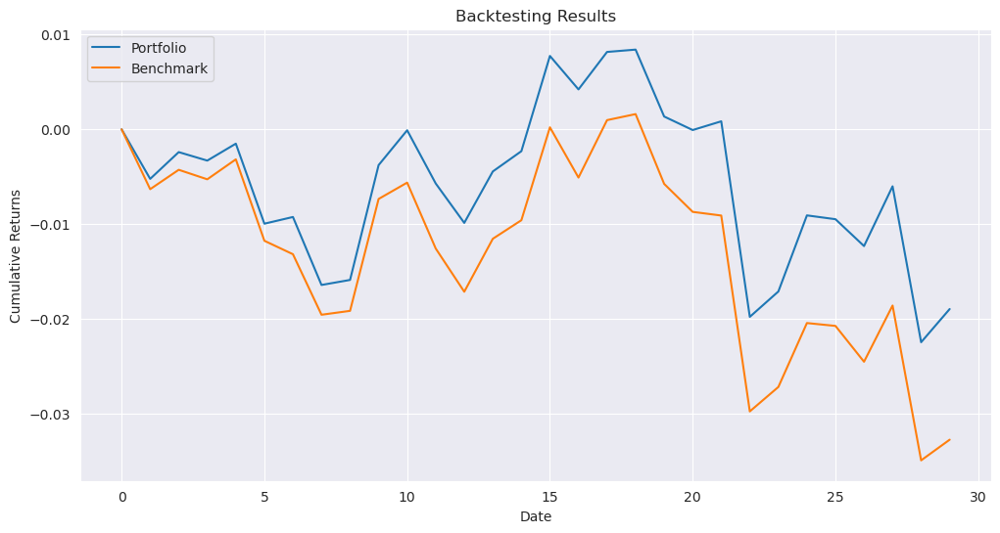

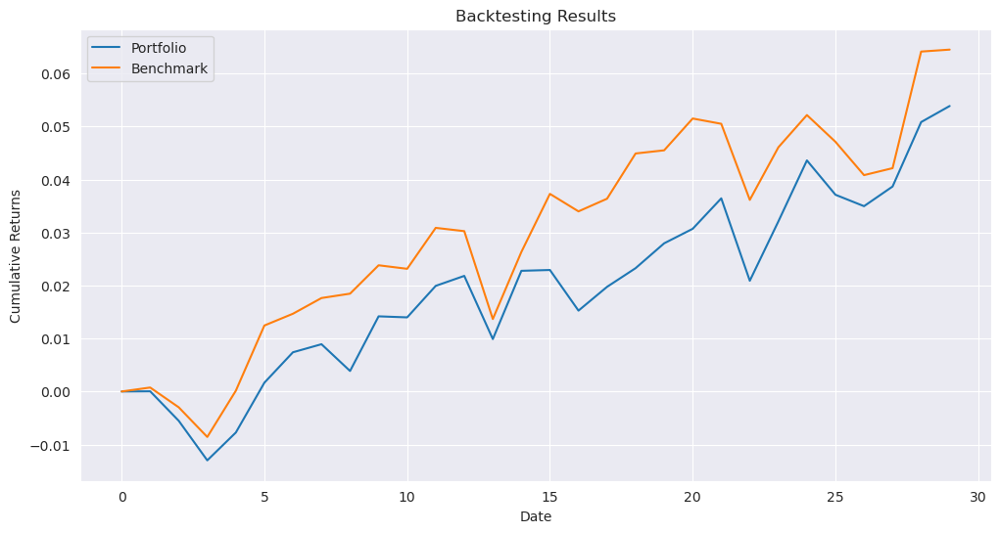

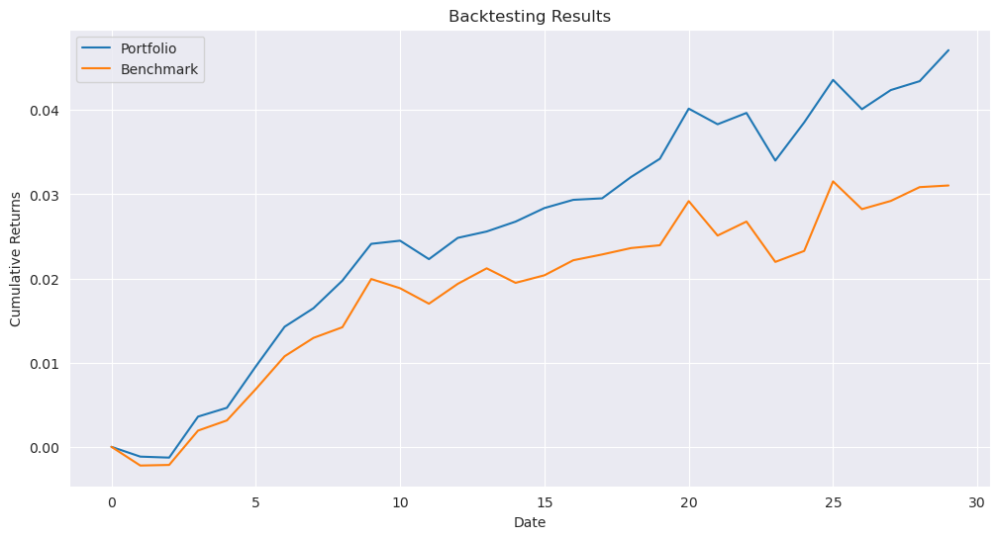

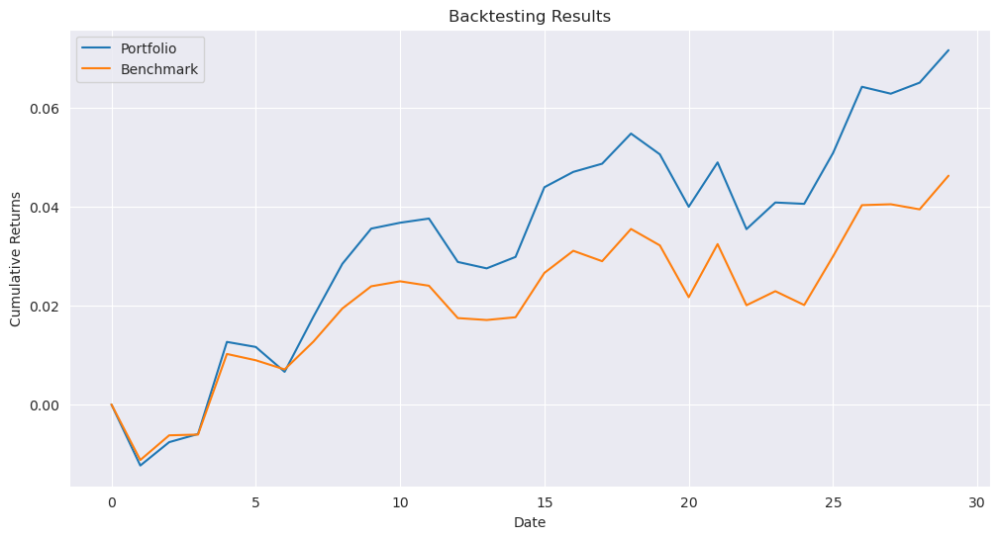

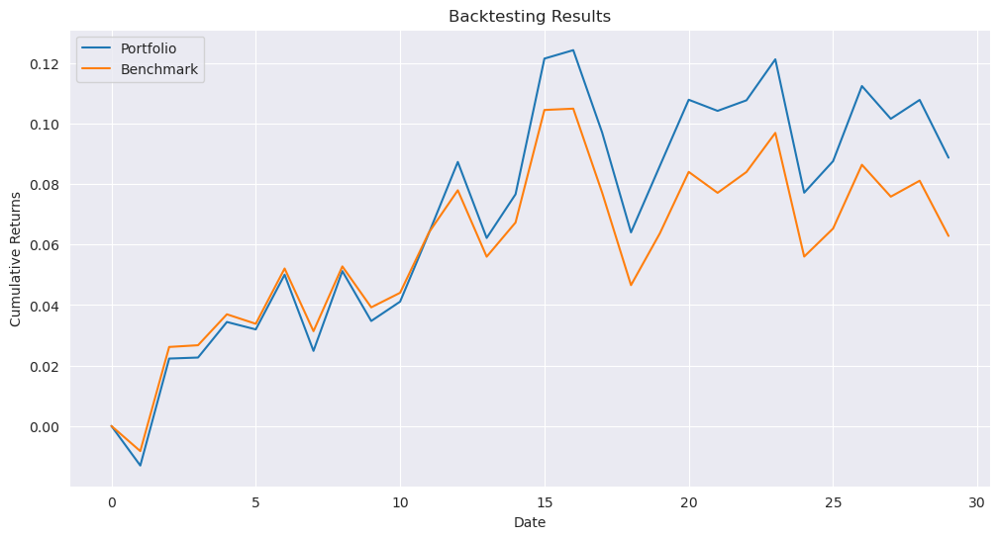

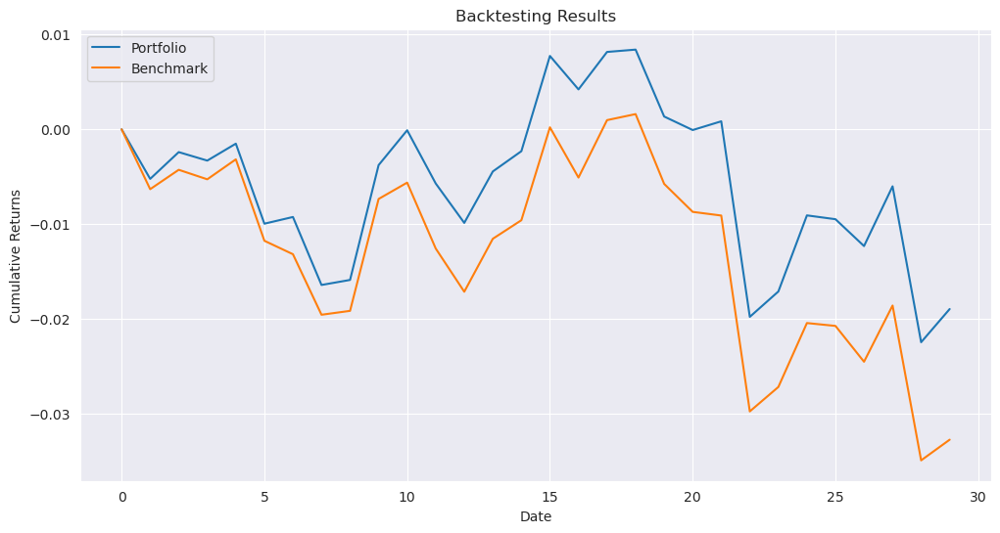

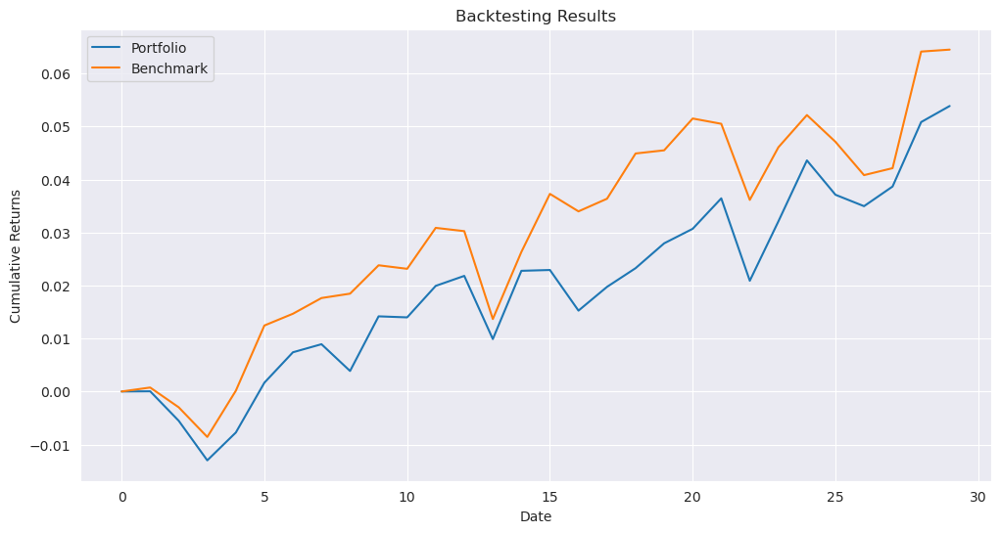

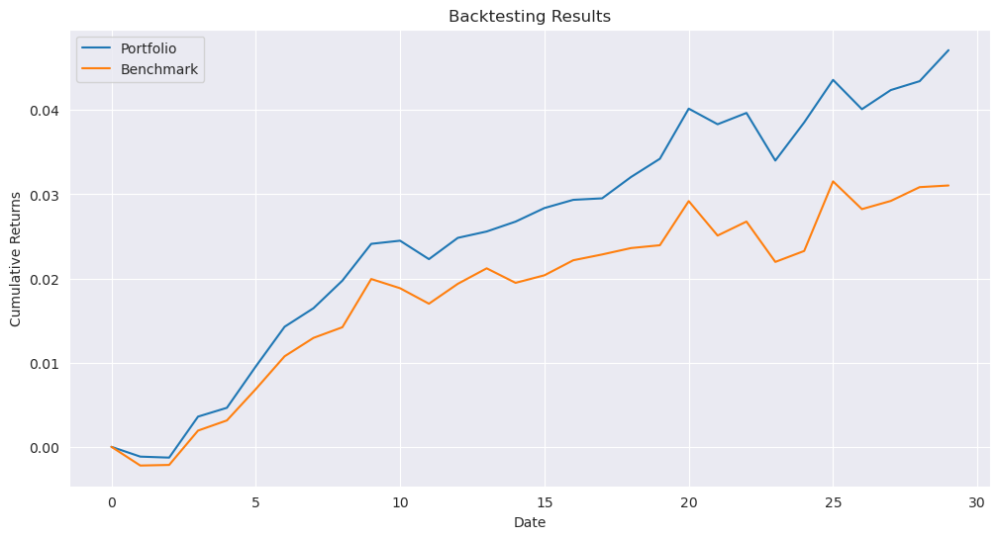

In [33]:
results_path_ga_full = '../results/results_full_{}_ga.pkl'
_ = run_experiment(results_path_ga_full, source, benchmark, opt_fun_ga, parameters)

### BF

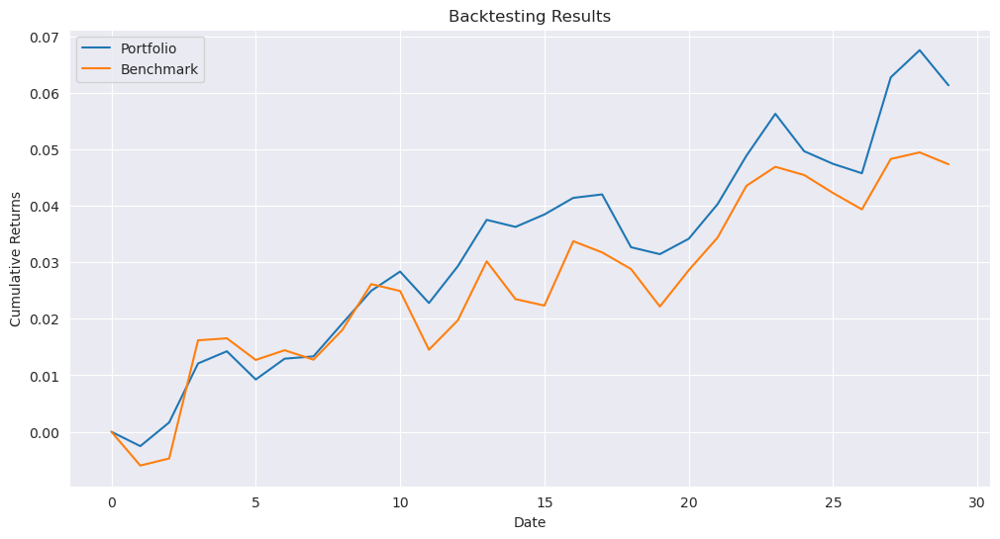

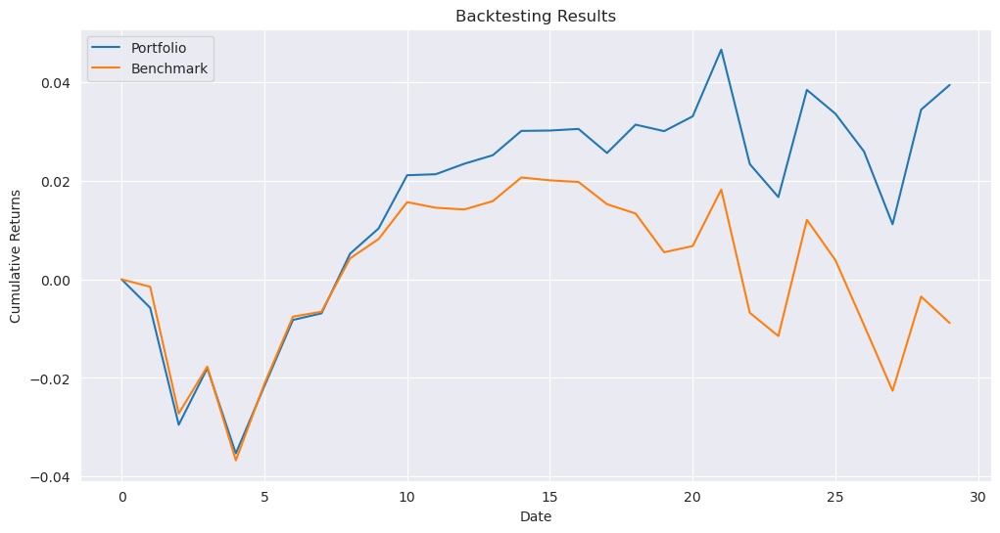

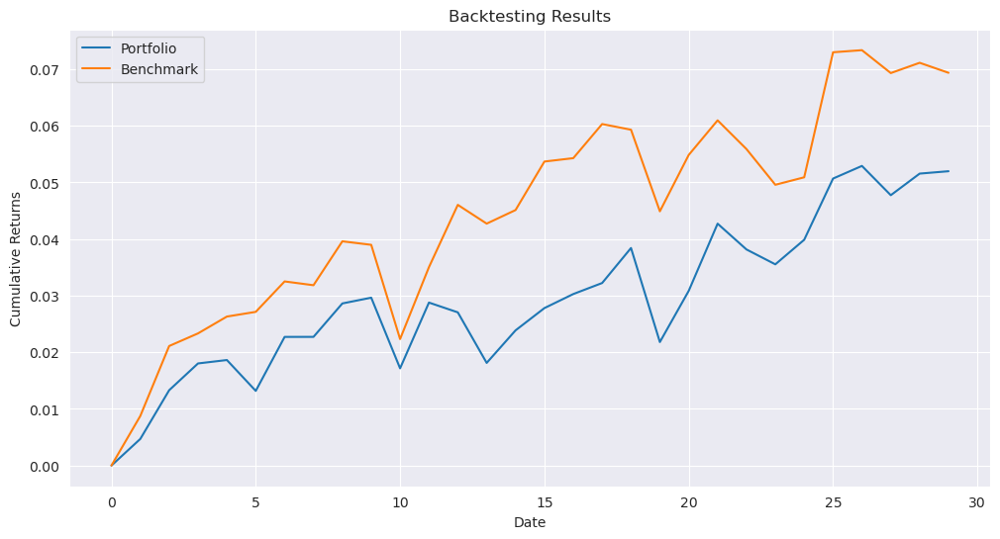

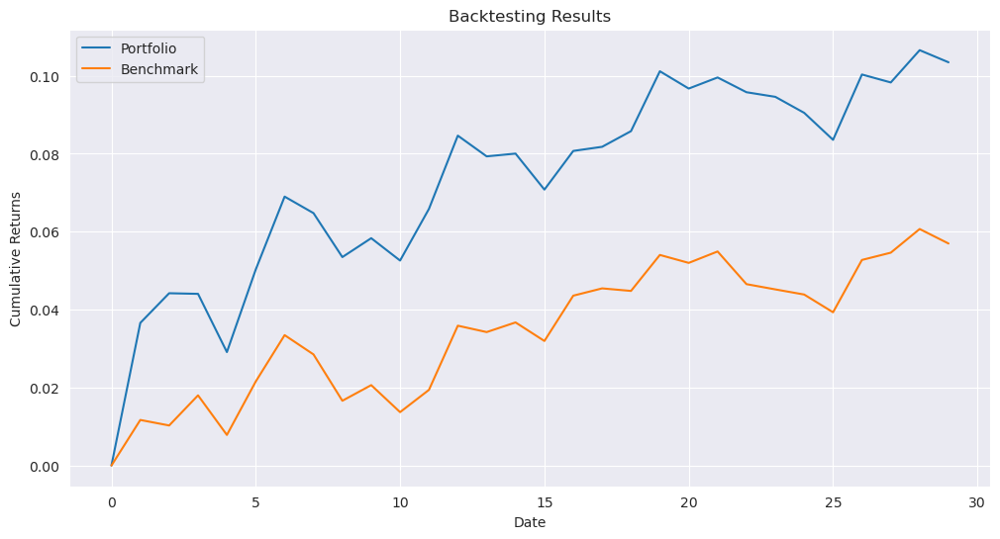

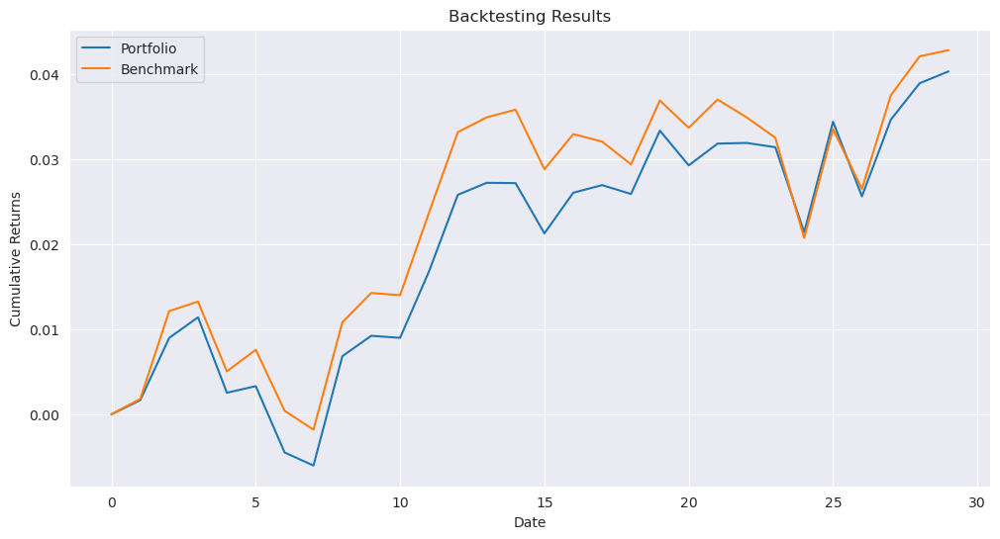

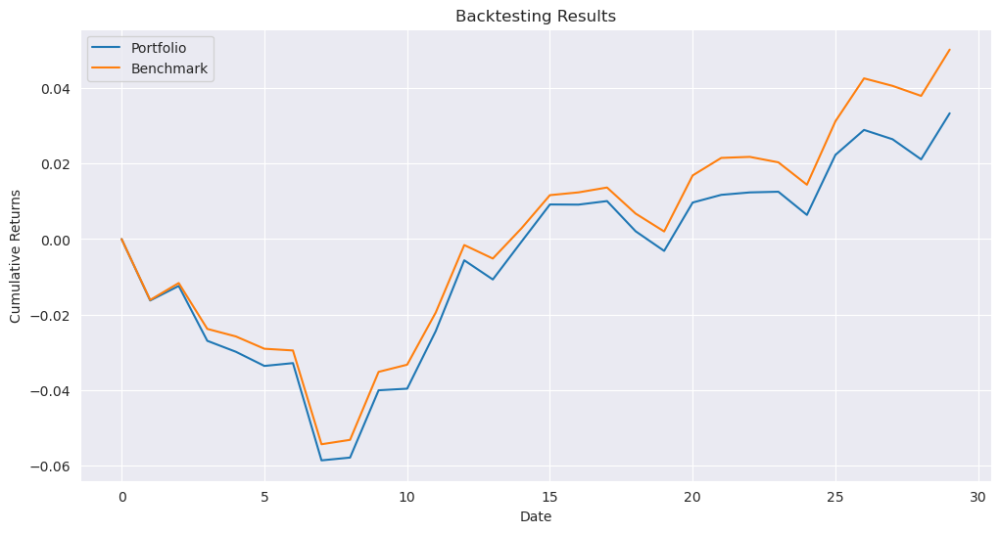

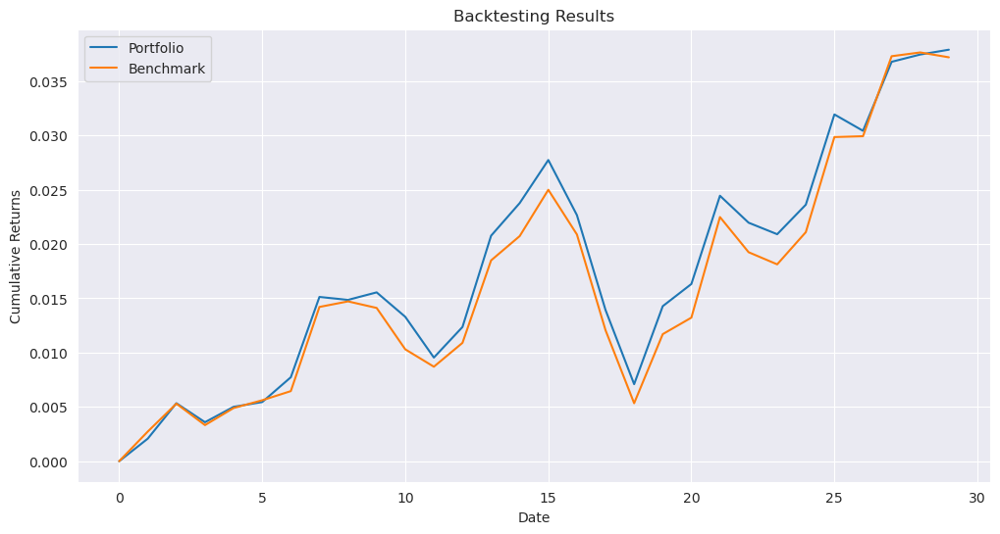

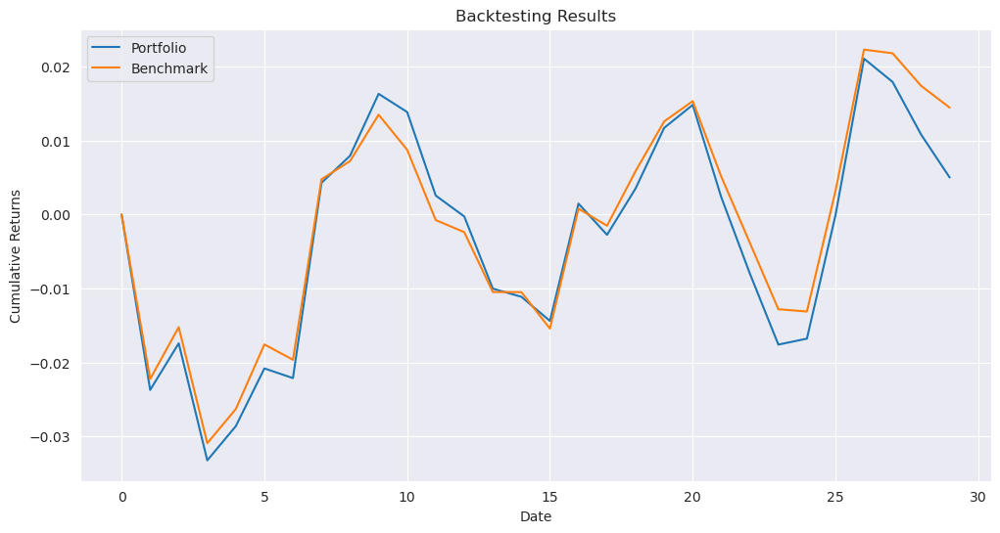

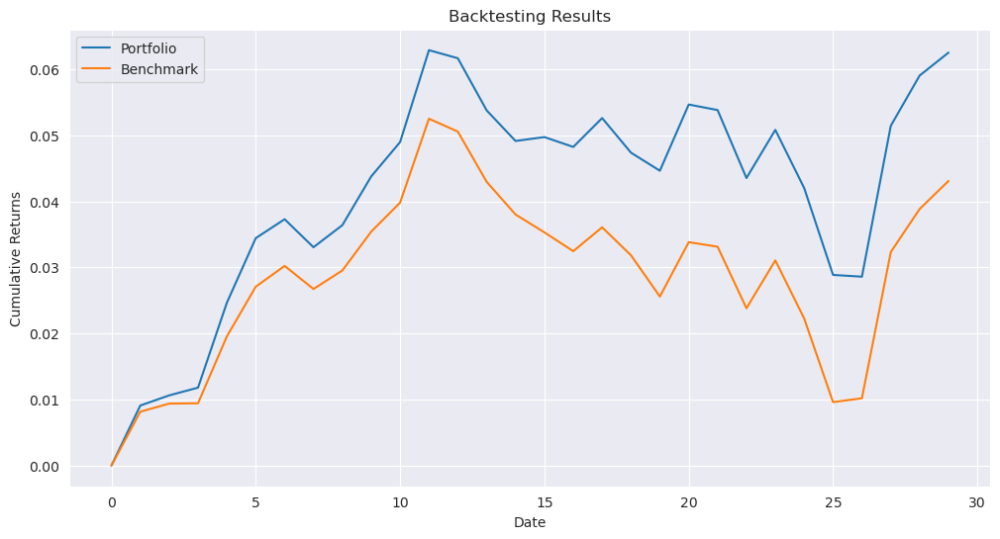

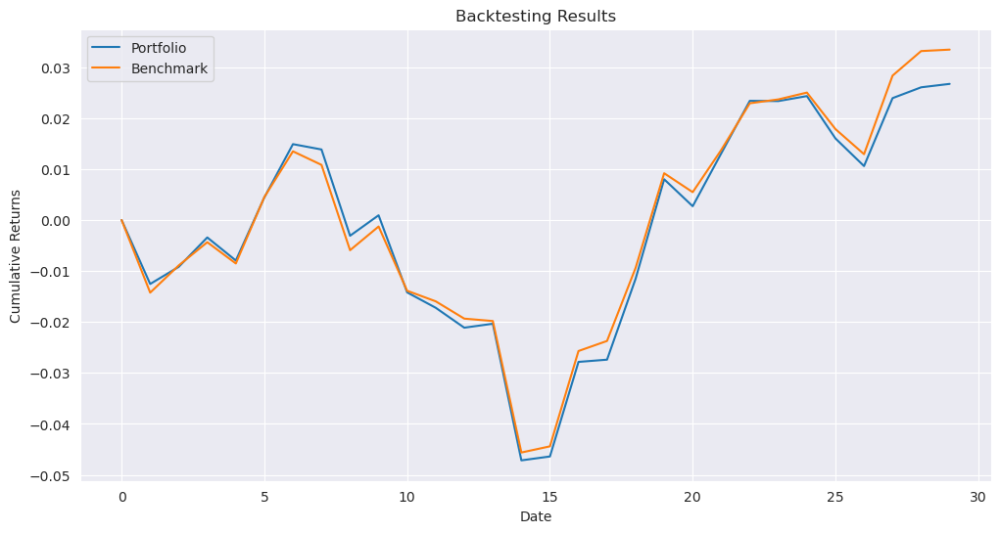

In [34]:
results_path_bf_full = '../results/results_full_{}_bf.pkl'
_ = run_experiment(results_path_bf_full, source, benchmark, opt_fun_bf, parameters)

#### HRP

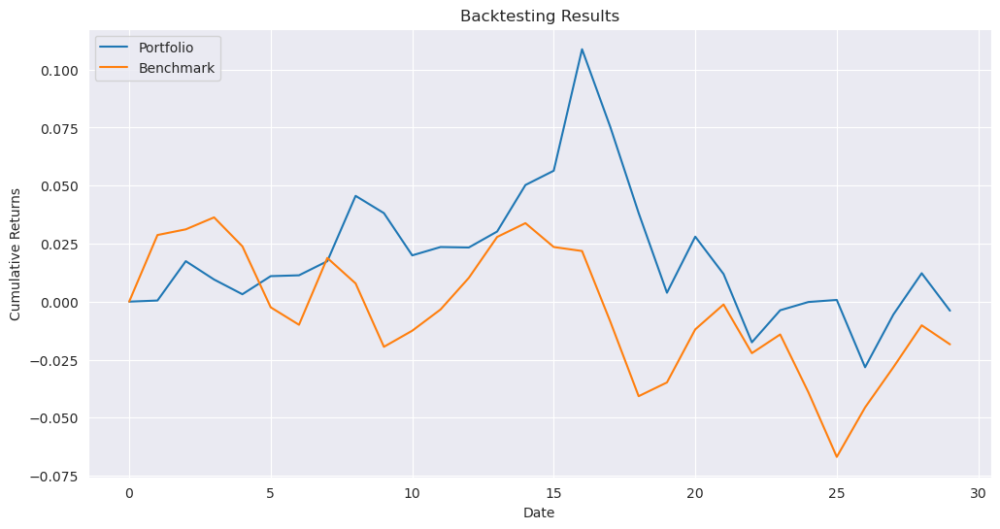

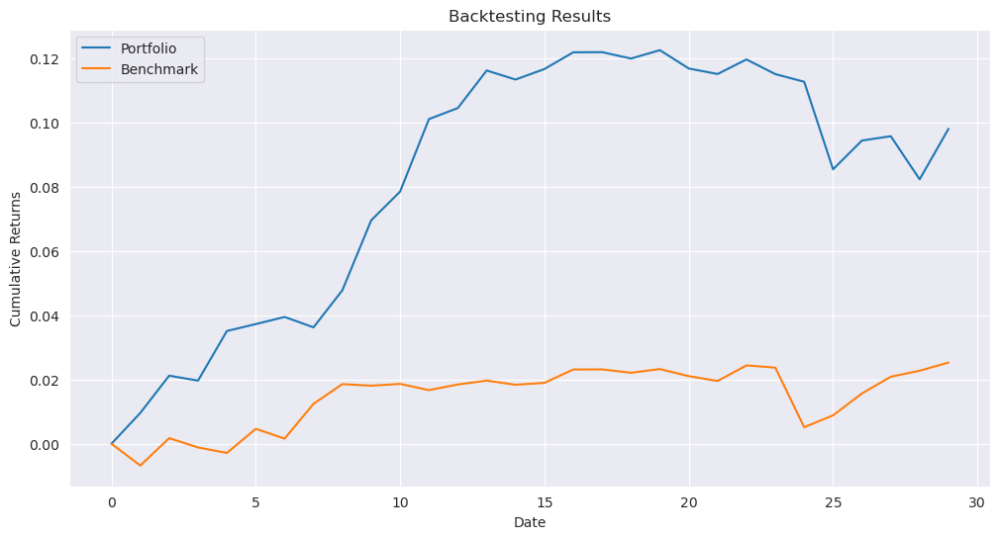

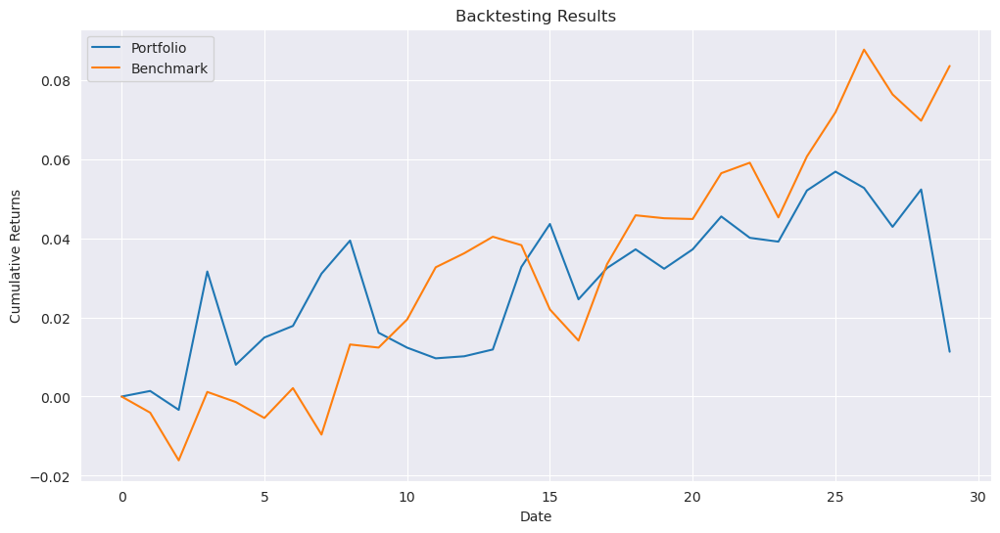

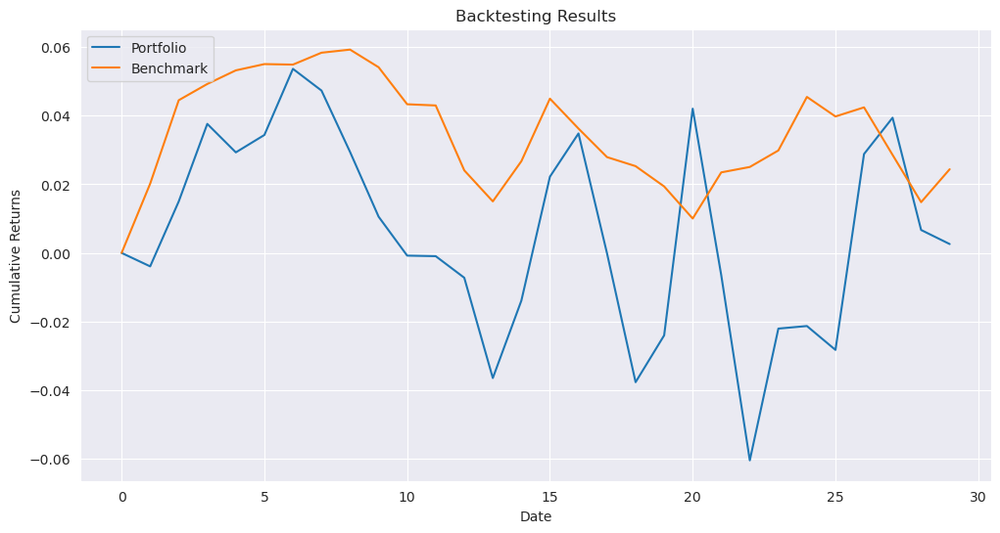

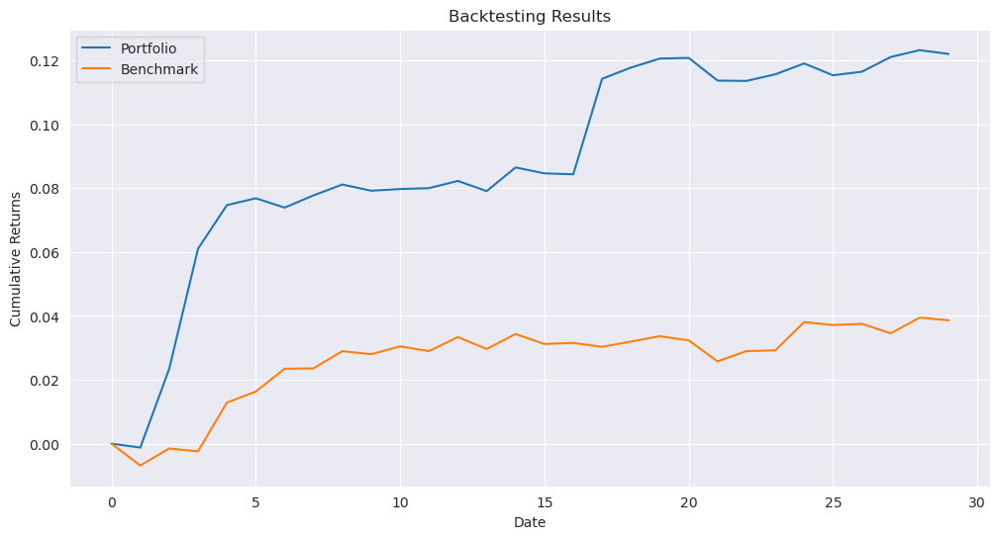

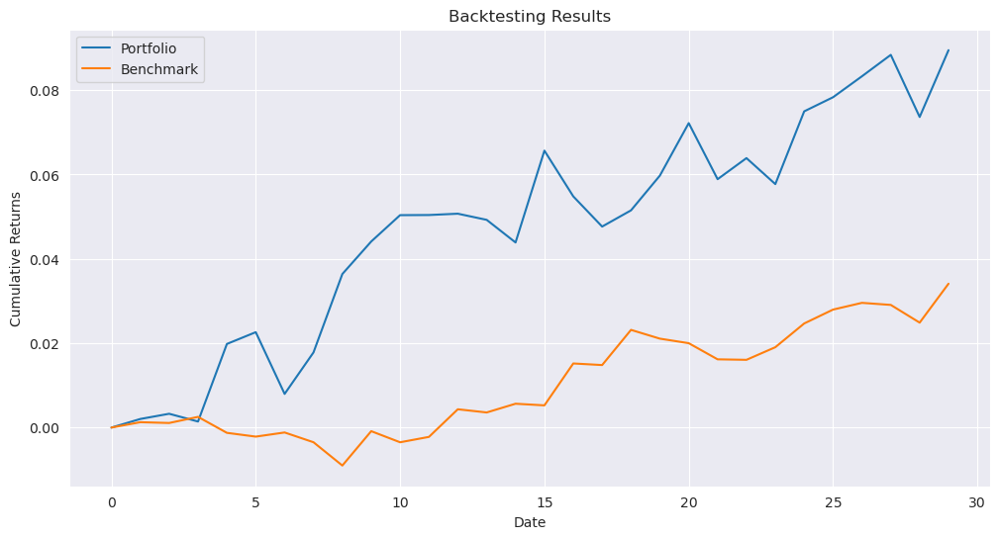

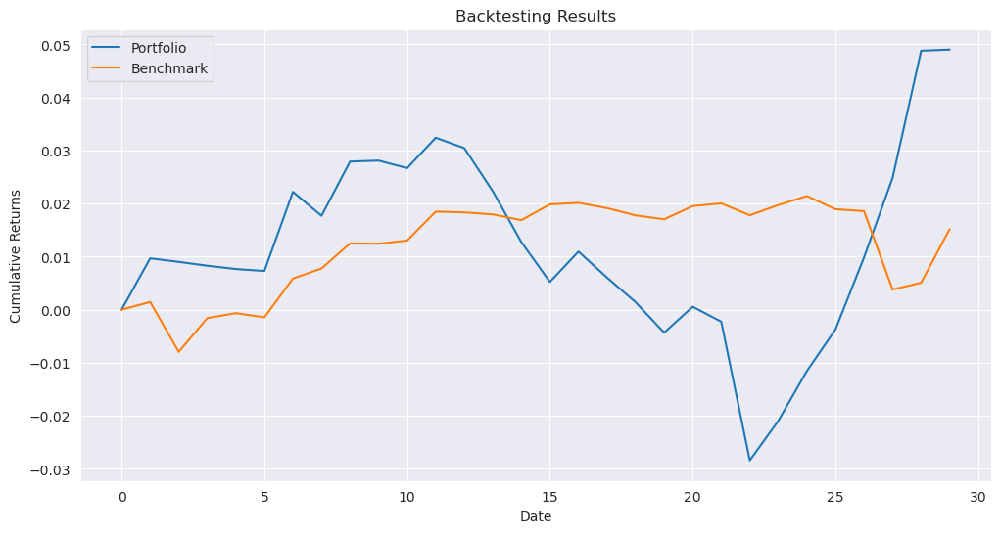

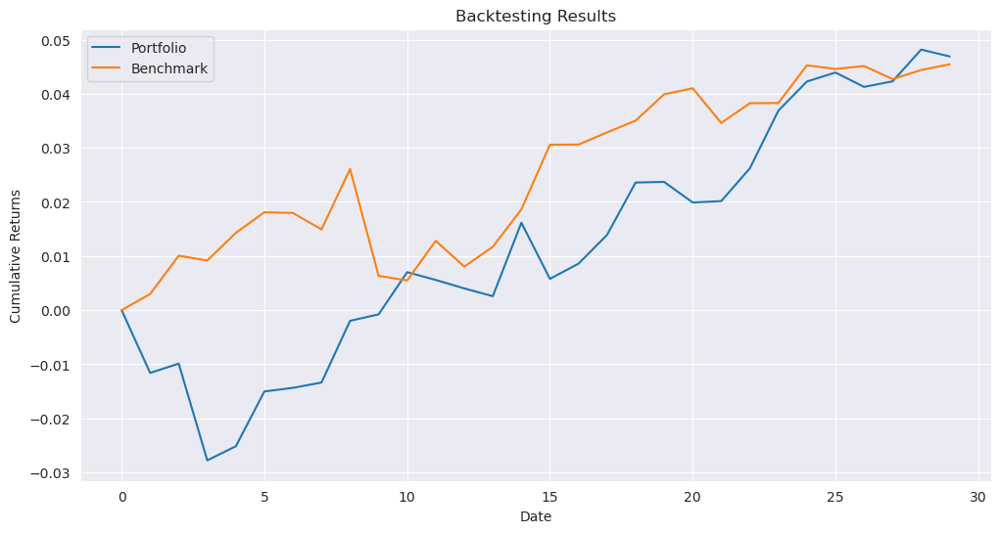

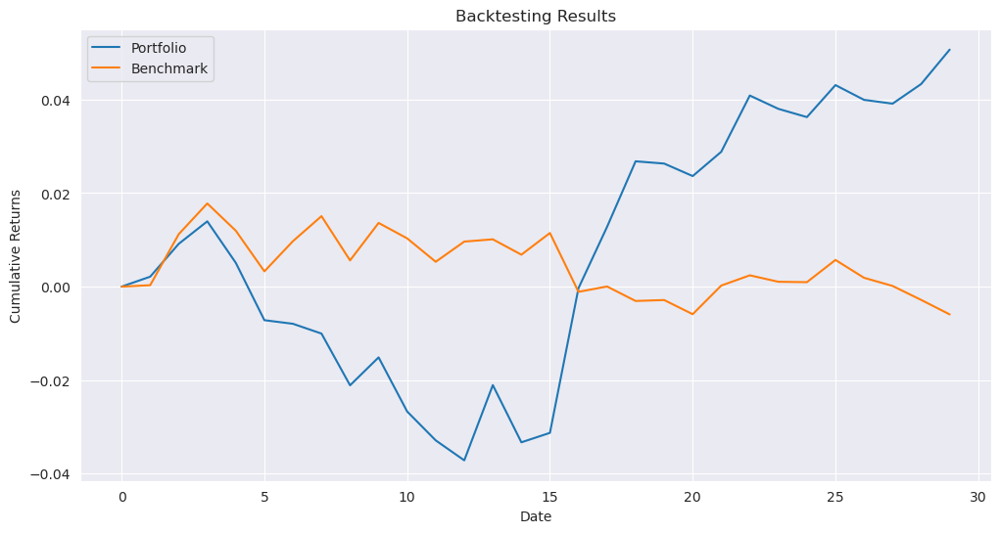

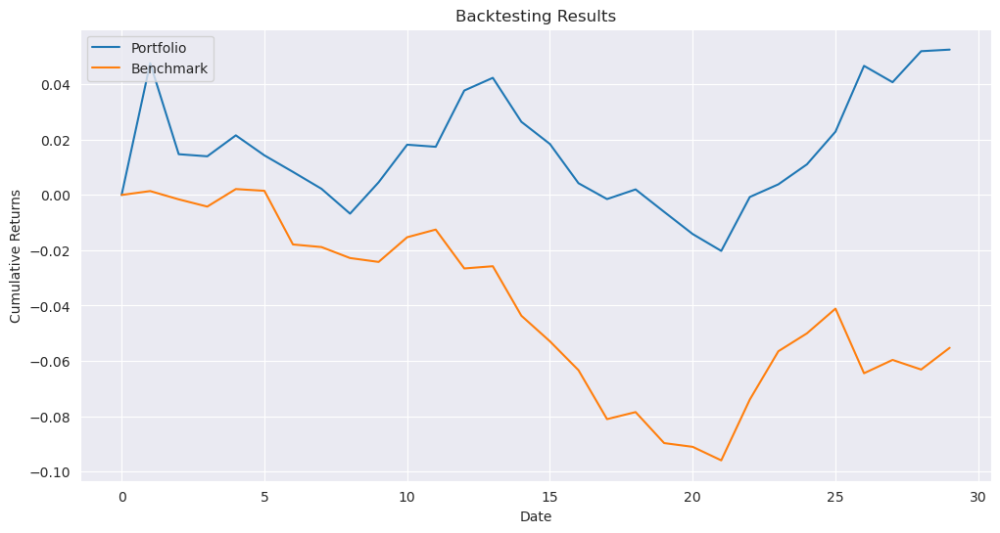

In [35]:
results_path_hrp_full = '../results/results_full_{}_hrp.pkl'
_ = run_experiment(results_path_hrp_full, source, benchmark, opt_fun_hrp, parameters)

### Comparison for full dataset

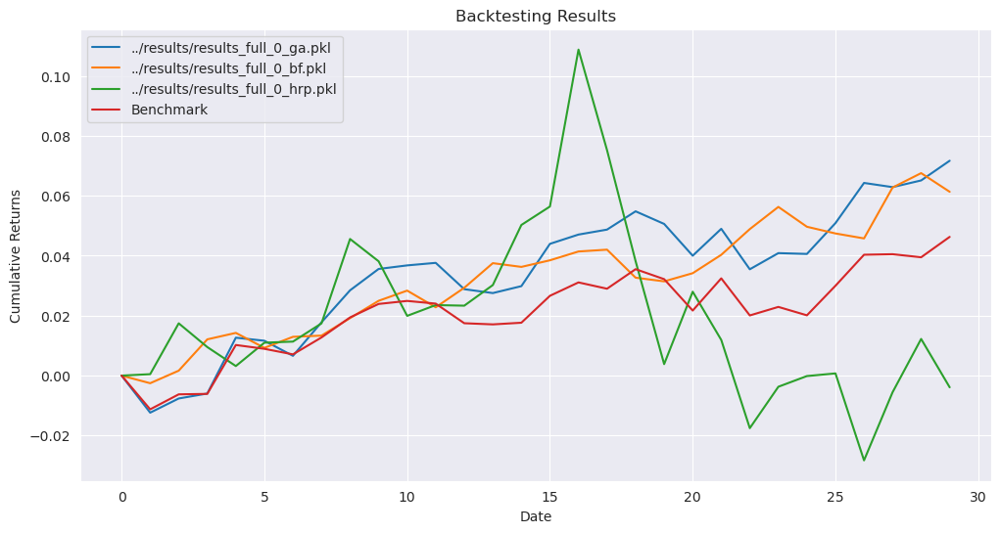

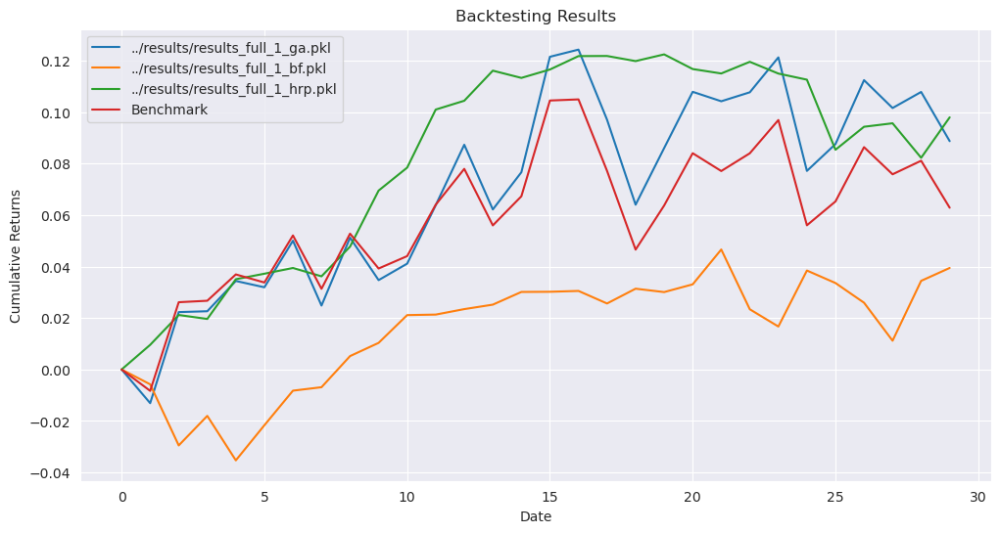

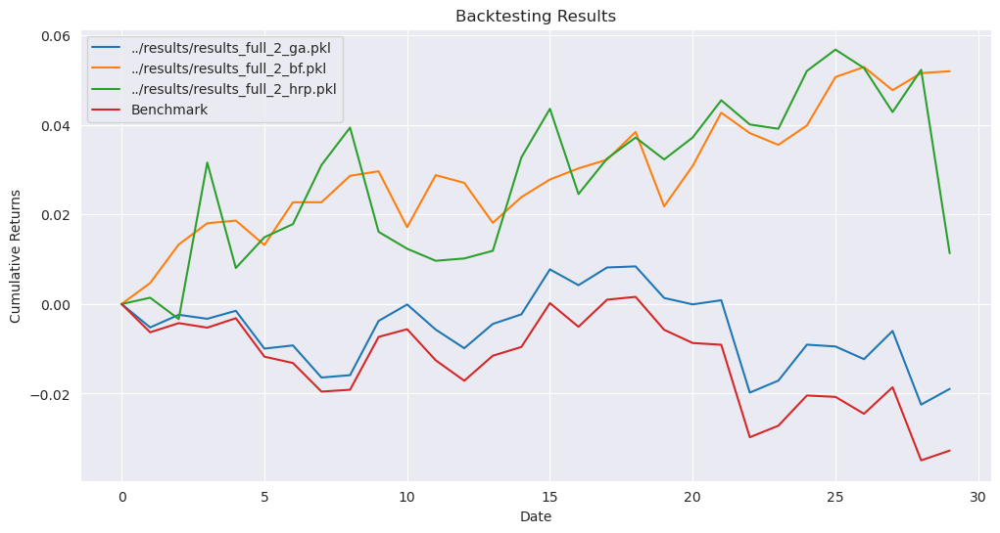

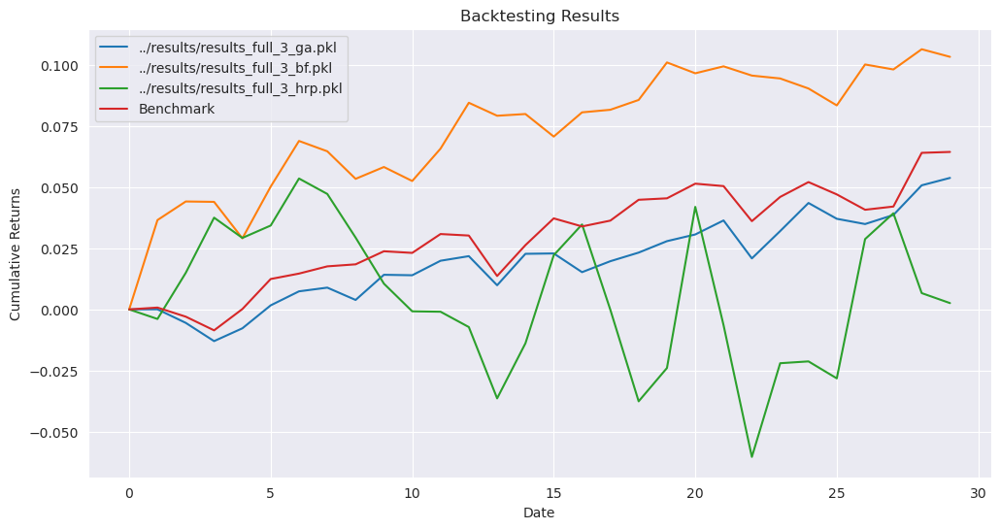

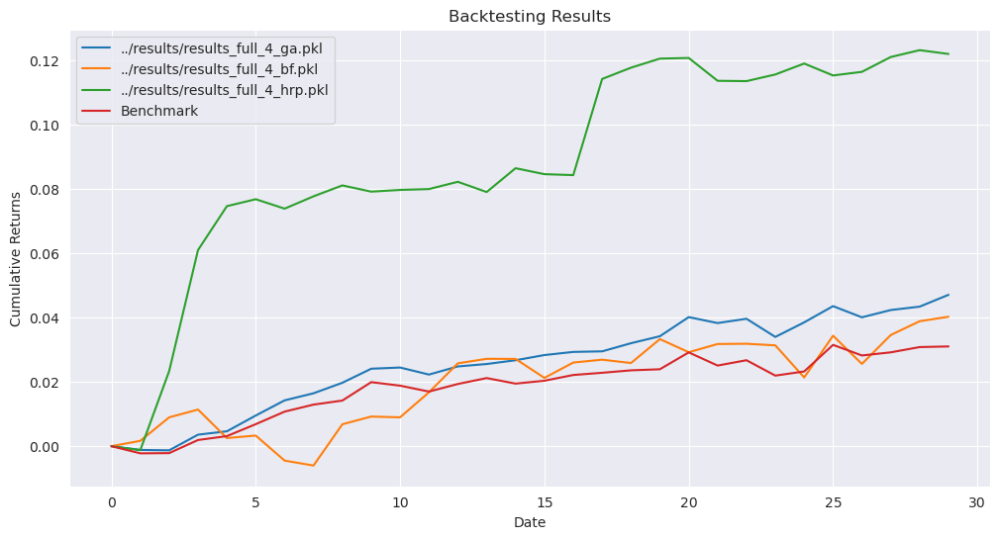

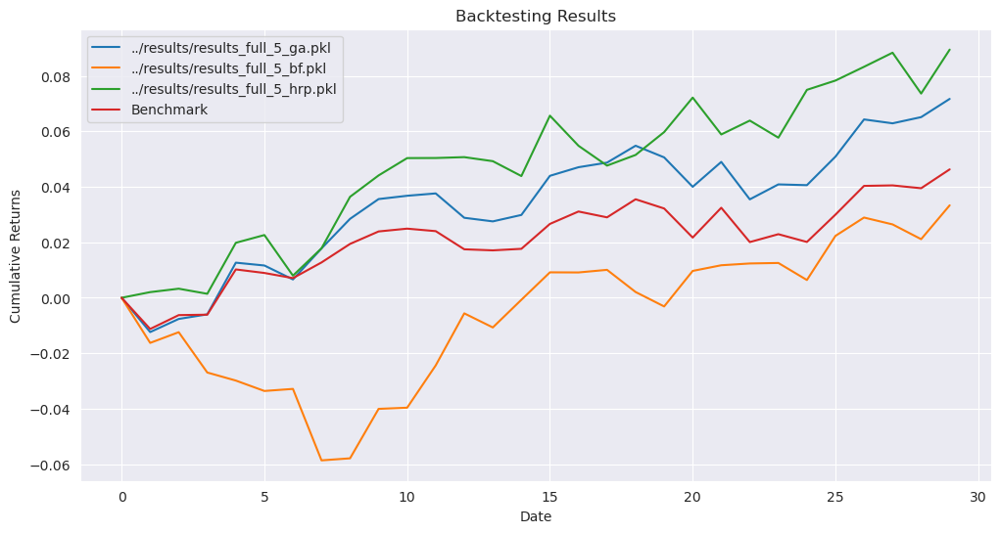

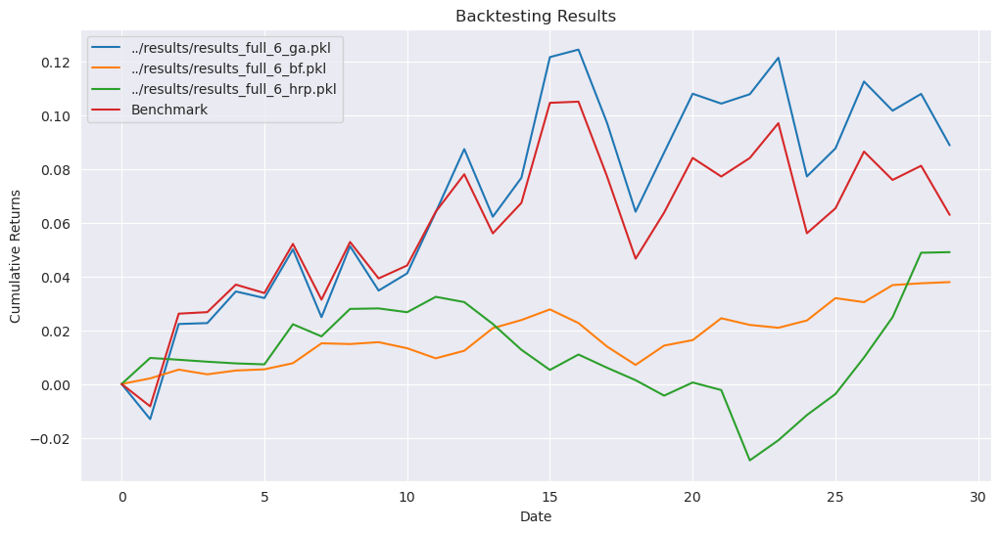

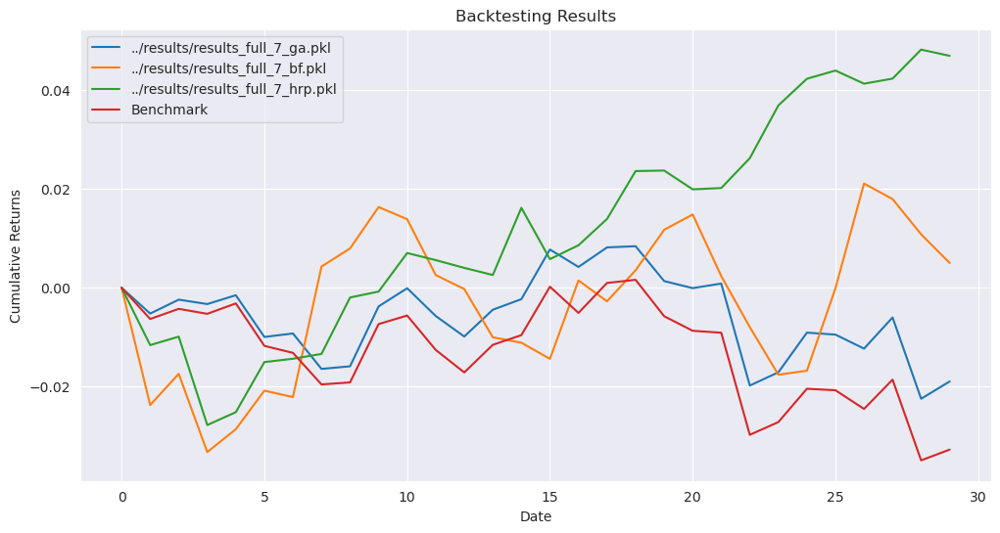

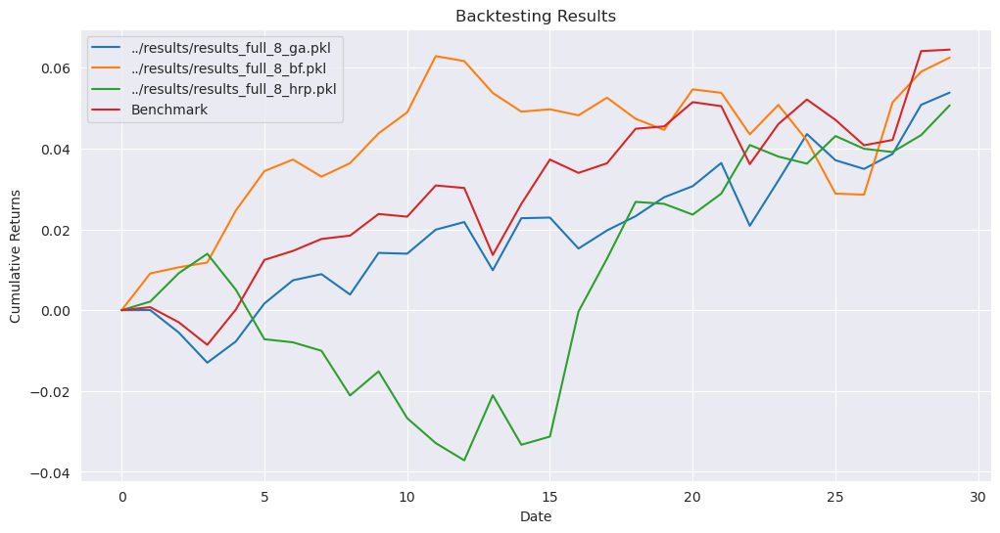

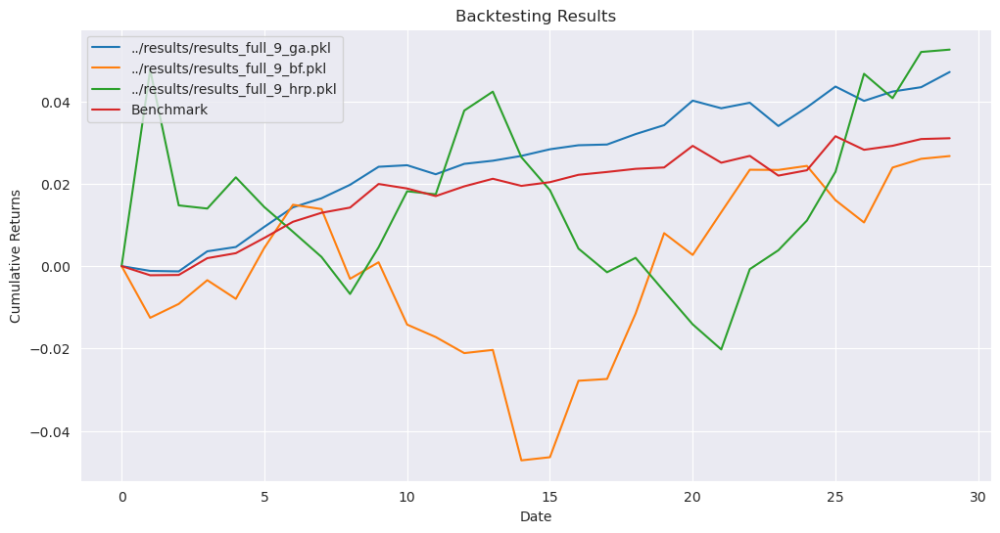

In [36]:
list_paths = ['../results/results_full_{}_ga.pkl', '../results/results_full_{}_bf.pkl', '../results/results_full_{}_hrp.pkl']
n_periods = parameters['n_periods']
trio_comparison(list_paths[0], list_paths[1], list_paths[2], n_periods)